# Explainable Plant Disease Detection on PlantDoc — Rebuilt Training + Export Pipeline



## Environment setup


In [ ]:


!pip -q install --upgrade pip
!pip -q install grad-cam torchinfo tensorflow-datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 32.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


## Imports and runtime checks


In [ ]:

import os
import gc
import math
import json
import hashlib
import time
import random
import re
import shutil
import warnings
from pathlib import Path
from collections import Counter
from itertools import combinations
from html import escape

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms, models

from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix,
    classification_report
)
from sklearn.utils.class_weight import compute_class_weight

try:
    from scipy.stats import wilcoxon, ttest_rel
except Exception:
    wilcoxon = None
    ttest_rel = None

from tqdm.auto import tqdm

from pytorch_grad_cam import GradCAM, GradCAMPlusPlus, LayerCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

warnings.filterwarnings("ignore")

print("Torch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


Torch version: 2.10.0+cu128
CUDA available: True
Using device: cuda


## Optional Google Drive mount


In [ ]:

try:
    from google.colab import drive
    drive.mount("/content/drive")
    IN_COLAB = True
except Exception:
    IN_COLAB = False
    print("Google Drive mount skipped.")

Mounted at /content/drive


## Shared settings


In [ ]:

RUN_FULL_NOTEBOOK_SMOKE_TEST = False

RUN_SMOKE_TEST_FIRST = False

SMOKE_MODE = False

SEED = 42


if IN_COLAB:
    RESEARCH_XAI_ROOT = Path("/content/drive/MyDrive/Research XAI")
    LOCAL_RUNTIME_ROOT = Path("/content/runtime_datasets")
else:
    RESEARCH_XAI_ROOT = Path("/mnt/data/Research XAI")
    LOCAL_RUNTIME_ROOT = Path("/tmp/runtime_datasets")

PLANTVILLAGE_DATASET_ROOT = RESEARCH_XAI_ROOT / "Plant Village"

PLANTVILLAGE_ZIP_CANDIDATES = [
    RESEARCH_XAI_ROOT / "Plant Village.zip",
    RESEARCH_XAI_ROOT / "plant_village.zip",
    RESEARCH_XAI_ROOT / "Plant Village" / "plant_village.zip",
    RESEARCH_XAI_ROOT / "Plant Village" / "Plant Village.zip",
]

PLANTDOC_DATASET_ROOT = RESEARCH_XAI_ROOT / "Plant Doc"
PLANTDOC_ARCHIVE_PATH = RESEARCH_XAI_ROOT / "plantdoc_classification_dataset.zip"

USE_LOCAL_RUNTIME_DATA = True
PLANTVILLAGE_LOCAL_ROOT = LOCAL_RUNTIME_ROOT / "plantvillage"
PLANTDOC_LOCAL_ROOT = LOCAL_RUNTIME_ROOT / "plantdoc"

PLANTVILLAGE_LEGACY_LOCAL_ROOTS = [
    LOCAL_RUNTIME_ROOT / "Plant Village",
    LOCAL_RUNTIME_ROOT / "PlantVillage",
]
PLANTDOC_LEGACY_LOCAL_ROOTS = [
    LOCAL_RUNTIME_ROOT / "Plant Doc",
    LOCAL_RUNTIME_ROOT / "PlantDoc",
]

OUTPUT_SUFFIX = "_smoke" if RUN_FULL_NOTEBOOK_SMOKE_TEST else ""

OUTPUT_ROOT = RESEARCH_XAI_ROOT / f"plantvillage_xai_outputs{OUTPUT_SUFFIX}"

IMAGE_SIZE = 224
BATCH_SIZE = 32 if torch.cuda.is_available() else 16

NUM_WORKERS = 0
PIN_MEMORY = False if IN_COLAB else torch.cuda.is_available()

VAL_SIZE = 0.10
TEST_SIZE = 0.10

if RUN_FULL_NOTEBOOK_SMOKE_TEST:
    PLANTVILLAGE_EPOCHS = 1
    PLANTDOC_EPOCHS = 1
    EARLY_STOPPING_PATIENCE = 1
else:
    PLANTVILLAGE_EPOCHS = 10 if not SMOKE_MODE else 2
    PLANTDOC_EPOCHS = 20 if not SMOKE_MODE else 2
    EARLY_STOPPING_PATIENCE = 7

EPOCHS = PLANTVILLAGE_EPOCHS

LEARNING_RATE = 1e-4
WEIGHT_DECAY = 1e-5
LABEL_SMOOTHING = 0.0
PLANTVILLAGE_DROPOUT = 0.5
PLANTDOC_DROPOUT = 0.1

SMOKE_TEST_EPOCHS = 1
SMOKE_TEST_BATCHES = 2

SMOKE_TRAIN_SAMPLES_PER_CLASS = 12
SMOKE_VAL_SAMPLES_PER_CLASS = 4
SMOKE_TEST_SAMPLES_PER_CLASS = 4

if RUN_FULL_NOTEBOOK_SMOKE_TEST:
    XAI_SAMPLE_COUNT = 6
    TIMING_SAMPLE_COUNT = 4
    QUAL_REVIEW_COUNT = 6
    QUAL_FAILURE_REVIEW_COUNT = 6
    FAITHFULNESS_STEPS = 5
else:
    XAI_SAMPLE_COUNT = 200
    TIMING_SAMPLE_COUNT = 100
    QUAL_REVIEW_COUNT = 50
    QUAL_FAILURE_REVIEW_COUNT = 50
    FAITHFULNESS_STEPS = 20

TOP_IMPORTANCE_PERCENT = 0.30
INSERTION_BASELINE = "black"
DELETION_BASELINE = "black"

SAVE_INLINE_FIGURES = True
SAVE_TABLES = True
SAVE_XAI_FIGURES = True
XAI_EXPORT_MAX_CORRECT = 50
XAI_EXPORT_MAX_INCORRECT = 50
SAVE_HTML_GALLERIES = True
SAVE_ENHANCED_XAI_EXPORTS = True
NOTEBOOK_PIPELINE_VERSION = "V13_rebuilt_enhanced_exports"

FORCE_RERUN_PLANTVILLAGE = False
FORCE_RERUN_PLANTDOC = False


In [ ]:
def first_existing_path(paths):
    for path in paths:
        if Path(path).exists():
            return Path(path)
    return None


In [ ]:
PLANTVILLAGE_ZIP_PATH = first_existing_path(PLANTVILLAGE_ZIP_CANDIDATES)

OUTPUT_ROOT = Path(OUTPUT_ROOT)
MODEL_DIR = OUTPUT_ROOT / "models"
TABLE_DIR = OUTPUT_ROOT / "tables"
FIG_DIR = OUTPUT_ROOT / "figures"
XAI_DIR = OUTPUT_ROOT / "xai"

for folder in [RESEARCH_XAI_ROOT, LOCAL_RUNTIME_ROOT, MODEL_DIR, TABLE_DIR, FIG_DIR, XAI_DIR]:
    folder.mkdir(parents=True, exist_ok=True)

BEST_MODEL_PATH = MODEL_DIR / "best_efficientnet_b0_plantvillage.pt"
HISTORY_PATH = TABLE_DIR / "training_history.csv"
RESULTS_PATH = TABLE_DIR / "test_results.csv"
XAI_RESULTS_PATH = TABLE_DIR / "xai_results.csv"
SUMMARY_PATH = TABLE_DIR / "run_summary.json"
SMOKE_STATUS_PATH = TABLE_DIR / "smoke_test_status.json"
PLANTVILLAGE_RESUME_STATE_PATH = MODEL_DIR / "plantvillage_resume_state.pt"
PLANTVILLAGE_CLASSIFICATION_SUMMARY_PATH = TABLE_DIR / "classification_summary.csv"
PLANTVILLAGE_REPORT_PATH = TABLE_DIR / "classification_report.csv"
PLANTVILLAGE_XAI_SUMMARY_PATH = TABLE_DIR / "xai_summary.csv"
PLANTVILLAGE_TIMING_SUMMARY_PATH = TABLE_DIR / "xai_timing_summary.csv"
PLANTVILLAGE_SPLIT_MANIFEST_PATH = TABLE_DIR / "split_manifest.csv"
PLANTVILLAGE_SPLIT_INTEGRITY_PATH = TABLE_DIR / "split_integrity.json"
PLANTVILLAGE_QUAL_SAMPLE_PATH = TABLE_DIR / "qualitative_review_sample_50.csv"
PLANTVILLAGE_FAILURE_SAMPLE_PATH = TABLE_DIR / "failure_review_sample_50.csv"
PLANTVILLAGE_SUSPICIOUS_PATH = TABLE_DIR / "suspicious_xai_cases.csv"
PLANTVILLAGE_CLASS_DISTRIBUTION_FIG_PATH = FIG_DIR / "class_distribution.png"
PLANTVILLAGE_SAMPLE_GRID_FIG_PATH = FIG_DIR / "sample_images.png"
PLANTVILLAGE_LEARNING_CURVES_FIG_PATH = FIG_DIR / "learning_curves.png"
PLANTVILLAGE_CONFUSION_MATRIX_FIG_PATH = FIG_DIR / "confusion_matrix.png"
PLANTVILLAGE_XAI_BARS_FIG_PATH = FIG_DIR / "xai_benchmark_summary.png"

PLANTVILLAGE_CLASS_INDEX_PATH = TABLE_DIR / "class_index.json"
PLANTVILLAGE_XAI_ALIGNMENT_PATH = TABLE_DIR / "xai_alignment.csv"
PLANTVILLAGE_XAI_STATS_PATH = TABLE_DIR / "xai_pairwise_statistics.csv"
PLANTVILLAGE_XAI_METHOD_RANKING_PATH = TABLE_DIR / "xai_method_ranking.csv"
PLANTVILLAGE_XAI_FIGURE_MANIFEST_PATH = TABLE_DIR / "xai_figure_manifest.csv"
PLANTVILLAGE_QUALITATIVE_TEMPLATE_PATH = TABLE_DIR / "qualitative_scoring_template.csv"
PLANTVILLAGE_GALLERY_HTML_PATH = OUTPUT_ROOT / "xai_gallery.html"
PLANTVILLAGE_PAPER_SUMMARY_PATH = TABLE_DIR / "paper_ready_summary.md"
PLANTVILLAGE_ARTIFACT_INVENTORY_PATH = TABLE_DIR / "artifact_inventory.json"
PIPELINE_STATE_PATH = RESEARCH_XAI_ROOT / "pipeline_progress.json"

DATASET_ROOT = PLANTVILLAGE_DATASET_ROOT

print("Research XAI root:", RESEARCH_XAI_ROOT)
print("Local runtime root:", LOCAL_RUNTIME_ROOT)
print("PlantVillage drive dataset root:", PLANTVILLAGE_DATASET_ROOT)
print("PlantVillage zip path:", PLANTVILLAGE_ZIP_PATH)
print("PlantDoc drive dataset root:", PLANTDOC_DATASET_ROOT)
print("PlantDoc archive path:", PLANTDOC_ARCHIVE_PATH)
print("PlantVillage output root:", OUTPUT_ROOT)
print("Use local runtime data:", USE_LOCAL_RUNTIME_DATA)
print("Run full notebook smoke test:", RUN_FULL_NOTEBOOK_SMOKE_TEST)
print("Smoke mode:", SMOKE_MODE)
print("Run smoke test first:", RUN_SMOKE_TEST_FIRST)
print("NUM_WORKERS:", NUM_WORKERS)
print("PIN_MEMORY:", PIN_MEMORY)
print("PlantVillage epochs:", PLANTVILLAGE_EPOCHS)
print("PlantDoc epochs:", PLANTDOC_EPOCHS)


Research XAI root: /content/drive/MyDrive/Research XAI
Local runtime root: /content/runtime_datasets
PlantVillage drive dataset root: /content/drive/MyDrive/Research XAI/Plant Village
PlantVillage zip path: /content/drive/MyDrive/Research XAI/Plant Village/plant_village.zip
PlantDoc drive dataset root: /content/drive/MyDrive/Research XAI/Plant Doc
PlantDoc archive path: /content/drive/MyDrive/Research XAI/plantdoc_classification_dataset.zip
PlantVillage output root: /content/drive/MyDrive/Research XAI/plantvillage_xai_outputs
Use local runtime data: True
Run full notebook smoke test: False
Smoke mode: False
Run smoke test first: False
NUM_WORKERS: 0
PIN_MEMORY: False
PlantVillage epochs: 10
PlantDoc epochs: 20


This helper fixes random seeds so both dataset phases are reproducible and comparable.


In [ ]:
def set_seed(seed: int = 42) -> None:
    """Set seeds for better reproducibility."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


In [ ]:
set_seed(SEED)
print("Seed fixed at:", SEED)


Seed fixed at: 42


In [ ]:
def load_pipeline_state(state_path: Path) -> dict:
    state_path = Path(state_path)
    default_state = {"datasets": {}, "updated_at": None}

    if state_path.exists():
        with open(state_path, "r", encoding="utf-8") as f:
            loaded_state = json.load(f)
        if isinstance(loaded_state, dict):
            loaded_state.setdefault("datasets", {})
            loaded_state.setdefault("updated_at", None)
            return loaded_state

    state_path.parent.mkdir(parents=True, exist_ok=True)
    with open(state_path, "w", encoding="utf-8") as f:
        json.dump(default_state, f, indent=2)

    return default_state


In [ ]:
def save_pipeline_state(state: dict, state_path: Path) -> None:
    state = dict(state)
    state["updated_at"] = time.strftime("%Y-%m-%d %H:%M:%S")
    state_path = Path(state_path)
    state_path.parent.mkdir(parents=True, exist_ok=True)

    with open(state_path, "w", encoding="utf-8") as f:
        json.dump(state, f, indent=2, sort_keys=True)


In [ ]:
def get_dataset_state(state: dict, dataset_name: str) -> dict:
    datasets = state.setdefault("datasets", {})
    dataset_state = datasets.setdefault(dataset_name, {})
    dataset_state.setdefault("stages", {})
    return dataset_state


In [ ]:
def stage_is_complete(
    state: dict,
    dataset_name: str,
    stage_name: str,
    required_paths=None,
    force_rerun: bool = False
) -> bool:
    if force_rerun:
        return False

    dataset_state = get_dataset_state(state, dataset_name)
    stage_state = dataset_state.get("stages", {}).get(stage_name, {})

    if not stage_state.get("completed", False):
        return False

    required_paths = required_paths or []
    return all(Path(path).exists() for path in required_paths)


In [ ]:
def mark_stage_complete(
    state: dict,
    state_path: Path,
    dataset_name: str,
    stage_name: str,
    artifacts: dict | None = None
) -> dict:
    dataset_state = get_dataset_state(state, dataset_name)
    stage_record = dataset_state.setdefault("stages", {}).setdefault(stage_name, {})
    stage_record["completed"] = True
    stage_record["completed_at"] = time.strftime("%Y-%m-%d %H:%M:%S")
    stage_record["artifacts"] = artifacts or {}
    save_pipeline_state(state, state_path)
    return stage_record


In [ ]:
def compute_file_sha256(file_path: str | Path, chunk_size: int = 1024 * 1024) -> str:
    digest = hashlib.sha256()
    with open(file_path, "rb") as f:
        while True:
            chunk = f.read(chunk_size)
            if not chunk:
                break
            digest.update(chunk)
    return digest.hexdigest()


In [ ]:
def attach_image_fingerprints(df: pd.DataFrame, dataset_name: str = "dataset") -> pd.DataFrame:
    df = df.copy()
    df["filepath"] = df["filepath"].map(lambda x: str(Path(x)))
    df["path_key"] = df["filepath"].map(lambda x: str(Path(x).resolve()))

    if "image_sha256" not in df.columns:
        print(f"{dataset_name}: hashing image files for split-integrity checks...")
        df["image_sha256"] = df["filepath"].map(compute_file_sha256)

    return df


In [ ]:
def deduplicate_dataframe_by_image(
    df: pd.DataFrame,
    dataset_name: str = "dataset",
    split_priority: dict | None = None
) -> pd.DataFrame:
    df = attach_image_fingerprints(df, dataset_name=dataset_name)

    if split_priority is not None and "source_split" in df.columns:
        default_rank = max(split_priority.values()) + 1
        df["_split_rank"] = df["source_split"].map(split_priority).fillna(default_rank)
        df = df.sort_values(["_split_rank", "filepath"]).reset_index(drop=True)
    else:
        df = df.sort_values(["filepath"]).reset_index(drop=True)

    before_count = len(df)
    df = df.drop_duplicates(subset=["image_sha256"], keep="first").reset_index(drop=True)
    removed_count = before_count - len(df)

    if "_split_rank" in df.columns:
        df = df.drop(columns=["_split_rank"])

    print(f"{dataset_name}: removed {removed_count} exact duplicate image files before splitting.")
    return df


In [ ]:
def assert_no_split_overlap(
    train_df: pd.DataFrame,
    val_df: pd.DataFrame,
    test_df: pd.DataFrame,
    dataset_name: str = "dataset"
) -> dict:
    split_map = {
        "train": attach_image_fingerprints(train_df, dataset_name=dataset_name),
        "val": attach_image_fingerprints(val_df, dataset_name=dataset_name),
        "test": attach_image_fingerprints(test_df, dataset_name=dataset_name),
    }

    overlap_report = {"dataset": dataset_name, "pairwise_overlap": {}}
    split_names = list(split_map.keys())

    for idx, left_name in enumerate(split_names):
        for right_name in split_names[idx + 1:]:
            left_df = split_map[left_name]
            right_df = split_map[right_name]

            path_overlap = sorted(set(left_df["path_key"]).intersection(set(right_df["path_key"])))
            hash_overlap = sorted(set(left_df["image_sha256"]).intersection(set(right_df["image_sha256"])))

            overlap_report["pairwise_overlap"][f"{left_name}__{right_name}"] = {
                "path_overlap_count": int(len(path_overlap)),
                "hash_overlap_count": int(len(hash_overlap)),
            }

            if path_overlap or hash_overlap:
                raise ValueError(
                    f"{dataset_name}: detected split leakage between {left_name} and {right_name}. "
                    f"Path overlap={len(path_overlap)}, hash overlap={len(hash_overlap)}."
                )

    overlap_report["split_sizes"] = {
        split_name: int(len(split_df)) for split_name, split_df in split_map.items()
    }
    print(f"{dataset_name}: no train/val/test leakage was detected by path or SHA256 hash.")
    return overlap_report


In [ ]:
def write_split_integrity_report(report: dict, save_path: Path) -> None:
    save_path = Path(save_path)
    save_path.parent.mkdir(parents=True, exist_ok=True)
    with open(save_path, "w", encoding="utf-8") as f:
        json.dump(report, f, indent=2, sort_keys=True)


In [ ]:
def summarise_dataset_quality(df: pd.DataFrame, dataset_name: str) -> pd.DataFrame:
    print(f"{dataset_name} missing values per column:")
    display(df.isna().sum().to_frame("missing_count"))

    duplicate_paths = int(df["filepath"].duplicated().sum())
    duplicate_hashes = int(df["image_sha256"].duplicated().sum()) if "image_sha256" in df.columns else 0
    print(f"{dataset_name} duplicate file paths:", duplicate_paths)
    print(f"{dataset_name} duplicate image hashes:", duplicate_hashes)

    class_counts = (
        df["label_name"]
        .value_counts()
        .rename_axis("label_name")
        .reset_index(name="image_count")
        .sort_values("image_count", ascending=False)
        .reset_index(drop=True)
    )

    display(class_counts.head(10))
    print()
    print(f"{dataset_name} smallest class size:", int(class_counts["image_count"].min()))
    print(f"{dataset_name} largest class size:", int(class_counts["image_count"].max()))
    return class_counts


In [ ]:
def plot_class_distribution(class_counts: pd.DataFrame, dataset_name: str, save_path: Path | None = None) -> None:
    fig, ax = plt.subplots(figsize=(14, 10))
    sns.barplot(data=class_counts, y="label_name", x="image_count", ax=ax)
    ax.set_title(f"{dataset_name} class distribution")
    ax.set_xlabel("Number of images")
    ax.set_ylabel("Class")
    fig.tight_layout()

    if save_path is not None:
        save_path = Path(save_path)
        save_path.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(save_path, dpi=200, bbox_inches="tight")
        print(f"Saved figure: {save_path}")

    plt.show()


In [ ]:
def plot_sample_images_grid(
    df: pd.DataFrame,
    dataset_name: str,
    sample_count: int = 9,
    seed: int = 42,
    save_path: Path | None = None
) -> pd.DataFrame:
    sample_df = df.sample(min(sample_count, len(df)), random_state=seed).reset_index(drop=True)
    grid_size = max(1, int(math.ceil(math.sqrt(max(1, len(sample_df))))))
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(4 * grid_size, 4 * grid_size))
    axes = np.array(axes).reshape(-1)

    for ax, (_, row) in zip(axes, sample_df.iterrows()):
        image = Image.open(row["filepath"]).convert("RGB")
        ax.imshow(image)
        ax.set_title(row["label_name"], fontsize=9)
        ax.axis("off")

    for ax in axes[len(sample_df):]:
        ax.axis("off")

    fig.suptitle(f"{dataset_name} sample images", y=1.02, fontsize=14)
    fig.tight_layout()

    if save_path is not None:
        save_path = Path(save_path)
        save_path.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(save_path, dpi=200, bbox_inches="tight")
        print(f"Saved figure: {save_path}")

    plt.show()
    return sample_df


In [ ]:
def plot_training_history(history_df: pd.DataFrame, dataset_name: str, save_path: Path | None = None) -> None:
    if history_df.empty:
        print("History is empty. This usually means full training was skipped.")
        return

    fig, axes = plt.subplots(1, 3, figsize=(18, 4))

    axes[0].plot(history_df["epoch"], history_df["train_loss"], label="train")
    axes[0].plot(history_df["epoch"], history_df["val_loss"], label="validation")
    axes[0].set_title(f"{dataset_name} loss")
    axes[0].set_xlabel("Epoch")
    axes[0].legend()

    axes[1].plot(history_df["epoch"], history_df["train_acc"], label="train")
    axes[1].plot(history_df["epoch"], history_df["val_acc"], label="validation")
    axes[1].set_title(f"{dataset_name} accuracy")
    axes[1].set_xlabel("Epoch")
    axes[1].legend()

    axes[2].plot(history_df["epoch"], history_df["train_f1"], label="train")
    axes[2].plot(history_df["epoch"], history_df["val_f1"], label="validation")
    axes[2].set_title(f"{dataset_name} macro F1")
    axes[2].set_xlabel("Epoch")
    axes[2].legend()

    fig.tight_layout()

    if save_path is not None:
        save_path = Path(save_path)
        save_path.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(save_path, dpi=200, bbox_inches="tight")
        print(f"Saved figure: {save_path}")

    plt.show()


In [ ]:
def plot_confusion_matrix_heatmap(
    cm: np.ndarray,
    class_names,
    dataset_name: str,
    save_path: Path | None = None
) -> None:
    fig, ax = plt.subplots(figsize=(16, 14))
    sns.heatmap(
        cm,
        annot=True,
        fmt="d",
        cmap="Blues",
        cbar=True,
        xticklabels=class_names,
        yticklabels=class_names,
        ax=ax
    )
    ax.set_title(f"{dataset_name} confusion matrix")
    ax.set_xlabel("Predicted class")
    ax.set_ylabel("True class")
    ax.tick_params(axis="x", rotation=90)
    ax.tick_params(axis="y", rotation=0)
    fig.tight_layout()

    if save_path is not None:
        save_path = Path(save_path)
        save_path.parent.mkdir(parents=True, exist_ok=True)
        fig.savefig(save_path, dpi=200, bbox_inches="tight")
        print(f"Saved figure: {save_path}")

    plt.show()


In [ ]:
def build_prediction_review_tables(results_df: pd.DataFrame) -> dict:
    return {
        "most_confident_correct": (
            results_df[results_df["correct"]]
            .sort_values("pred_confidence", ascending=False)
            .head(10)
            .reset_index(drop=True)
        ),
        "most_confident_wrong": (
            results_df[~results_df["correct"]]
            .sort_values("pred_confidence", ascending=False)
            .head(10)
            .reset_index(drop=True)
        ),
        "least_confident_correct": (
            results_df[results_df["correct"]]
            .sort_values("pred_confidence", ascending=True)
            .head(10)
            .reset_index(drop=True)
        ),
    }


In [ ]:
def sample_dataframe_per_class(df_in: pd.DataFrame, label_col: str, max_per_class: int, seed: int = 42) -> pd.DataFrame:
    parts = []
    for _, group in df_in.groupby(label_col):
        n = min(len(group), int(max_per_class))
        if len(group) > n:
            parts.append(group.sample(n=n, random_state=seed))
        else:
            parts.append(group.copy())

    if not parts:
        return df_in.iloc[0:0].copy()

    return pd.concat(parts, ignore_index=True).sample(frac=1, random_state=seed).reset_index(drop=True)


In [ ]:
PIPELINE_STATE = load_pipeline_state(PIPELINE_STATE_PATH)

PLANTVILLAGE_PHASE_ALREADY_DONE = stage_is_complete(
    state=PIPELINE_STATE,
    dataset_name="plantvillage",
    stage_name="phase_complete",
    required_paths=[
        SUMMARY_PATH,
        RESULTS_PATH,
        XAI_RESULTS_PATH,
    ],
    force_rerun=FORCE_RERUN_PLANTVILLAGE,
)

print("Pipeline state file:", PIPELINE_STATE_PATH)
print("PlantVillage phase already complete:", PLANTVILLAGE_PHASE_ALREADY_DONE)


Pipeline state file: /content/drive/MyDrive/Research XAI/pipeline_progress.json
PlantVillage phase already complete: True


# PLANTVILLAGE PIPELINE

The next section prepares the PlantVillage dataset, trains the PlantVillage model with **dropout = 0.5**, evaluates it, and then runs the XAI analysis.


## 6. Prepare the PlantVillage dataset for fast local training

The PlantVillage source is expected under:

```text
MyDrive/Research XAI/Plant Village
```

To speed up training, the notebook stages PlantVillage into the Colab runtime local disk.

It now also cleans up older runtime folder names like `Plant Village/` versus `plantvillage/` so duplicate local copies do not create confusion when the dataset has an extra wrapper folder such as `PlantVillage/` inside the archive.


In [ ]:
from zipfile import ZipFile

VALID_IMAGE_SUFFIXES = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
SPLIT_DIR_NAMES = {"train", "val", "valid", "validation", "test"}


In [ ]:
def count_image_files(root: Path) -> int:
    root = Path(root)
    if not root.exists():
        return 0
    return sum(1 for p in root.rglob("*") if p.is_file() and p.suffix.lower() in VALID_IMAGE_SUFFIXES)


In [ ]:
def count_direct_images(root: Path) -> int:
    root = Path(root)
    if not root.exists():
        return 0
    return sum(1 for p in root.iterdir() if p.is_file() and p.suffix.lower() in VALID_IMAGE_SUFFIXES)


In [ ]:
def get_immediate_child_dirs(root: Path):
    root = Path(root)
    return sorted([p for p in root.iterdir() if p.is_dir()])


In [ ]:
def looks_like_classification_root(root: Path) -> bool:
    root = Path(root)
    if not root.exists():
        return False

    child_dirs = get_immediate_child_dirs(root)
    if not child_dirs:
        return False

    child_names = {p.name.lower() for p in child_dirs}
    if child_names & SPLIT_DIR_NAMES:
        return True

    class_like_children = 0
    for child in child_dirs:
        if count_image_files(child) > 0:
            class_like_children += 1

    return class_like_children >= 2


In [ ]:
def classification_root_score(root: Path):
    root = Path(root)
    child_dirs = get_immediate_child_dirs(root)
    child_names = {p.name.lower() for p in child_dirs}

    split_bonus = 1000 if child_names & SPLIT_DIR_NAMES else 0
    class_like_children = sum(1 for child in child_dirs if count_image_files(child) > 0)
    single_child_penalty = -50 if len(child_dirs) == 1 else 0
    return (
        split_bonus + class_like_children,
        count_image_files(root),
        -len(root.parts),
        single_child_penalty,
    )


In [ ]:
def resolve_dataset_root(dataset_root: Path) -> Path:
    """Resolve the most likely dataset root even when archives add one or more extra nesting levels."""
    dataset_root = Path(dataset_root)
    if not dataset_root.exists():
        raise FileNotFoundError(f"Dataset folder not found: {dataset_root}")

    candidates = [dataset_root] + [p for p in dataset_root.rglob("*") if p.is_dir()]
    ranked = [p for p in candidates if looks_like_classification_root(p)]

    if not ranked:
        raise FileNotFoundError(
            f"No classification-style dataset root was found inside: {dataset_root}"
        )

    ranked.sort(key=classification_root_score, reverse=True)
    resolved = ranked[0]

    if resolved != dataset_root:
        print(f"Resolved nested dataset root: {resolved}")

    return resolved


In [ ]:
def clear_directory_contents(root: Path) -> None:
    root = Path(root)
    if not root.exists():
        return
    for item in root.iterdir():
        if item.name == ".ipynb_checkpoints":
            continue
        if item.is_dir():
            shutil.rmtree(item)
        else:
            item.unlink()


In [ ]:
def remove_legacy_local_roots(current_root: Path, legacy_roots):
    current_root = Path(current_root)
    for legacy_root in legacy_roots:
        legacy_root = Path(legacy_root)
        if legacy_root == current_root:
            continue
        if legacy_root.exists():
            print(f"Removing legacy runtime folder: {legacy_root}")
            shutil.rmtree(legacy_root, ignore_errors=True)


In [ ]:
def has_usable_dataset(root: Path) -> bool:
    root = Path(root)
    if not root.exists():
        return False
    try:
        resolved = resolve_dataset_root(root)
    except Exception:
        return False
    return count_image_files(resolved) > 0 and len(get_immediate_child_dirs(resolved)) > 0


In [ ]:
def _extract_zip_to_local_dataset(dataset_name: str, zip_path: Path, local_root: Path) -> Path:
    zip_path = Path(zip_path)
    local_root = Path(local_root)
    extract_tmp = local_root.parent / f"{local_root.name}__extract_tmp"

    if extract_tmp.exists():
        shutil.rmtree(extract_tmp)
    extract_tmp.mkdir(parents=True, exist_ok=True)

    if local_root.exists():
        shutil.rmtree(local_root)

    print(f"{dataset_name}: extracting ZIP to runtime-local storage -> {zip_path}")
    with ZipFile(zip_path, "r") as zip_ref:
        zip_ref.extractall(extract_tmp)

    resolved_extracted_root = resolve_dataset_root(extract_tmp)

    shutil.move(str(resolved_extracted_root), str(local_root))
    shutil.rmtree(extract_tmp, ignore_errors=True)

    resolved_local = resolve_dataset_root(local_root)
    print(f"{dataset_name}: local runtime dataset ready from ZIP at {resolved_local}")
    print(f"{dataset_name}: local image count = {count_image_files(resolved_local)}")
    return resolved_local


In [ ]:
def stage_dataset_to_local(
    dataset_name: str,
    source_root: Path,
    local_root: Path,
    prefer_zip_path: Path | None = None,
    legacy_local_roots=None
) -> Path:
    """Stage a dataset from Drive to runtime-local storage for faster training."""
    source_root = Path(source_root)
    local_root = Path(local_root)
    legacy_local_roots = legacy_local_roots or []

    local_root.parent.mkdir(parents=True, exist_ok=True)
    remove_legacy_local_roots(local_root, legacy_local_roots)

    if local_root.exists() and has_usable_dataset(local_root):
        resolved_local = resolve_dataset_root(local_root)
        print(f"{dataset_name}: using existing local runtime copy at {resolved_local}")
        print(f"{dataset_name}: local image count = {count_image_files(resolved_local)}")
        return resolved_local

    if prefer_zip_path is not None and Path(prefer_zip_path).exists():
        return _extract_zip_to_local_dataset(dataset_name, prefer_zip_path, local_root)

    if not source_root.exists():
        raise FileNotFoundError(
            f"{dataset_name} source folder not found in Drive: {source_root}\n"
            f"Also did not find a supported ZIP path from: {PLANTVILLAGE_ZIP_CANDIDATES}"
        )

    resolved_source_root = resolve_dataset_root(source_root)

    print(f"{dataset_name}: copying extracted folder from Drive to local runtime. This may take a while once per session.")
    if local_root.exists():
        shutil.rmtree(local_root)
    shutil.copytree(resolved_source_root, local_root)
    resolved_local = resolve_dataset_root(local_root)
    print(f"{dataset_name}: local runtime dataset ready at {resolved_local}")
    print(f"{dataset_name}: local image count = {count_image_files(resolved_local)}")
    return resolved_local


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage dataset staging skipped because the phase is already complete.")
else:
    if not PLANTVILLAGE_DATASET_ROOT.exists() and PLANTVILLAGE_ZIP_PATH is None:
        raise FileNotFoundError(
            f"PlantVillage was not found at {PLANTVILLAGE_DATASET_ROOT} and no supported ZIP archive was found.\n"
            f"Supported ZIP paths: {PLANTVILLAGE_ZIP_CANDIDATES}"
        )

    if USE_LOCAL_RUNTIME_DATA:
        dataset_path = stage_dataset_to_local(
            dataset_name="PlantVillage",
            source_root=PLANTVILLAGE_DATASET_ROOT,
            local_root=PLANTVILLAGE_LOCAL_ROOT,
            prefer_zip_path=PLANTVILLAGE_ZIP_PATH,
            legacy_local_roots=PLANTVILLAGE_LEGACY_LOCAL_ROOTS
        )
    else:
        if PLANTVILLAGE_ZIP_PATH is not None and not has_usable_dataset(PLANTVILLAGE_DATASET_ROOT):
            raise RuntimeError("USE_LOCAL_RUNTIME_DATA=False cannot train directly from a ZIP archive. Extract the dataset first.")
        dataset_path = resolve_dataset_root(Path(DATASET_ROOT))

    if not dataset_path.exists():
        raise FileNotFoundError(f"Resolved PlantVillage dataset folder not found: {dataset_path}")

    if not any(p.is_dir() for p in dataset_path.iterdir()):
        raise ValueError(f"Dataset folder exists but no class folders were found inside: {dataset_path}")

    print("PlantVillage training dataset folder ready:", dataset_path)
    print("PlantVillage resolved class folders:", len([p for p in dataset_path.iterdir() if p.is_dir()]))


PlantVillage dataset staging skipped because the phase is already complete.


## 7. Read the class folders and build an image table

We now scan the dataset folder and build one table with:

- file path
- class name
- file extension

This table becomes the backbone of the notebook because it is easier to split, inspect, filter, and save than working directly from folders.


In [ ]:
valid_suffixes = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage dataframe build skipped because the phase is already complete.")
else:
    image_records = []

    for class_dir in sorted([p for p in dataset_path.iterdir() if p.is_dir()]):
        for image_path in class_dir.rglob("*"):
            if image_path.is_file() and image_path.suffix.lower() in valid_suffixes:
                image_records.append({
                    "filepath": str(image_path),
                    "label_name": class_dir.name,
                    "suffix": image_path.suffix.lower()
                })

    df = pd.DataFrame(image_records)

    if df.empty:
        raise ValueError(
            "No images were found. Please check the dataset layout and file extensions."
        )

    df = attach_image_fingerprints(df, dataset_name="PlantVillage")
    df = deduplicate_dataframe_by_image(df, dataset_name="PlantVillage")

    print("Total images found:", len(df))
    print("Number of classes:", df["label_name"].nunique())
    display(df.head())


PlantVillage dataframe build skipped because the phase is already complete.


This cell performs a quick data-quality check on the PlantVillage dataframe so missing values, duplicates, and class imbalance are visible before training starts.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage data-quality review skipped because the phase is already complete.")
else:
    class_counts = summarise_dataset_quality(df, dataset_name="PlantVillage")


PlantVillage data-quality review skipped because the phase is already complete.


## 9. Class distribution plot

A class distribution plot helps us quickly see whether the dataset is balanced.

If some classes are much smaller than others, the model may learn them less well.
That is why later we use **class weights** in the loss function.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage class-distribution plot skipped because the phase is already complete.")
else:
    plot_class_distribution(
        class_counts=class_counts,
        dataset_name="PlantVillage",
        save_path=PLANTVILLAGE_CLASS_DISTRIBUTION_FIG_PATH
    )


PlantVillage class-distribution plot skipped because the phase is already complete.


## 10. Show sample images

Before training a model, it is always a good idea to actually **look at the data**.

This helps check:
- image quality
- label plausibility
- visual diversity
- whether the dataset path is correct


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage sample-image plot skipped because the phase is already complete.")
else:
    sample_df = plot_sample_images_grid(
        df=df,
        dataset_name="PlantVillage",
        sample_count=9,
        seed=SEED,
        save_path=PLANTVILLAGE_SAMPLE_GRID_FIG_PATH
    )


PlantVillage sample-image plot skipped because the phase is already complete.


## 11. Encode the class labels

Neural networks work with numbers, not string labels.
So we map each class name to an integer index.

We also keep the reverse mapping so that predictions can later be turned back into readable class names.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage label encoding skipped because the phase is already complete.")
else:
    class_names = sorted(df["label_name"].unique())
    class_to_idx = {label: idx for idx, label in enumerate(class_names)}
    idx_to_class = {idx: label for label, idx in class_to_idx.items()}

    df["label_idx"] = df["label_name"].map(class_to_idx)

    print("Encoded classes:", len(class_names))
    print("First 5 label mappings:")
    for label in class_names[:5]:
        print(f"  {label} -> {class_to_idx[label]}")

    if SAVE_TABLES:
        with open(PLANTVILLAGE_CLASS_INDEX_PATH, "w", encoding="utf-8") as f:
            json.dump(
                {
                    "dataset": "PlantVillage",
                    "class_names": class_names,
                    "class_to_idx": class_to_idx,
                    "idx_to_class": {str(k): v for k, v in idx_to_class.items()},
                },
                f,
                indent=2
            )
        print("Saved PlantVillage class index:", PLANTVILLAGE_CLASS_INDEX_PATH)


PlantVillage label encoding skipped because the phase is already complete.


## 12. Split the dataset into train, validation, and test sets

We use **stratified splitting**.
That means each split tries to keep the same class balance as the full dataset.

Why use three splits?

- **Train**: the model learns here
- **Validation**: used during training to monitor performance and early stopping
- **Test**: used only for final evaluation


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage data split skipped because the phase is already complete.")
else:
    train_df, temp_df = train_test_split(
        df,
        test_size=VAL_SIZE + TEST_SIZE,
        stratify=df["label_idx"],
        random_state=SEED
    )

    relative_test_size = TEST_SIZE / (VAL_SIZE + TEST_SIZE)

    val_df, test_df = train_test_split(
        temp_df,
        test_size=relative_test_size,
        stratify=temp_df["label_idx"],
        random_state=SEED
    )

    if RUN_FULL_NOTEBOOK_SMOKE_TEST:
        train_df = sample_dataframe_per_class(train_df, "label_idx", SMOKE_TRAIN_SAMPLES_PER_CLASS, seed=SEED)
        val_df = sample_dataframe_per_class(val_df, "label_idx", SMOKE_VAL_SAMPLES_PER_CLASS, seed=SEED)
        test_df = sample_dataframe_per_class(test_df, "label_idx", SMOKE_TEST_SAMPLES_PER_CLASS, seed=SEED)
        print("Applied full-notebook smoke-test sampling for PlantVillage.")

    print("Train size:", len(train_df))
    print("Validation size:", len(val_df))
    print("Test size:", len(test_df))
    print("Split total:", len(train_df) + len(val_df) + len(test_df))

    plantvillage_split_manifest_df = pd.concat([
        train_df.assign(split="train"),
        val_df.assign(split="val"),
        test_df.assign(split="test")
    ], ignore_index=True)

    split_integrity_report = assert_no_split_overlap(
        train_df=train_df,
        val_df=val_df,
        test_df=test_df,
        dataset_name="PlantVillage"
    )

    if SAVE_TABLES:
        plantvillage_split_manifest_df.to_csv(PLANTVILLAGE_SPLIT_MANIFEST_PATH, index=False)
        write_split_integrity_report(split_integrity_report, PLANTVILLAGE_SPLIT_INTEGRITY_PATH)
        print("Saved PlantVillage split manifest:", PLANTVILLAGE_SPLIT_MANIFEST_PATH)
        print("Saved PlantVillage split report:", PLANTVILLAGE_SPLIT_INTEGRITY_PATH)

    mark_stage_complete(
        state=PIPELINE_STATE,
        state_path=PIPELINE_STATE_PATH,
        dataset_name="plantvillage",
        stage_name="data_prepared",
        artifacts={
            "split_manifest": str(PLANTVILLAGE_SPLIT_MANIFEST_PATH),
            "split_integrity": str(PLANTVILLAGE_SPLIT_INTEGRITY_PATH),
        }
    )


PlantVillage data split skipped because the phase is already complete.


## 13. Image transforms

Transforms prepare the images for EfficientNet-B0.

Training images get **light augmentation** so the model sees small variations.
Validation and test images use a fixed transform because we want evaluation to be stable.

In simple terms:
- training transform = slightly harder and more varied
- validation/test transform = clean and consistent


In [ ]:
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.02),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

eval_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=imagenet_mean, std=imagenet_std),
])

print("Transforms ready.")

Transforms ready.


## 14. Custom dataset class

This class tells PyTorch how to load one image at a time.

For each item, it returns:
- the transformed image tensor
- the label index
- the original file path

Keeping the file path is very useful later for:
- error analysis
- qualitative review
- saving outputs


In [ ]:

class PlantVillageDataset(Dataset):
    """Simple dataset that reads images from a dataframe."""

    def __init__(self, dataframe: pd.DataFrame, transform=None):
        self.dataframe = dataframe.reset_index(drop=True).copy()
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, index):
        row = self.dataframe.iloc[index]
        image = Image.open(row["filepath"]).convert("RGB")
        label = int(row["label_idx"])

        if self.transform is not None:
            image = self.transform(image)

        return image, label, row["filepath"]


## 15. Create datasets and dataloaders

Dataloaders feed images to the model in batches.

We also use a **weighted sampler** for the training set.
This helps when some classes have fewer examples than others.

Simple idea:
- rarer classes get sampled a bit more often during training


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage dataloader creation skipped because the phase is already complete.")
else:
    train_dataset = PlantVillageDataset(train_df, transform=train_transform)
    val_dataset = PlantVillageDataset(val_df, transform=eval_transform)
    test_dataset = PlantVillageDataset(test_df, transform=eval_transform)

    train_label_counts = train_df["label_idx"].value_counts().sort_index()
    sample_weights = train_df["label_idx"].map(lambda x: 1.0 / train_label_counts[x]).values
    sample_weights = torch.DoubleTensor(sample_weights)

    train_sampler = WeightedRandomSampler(
        weights=sample_weights,
        num_samples=len(sample_weights),
        replacement=True
    )

    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        sampler=train_sampler,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY
    )

    val_loader = DataLoader(
        val_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY
    )

    test_loader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=NUM_WORKERS,
        pin_memory=PIN_MEMORY
    )

    print("Train batches:", len(train_loader))
    print("Validation batches:", len(val_loader))
    print("Test batches:", len(test_loader))


PlantVillage dataloader creation skipped because the phase is already complete.


## 16. Quick batch check

This is a fast sanity check.

If this cell works, it means:
- the dataset class works
- the dataloader works
- images have the expected shape
- labels are coming through correctly


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage batch check skipped because the phase is already complete.")
else:
    sample_images, sample_labels, sample_paths = next(iter(train_loader))

    print("Batch image shape:", tuple(sample_images.shape))
    print("Batch label shape:", tuple(sample_labels.shape))
    print("First file path:", sample_paths[0])
    print("First label index:", int(sample_labels[0]))
    print("First label name:", idx_to_class[int(sample_labels[0])])


PlantVillage batch check skipped because the phase is already complete.


## 17. Shared model and training helpers

This helper cell is placed **before** either dataset builds a model so a fresh **Run all** executes in the correct order.

It defines the shared pieces used by both datasets:
- `build_model` builds the EfficientNet-B0 classifier with dataset-specific dropout
- `display_model_summary` prints the mandatory model summary table
- training/evaluation helpers keep the PlantVillage and PlantDoc pipelines aligned


In [ ]:
def build_model(n_classes, dropout_rate=0.5, weights=models.EfficientNet_B0_Weights.DEFAULT):
    """Build an EfficientNet-B0 classifier with a configurable dropout head."""
    model = models.efficientnet_b0(weights=weights)
    in_features = model.classifier[-1].in_features
    model.classifier = nn.Sequential(
        nn.Dropout(p=float(dropout_rate), inplace=False),
        nn.Linear(in_features, int(n_classes))
    )
    return model


In [ ]:
def build_history_template():
    return {
        "epoch": [],
        "train_loss": [],
        "train_acc": [],
        "train_precision": [],
        "train_recall": [],
        "train_f1": [],
        "val_loss": [],
        "val_acc": [],
        "val_precision": [],
        "val_recall": [],
        "val_f1": [],
        "learning_rate": [],
        "epoch_seconds": []
    }


In [ ]:
def run_one_epoch(model, loader, criterion, optimizer=None, device="cpu", max_batches=None):
    """Run one full pass through a dataloader.

    If optimizer is provided, the function trains the model.
    Otherwise, it only evaluates.
    """
    is_training = optimizer is not None
    model.train(is_training)

    running_loss = 0.0
    all_preds = []
    all_labels = []
    batch_count = 0

    progress_bar = tqdm(loader, leave=False)

    for batch_idx, (images, labels, _) in enumerate(progress_bar):
        if max_batches is not None and batch_idx >= max_batches:
            break

        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        if is_training:
            optimizer.zero_grad(set_to_none=True)

        with torch.set_grad_enabled(is_training):
            outputs = model(images)
            loss = criterion(outputs, labels)

            if is_training:
                loss.backward()
                optimizer.step()

        running_loss += loss.item()

        preds = outputs.argmax(dim=1)
        all_preds.extend(preds.detach().cpu().numpy())
        all_labels.extend(labels.detach().cpu().numpy())
        batch_count += 1

        progress_bar.set_description(
            f"{'train' if is_training else 'valid'} loss={loss.item():.4f}"
        )

    avg_loss = running_loss / max(batch_count, 1)
    acc = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average="macro", zero_division=0)
    recall = recall_score(all_labels, all_preds, average="macro", zero_division=0)
    f1 = f1_score(all_labels, all_preds, average="macro", zero_division=0)

    return {
        "loss": avg_loss,
        "acc": acc,
        "precision": precision,
        "recall": recall,
        "f1": f1
    }


In [ ]:
def count_model_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    return total_params, trainable_params


In [ ]:
def display_model_summary(model, dataset_name, n_classes, dropout_rate, image_size, device):
    total_params, trainable_params = count_model_parameters(model)
    model_summary_df = pd.DataFrame([{
        "dataset": dataset_name,
        "model": model.__class__.__name__,
        "backbone": "EfficientNet-B0",
        "n_classes": int(n_classes),
        "dropout": float(dropout_rate),
        "input_size": f"3x{image_size}x{image_size}",
        "device": str(device),
        "total_params": int(total_params),
        "trainable_params": int(trainable_params)
    }])
    display(model_summary_df)
    return model_summary_df


In [ ]:
def append_epoch_history(history_dict, epoch, train_metrics, val_metrics, learning_rate, epoch_seconds):
    history_dict["epoch"].append(epoch)
    history_dict["train_loss"].append(train_metrics["loss"])
    history_dict["train_acc"].append(train_metrics["acc"])
    history_dict["train_precision"].append(train_metrics["precision"])
    history_dict["train_recall"].append(train_metrics["recall"])
    history_dict["train_f1"].append(train_metrics["f1"])
    history_dict["val_loss"].append(val_metrics["loss"])
    history_dict["val_acc"].append(val_metrics["acc"])
    history_dict["val_precision"].append(val_metrics["precision"])
    history_dict["val_recall"].append(val_metrics["recall"])
    history_dict["val_f1"].append(val_metrics["f1"])
    history_dict["learning_rate"].append(learning_rate)
    history_dict["epoch_seconds"].append(epoch_seconds)


In [ ]:
def print_epoch_log(dataset_name, epoch, total_epochs, learning_rate, train_metrics, val_metrics, epoch_seconds, best_val_loss=None, best_epoch=None):
    epoch_log = {
        "dataset": dataset_name,
        "epoch": int(epoch),
        "epochs_total": int(total_epochs),
        "learning_rate": float(learning_rate),
        "train_loss": float(train_metrics["loss"]),
        "train_acc": float(train_metrics["acc"]),
        "train_precision": float(train_metrics["precision"]),
        "train_recall": float(train_metrics["recall"]),
        "train_f1": float(train_metrics["f1"]),
        "val_loss": float(val_metrics["loss"]),
        "val_acc": float(val_metrics["acc"]),
        "val_precision": float(val_metrics["precision"]),
        "val_recall": float(val_metrics["recall"]),
        "val_f1": float(val_metrics["f1"]),
        "epoch_seconds": float(epoch_seconds),
        "best_val_loss_so_far": None if best_val_loss is None else float(best_val_loss),
        "best_epoch_so_far": None if best_epoch is None else int(best_epoch),
    }
    print(json.dumps(epoch_log, indent=2))


In [ ]:
@torch.no_grad()
def predict_with_probs(model, loader, device="cpu"):
    """Run inference and collect predictions, probabilities, labels, and paths."""
    model.eval()

    all_probs = []
    all_preds = []
    all_labels = []
    all_paths = []

    for images, labels, paths in tqdm(loader, leave=False, desc="predict"):
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True)

        logits = model(images)
        probs = torch.softmax(logits, dim=1)
        preds = probs.argmax(dim=1)

        all_probs.append(probs.cpu())
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_paths.extend(paths)

    all_probs = torch.cat(all_probs, dim=0).numpy()

    return {
        "probs": all_probs,
        "preds": np.array(all_preds),
        "labels": np.array(all_labels),
        "paths": np.array(all_paths)
    }


In [ ]:
def build_representative_xai_sample(results_df, target_count, seed=42, require_correct=True):
    """Build a more representative XAI sample with class coverage and confidence ordering."""
    if require_correct:
        source_df = results_df[results_df["correct"]].copy()
    else:
        source_df = results_df.copy()

    if source_df.empty:
        return source_df.reset_index(drop=True)

    source_df = source_df.sort_values(
        ["true_label_name", "pred_confidence"],
        ascending=[True, False]
    ).reset_index(drop=True)

    class_groups = [group.copy() for _, group in source_df.groupby("true_label_name", sort=True)]
    selected_parts = []
    taken_paths = set()
    round_idx = 0

    while len(taken_paths) < min(target_count, len(source_df)):
        added_this_round = 0
        for group in class_groups:
            if round_idx < len(group):
                row = group.iloc[round_idx]
                if row["filepath"] not in taken_paths:
                    selected_parts.append(row)
                    taken_paths.add(row["filepath"])
                    added_this_round += 1
                    if len(taken_paths) >= target_count:
                        break
        if added_this_round == 0:
            break
        round_idx += 1

    selected_df = pd.DataFrame(selected_parts)

    if len(selected_df) < min(target_count, len(source_df)):
        remaining_df = source_df[~source_df["filepath"].isin(selected_df["filepath"])].copy()
        remaining_df = remaining_df.sample(frac=1.0, random_state=seed)
        needed = min(target_count, len(source_df)) - len(selected_df)
        selected_df = pd.concat([selected_df, remaining_df.head(needed)], ignore_index=True)

    return selected_df.reset_index(drop=True)


## 17. Create the EfficientNet-B0 model and inspect the model summary

We use **EfficientNet-B0** with ImageNet pretraining and a dataset-specific dropout value.

This cell also prints a compact **model summary** so the run log always records:
- model name
- number of classes
- dropout used
- total parameters
- trainable parameters
- input image size
- device

That summary is mandatory because it makes the two dataset runs directly comparable.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage model creation skipped because the phase is already complete.")
else:
    model = build_model(len(class_names), dropout_rate=PLANTVILLAGE_DROPOUT).to(device)
    print("PlantVillage dropout:", PLANTVILLAGE_DROPOUT)
    plantvillage_model_summary_df = display_model_summary(
        model=model,
        dataset_name="PlantVillage",
        n_classes=len(class_names),
        dropout_rate=PLANTVILLAGE_DROPOUT,
        image_size=IMAGE_SIZE,
        device=device
    )


PlantVillage model creation skipped because the phase is already complete.


## 18. Class weights, loss, optimizer, and scheduler

Because some classes may be smaller than others, we use **class weights** in the loss function.

This means mistakes on under-represented classes count a bit more during training.

We also use:
- **Adam** optimizer
- **ReduceLROnPlateau** scheduler to lower the learning rate when validation loss stops improving


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage optimizer setup skipped because the phase is already complete.")
else:
    class_weight_values = compute_class_weight(
        class_weight="balanced",
        classes=np.array(sorted(train_df["label_idx"].unique())),
        y=train_df["label_idx"].values
    )

    class_weights_tensor = torch.tensor(class_weight_values, dtype=torch.float32).to(device)

    criterion = nn.CrossEntropyLoss(
        weight=class_weights_tensor,
        label_smoothing=LABEL_SMOOTHING
    )

    optimizer = optim.Adam(
        model.parameters(),
        lr=LEARNING_RATE,
        weight_decay=WEIGHT_DECAY
    )

    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode="min",
        factor=0.5,
        patience=5
    )

    print("Loss:", criterion.__class__.__name__)
    print("Optimizer:", optimizer.__class__.__name__)
    print("Scheduler:", scheduler.__class__.__name__)


PlantVillage optimizer setup skipped because the phase is already complete.


## 20. Optional smoke test

This smoke test is a **small quick run** to catch obvious issues before long training.

Examples of problems a smoke test can catch:
- wrong dataset path
- shape mismatch
- loss exploding
- code bugs in the training loop

Important:
- this cell runs **only if** `RUN_SMOKE_TEST_FIRST = True`
- this is better than the old notebook behaviour where the smoke test ran every time


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage smoke test skipped because the phase is already complete.")
elif RUN_SMOKE_TEST_FIRST:
    print("Running smoke test...")

    smoke_model = build_model(len(class_names)).to(device)
    smoke_criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
    smoke_optimizer = optim.Adam(smoke_model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)

    for epoch in range(SMOKE_TEST_EPOCHS):
        print(f"Smoke epoch {epoch + 1}/{SMOKE_TEST_EPOCHS}")

        smoke_train = run_one_epoch(
            smoke_model,
            train_loader,
            smoke_criterion,
            optimizer=smoke_optimizer,
            device=device,
            max_batches=SMOKE_TEST_BATCHES
        )

        smoke_val = run_one_epoch(
            smoke_model,
            val_loader,
            smoke_criterion,
            optimizer=None,
            device=device,
            max_batches=SMOKE_TEST_BATCHES
        )

        print({
            "train_loss": round(smoke_train["loss"], 4),
            "train_acc": round(smoke_train["acc"], 4),
            "train_precision": round(smoke_train["precision"], 4),
            "train_recall": round(smoke_train["recall"], 4),
            "train_f1": round(smoke_train["f1"], 4),
            "val_loss": round(smoke_val["loss"], 4),
            "val_acc": round(smoke_val["acc"], 4),
            "val_precision": round(smoke_val["precision"], 4),
            "val_recall": round(smoke_val["recall"], 4),
            "val_f1": round(smoke_val["f1"], 4),
        })

    del smoke_model, smoke_optimizer, smoke_criterion
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
else:
    print("Smoke test skipped because RUN_SMOKE_TEST_FIRST is False.")


PlantVillage smoke test skipped because the phase is already complete.


## 21. Prepare training history tracking

We save the training history in a dictionary first and later convert it into a dataframe.

That makes it easy to:
- inspect metrics during training
- save them as CSV
- plot learning curves


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage history initialisation skipped because the phase is already complete.")
else:
    history = build_history_template()
    best_val_loss = float("inf")
    best_epoch = None
    epochs_without_improvement = 0
    start_epoch = 1

    display(pd.DataFrame(history))


PlantVillage history initialisation skipped because the phase is already complete.


## 22. Train the model

This is the main training loop.

The model is saved whenever validation loss improves.

Early stopping is used because it helps us avoid wasting time once validation performance stops improving.
In simple terms:
- if validation loss stops getting better for several epochs in a row, we stop


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage training skipped because the phase is already complete.")
elif SMOKE_MODE:
    print("SMOKE_MODE is True, so full training is skipped.")
else:
    history = build_history_template()
    best_val_loss = float("inf")
    best_epoch = None
    epochs_without_improvement = 0
    start_epoch = 1

    if PLANTVILLAGE_RESUME_STATE_PATH.exists():
        print("Found PlantVillage resume checkpoint. Loading state...")
        resume_state = torch.load(PLANTVILLAGE_RESUME_STATE_PATH, map_location=device)
        model.load_state_dict(resume_state["model_state_dict"])
        optimizer.load_state_dict(resume_state["optimizer_state_dict"])
        scheduler.load_state_dict(resume_state["scheduler_state_dict"])
        history = resume_state["history"]
        best_val_loss = resume_state["best_val_loss"]
        best_epoch = resume_state["best_epoch"]
        epochs_without_improvement = resume_state["epochs_without_improvement"]
        start_epoch = int(resume_state["last_completed_epoch"]) + 1
        print(f"Resuming PlantVillage training from epoch {start_epoch}.")
    elif BEST_MODEL_PATH.exists() and HISTORY_PATH.exists():
        print("Best PlantVillage model and history already exist. Skipping training loop.")
        model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=device))
        history_df_existing = pd.read_csv(HISTORY_PATH)
        history = history_df_existing.to_dict(orient="list")
        if len(history_df_existing) > 0:
            best_row = history_df_existing.sort_values("val_loss", ascending=True).iloc[0]
            best_epoch = int(best_row["epoch"])
            best_val_loss = float(best_row["val_loss"])
    else:
        print("Starting PlantVillage training loop...")

    if start_epoch <= PLANTVILLAGE_EPOCHS and not (BEST_MODEL_PATH.exists() and HISTORY_PATH.exists()):
        for epoch in range(start_epoch, PLANTVILLAGE_EPOCHS + 1):
            epoch_start = time.time()
            current_lr = optimizer.param_groups[0]["lr"]

            print(f"PlantVillage Epoch {epoch}/{PLANTVILLAGE_EPOCHS} | lr={current_lr:.6f}")

            train_metrics = run_one_epoch(
                model=model,
                loader=train_loader,
                criterion=criterion,
                optimizer=optimizer,
                device=device
            )

            val_metrics = run_one_epoch(
                model=model,
                loader=val_loader,
                criterion=criterion,
                optimizer=None,
                device=device
            )

            scheduler.step(val_metrics["loss"])
            epoch_seconds = time.time() - epoch_start

            append_epoch_history(
                history_dict=history,
                epoch=epoch,
                train_metrics=train_metrics,
                val_metrics=val_metrics,
                learning_rate=current_lr,
                epoch_seconds=epoch_seconds
            )

            if val_metrics["loss"] < best_val_loss:
                best_val_loss = val_metrics["loss"]
                best_epoch = epoch
                epochs_without_improvement = 0
                torch.save(model.state_dict(), BEST_MODEL_PATH)
                print(f"Best model saved to: {BEST_MODEL_PATH}")
            else:
                epochs_without_improvement += 1
                print(f"No improvement count: {epochs_without_improvement}/{EARLY_STOPPING_PATIENCE}")

            torch.save({
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scheduler_state_dict": scheduler.state_dict(),
                "history": history,
                "best_val_loss": best_val_loss,
                "best_epoch": best_epoch,
                "epochs_without_improvement": epochs_without_improvement,
                "last_completed_epoch": epoch,
            }, PLANTVILLAGE_RESUME_STATE_PATH)

            print_epoch_log(
                dataset_name="PlantVillage",
                epoch=epoch,
                total_epochs=PLANTVILLAGE_EPOCHS,
                learning_rate=current_lr,
                train_metrics=train_metrics,
                val_metrics=val_metrics,
                epoch_seconds=epoch_seconds,
                best_val_loss=best_val_loss,
                best_epoch=best_epoch
            )

            if epochs_without_improvement >= EARLY_STOPPING_PATIENCE:
                print("Early stopping triggered.")
                break

            print("-" * 80)


PlantVillage training skipped because the phase is already complete.


## 23. Review the training history

This table gives a compact view of how training behaved over time.

Good signs usually include:
- training loss going down
- validation loss going down or staying stable
- validation accuracy/F1 improving

Bad signs may include:
- training improves but validation gets worse → possible overfitting


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage history export skipped because the phase is already complete.")
else:
    history_df = pd.DataFrame(history)
    display(history_df.tail())

    if SAVE_TABLES and not history_df.empty:
        history_df.to_csv(HISTORY_PATH, index=False)
        print("Saved training history to:", HISTORY_PATH)

    mark_stage_complete(
        state=PIPELINE_STATE,
        state_path=PIPELINE_STATE_PATH,
        dataset_name="plantvillage",
        stage_name="training_complete",
        artifacts={
            "history": str(HISTORY_PATH),
            "best_model": str(BEST_MODEL_PATH),
            "resume_state": str(PLANTVILLAGE_RESUME_STATE_PATH),
        }
    )


PlantVillage history export skipped because the phase is already complete.


## 24. Plot the learning curves

These plots make it easier to see trends than a raw table.

We plot:
- loss
- accuracy
- macro F1


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage learning-curve plot skipped because the phase is already complete.")
else:
    plot_training_history(
        history_df=history_df,
        dataset_name="PlantVillage",
        save_path=PLANTVILLAGE_LEARNING_CURVES_FIG_PATH
    )


PlantVillage learning-curve plot skipped because the phase is already complete.


This cell reloads the best PlantVillage checkpoint so evaluation uses the saved best model.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage best-model reload skipped because the phase is already complete.")
else:
    best_model = build_model(len(class_names), dropout_rate=PLANTVILLAGE_DROPOUT).to(device)

    if SMOKE_MODE:
        best_model.load_state_dict(model.state_dict())
        print("SMOKE_MODE is active, using the current initialized model as fallback.")
    elif BEST_MODEL_PATH.exists():
        best_model.load_state_dict(torch.load(BEST_MODEL_PATH, map_location=device))
        print("Loaded best saved model.")
        print("Best checkpoint path:", BEST_MODEL_PATH)
        print("Best epoch:", best_epoch)
    else:
        best_model.load_state_dict(model.state_dict())
        print("Best checkpoint file not found, so the current initialized model is used as fallback.")

    best_model.eval()


PlantVillage best-model reload skipped because the phase is already complete.


## 26. Run predictions on the test set

Now we evaluate the model on the held-out test set.

This is the first real answer to:
**How good is the classifier?**


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage test prediction skipped because the phase is already complete.")
else:
    pred_output = predict_with_probs(best_model, test_loader, device=device)

    all_test_probs = pred_output["probs"]
    all_test_preds = pred_output["preds"]
    all_test_labels = pred_output["labels"]
    all_test_paths = pred_output["paths"]

    print("Test predictions complete.")
    print("Number of test examples:", len(all_test_labels))


PlantVillage test prediction skipped because the phase is already complete.


## 27. Classification metrics: accuracy, macro F1, and AUROC

These are the core classifier metrics from the proposal.

Simple interpretation:
- **Accuracy**: how often the prediction is correct
- **Macro F1**: balances precision and recall across classes and treats each class equally
- **AUROC**: shows how well the model separates classes using probability scores

For multiclass AUROC we use **one-vs-rest** with macro averaging.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage metric calculation skipped because the phase is already complete.")
else:
    test_accuracy = accuracy_score(all_test_labels, all_test_preds)
    test_precision = precision_score(all_test_labels, all_test_preds, average="macro", zero_division=0)
    test_recall = recall_score(all_test_labels, all_test_preds, average="macro", zero_division=0)
    test_f1 = f1_score(all_test_labels, all_test_preds, average="macro", zero_division=0)
    try:
        test_auroc = roc_auc_score(
            all_test_labels,
            all_test_probs,
            multi_class="ovr",
            average="macro"
        )
    except Exception as e:
        test_auroc = np.nan
        print("AUROC could not be computed:", e)

    classification_summary = pd.DataFrame([{
        "dataset": "PlantVillage",
        "model": "EfficientNet-B0",
        "dropout": PLANTVILLAGE_DROPOUT,
        "epochs_requested": PLANTVILLAGE_EPOCHS,
        "epochs_completed": int(len(history["epoch"])),
        "best_epoch": best_epoch,
        "n_classes": len(class_names),
        "train_size": len(train_df),
        "val_size": len(val_df),
        "test_size": len(test_df),
        "accuracy": test_accuracy,
        "macro_precision": test_precision,
        "macro_recall": test_recall,
        "macro_f1": test_f1,
        "macro_auroc_ovr": test_auroc,
        "total_params": int(plantvillage_model_summary_df.loc[0, "total_params"]),
        "trainable_params": int(plantvillage_model_summary_df.loc[0, "trainable_params"])
    }])

    display(classification_summary)


PlantVillage metric calculation skipped because the phase is already complete.


## 28. Classification report

The classification report is useful because one overall score can hide weak classes.

This table shows per-class precision, recall, and F1.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage classification report skipped because the phase is already complete.")
else:
    report_dict = classification_report(
        all_test_labels,
        all_test_preds,
        target_names=class_names,
        output_dict=True,
        zero_division=0
    )

    report_df = pd.DataFrame(report_dict).transpose()
    display(report_df.head(15))


PlantVillage classification report skipped because the phase is already complete.


## 29. Confusion matrix

The confusion matrix shows **which classes are being confused with which other classes**.

In this version the matrix is annotated with the **raw count in every square**, so you can read exact mistake counts instead of only relying on color intensity.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage confusion matrix skipped because the phase is already complete.")
else:
    cm = confusion_matrix(all_test_labels, all_test_preds)
    plot_confusion_matrix_heatmap(
        cm=cm,
        class_names=class_names,
        dataset_name="PlantVillage",
        save_path=PLANTVILLAGE_CONFUSION_MATRIX_FIG_PATH
    )


PlantVillage confusion matrix skipped because the phase is already complete.


## 30. Build the main test results table

This table keeps the important information for every test image:

- true label
- predicted label
- prediction confidence
- whether the prediction was correct
- file path

This table is central to the investigation part of the notebook.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage results table skipped because the phase is already complete.")
else:
    results_df = test_df.reset_index(drop=True).copy()

    results_df["true_label_idx"] = all_test_labels
    results_df["pred_label_idx"] = all_test_preds
    results_df["true_label_name"] = results_df["true_label_idx"].map(idx_to_class)
    results_df["pred_label_name"] = results_df["pred_label_idx"].map(idx_to_class)
    results_df["pred_confidence"] = all_test_probs.max(axis=1)
    results_df["correct"] = results_df["true_label_idx"] == results_df["pred_label_idx"]
    results_df["probabilities_json"] = [json.dumps(x.tolist()) for x in all_test_probs]
    results_df = ensure_results_export_schema(results_df, dataset_name="PlantVillage", split_name="test")

    print("Correct predictions:", int(results_df["correct"].sum()))
    print("Incorrect predictions:", int((~results_df["correct"]).sum()))
    display(results_df.head())

    mark_stage_complete(
        state=PIPELINE_STATE,
        state_path=PIPELINE_STATE_PATH,
        dataset_name="plantvillage",
        stage_name="evaluation_complete",
        artifacts={"results_table": str(RESULTS_PATH)}
    )


PlantVillage results table skipped because the phase is already complete.


## 31. Quick investigation tables

These small tables are helpful straight away.

We show:
- most confident correct predictions
- most confident wrong predictions
- least confident correct predictions

This is useful because:
- confident correct predictions often show 'easy' examples
- confident wrong predictions can reveal dangerous failure cases
- low-confidence correct predictions can reveal borderline cases


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage review tables skipped because the phase is already complete.")
else:
    plantvillage_review_tables = build_prediction_review_tables(results_df)

    most_confident_correct = plantvillage_review_tables["most_confident_correct"]
    most_confident_wrong = plantvillage_review_tables["most_confident_wrong"]
    least_confident_correct = plantvillage_review_tables["least_confident_correct"]

    print("Most confident correct predictions")
    display(most_confident_correct[[
        "filepath", "true_label_name", "pred_label_name", "pred_confidence"
    ]])

    print("Most confident incorrect predictions")
    display(most_confident_wrong[[
        "filepath", "true_label_name", "pred_label_name", "pred_confidence"
    ]])

    print("Least confident correct predictions")
    display(least_confident_correct[[
        "filepath", "true_label_name", "pred_label_name", "pred_confidence"
    ]])


PlantVillage review tables skipped because the phase is already complete.


## 32. Save the classifier results table

Saving early is useful.
Even if a later XAI cell crashes, the classifier outputs are still available.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage table export skipped because the phase is already complete.")
else:
    if SAVE_TABLES:
        results_df.to_csv(RESULTS_PATH, index=False)
        classification_summary.to_csv(PLANTVILLAGE_CLASSIFICATION_SUMMARY_PATH, index=False)
        report_df.to_csv(PLANTVILLAGE_REPORT_PATH)
        most_confident_correct.to_csv(PLANTVILLAGE_QUAL_SAMPLE_PATH, index=False)
        most_confident_wrong.to_csv(PLANTVILLAGE_FAILURE_SAMPLE_PATH, index=False)

        print("Saved test results to:", RESULTS_PATH)
        print("Saved classification summary to:", PLANTVILLAGE_CLASSIFICATION_SUMMARY_PATH)
        print("Saved classification report to:", PLANTVILLAGE_REPORT_PATH)


PlantVillage table export skipped because the phase is already complete.


## 33. XAI methods used in this notebook

This notebook uses three **class activation map (CAM)** methods to explain *why* the classifier predicted a disease class.

### Grad-CAM
Grad-CAM takes the gradients for the chosen class and uses them to weight the last convolutional feature maps.
The weighted feature maps are combined into a heatmap.
Bright areas are the image regions that most increased the score for the chosen class.

### Grad-CAM++
Grad-CAM++ is a refinement of Grad-CAM.
It uses a more detailed weighting rule from higher-order gradient information, which can help when there are **multiple small disease regions** instead of one dominant region.

### LayerCAM
LayerCAM builds explanations from activation maps at one or more layers and weights them with positive gradients locally.
Because it can use deeper and intermediate layers together, it often preserves **finer spatial detail** than a last-layer-only CAM.

### Insertion AUC
Insertion starts from a baseline image and gradually adds back pixels in order of explanation importance.
If the highlighted pixels are truly important, model confidence should recover quickly.
**Higher insertion AUC is better.**

### Deletion AUC
Deletion starts from the original image and removes pixels in order of explanation importance.
If the explanation really identified the critical pixels, model confidence should drop quickly.
**Lower deletion AUC is better.**

### Border-focus ratio
This is a practical heuristic, not a standard benchmark metric.
It measures how much of the top-importance mask sits near image borders.
Very high values can hint that the explanation is focusing on background or framing artifacts instead of the diseased leaf area.


In [ ]:
def denormalize_image(tensor, mean=imagenet_mean, std=imagenet_std):
    """Convert a normalized tensor back to a displayable RGB numpy image."""
    image = tensor.detach().cpu().permute(1, 2, 0).numpy()
    image = image * np.array(std) + np.array(mean)
    image = np.clip(image, 0, 1)
    return image


In [ ]:
def load_image_for_xai(image_path):
    """Load the same image as both display image and model input tensor."""
    pil_image = Image.open(image_path).convert("RGB")
    display_image = pil_image.resize((IMAGE_SIZE, IMAGE_SIZE))
    input_tensor = eval_transform(pil_image).unsqueeze(0)
    rgb_float = np.asarray(display_image).astype(np.float32) / 255.0
    return pil_image, display_image, input_tensor, rgb_float


In [ ]:
def get_efficientnet_target_layers(model):
    """Pick target layers for the three CAM methods."""
    gradcam_layers = [model.features[-1]]
    layercam_layers = [
        model.features[3],
        model.features[5],
        model.features[7],
        model.features[-1]
    ]
    return gradcam_layers, layercam_layers


In [ ]:
def get_cam_configs_for_model(model):
    """Build CAM configuration from the current model."""
    gradcam_layers, layercam_layers = get_efficientnet_target_layers(model)
    return {
        "GradCAM": {"class": GradCAM, "target_layers": gradcam_layers},
        "GradCAMpp": {"class": GradCAMPlusPlus, "target_layers": gradcam_layers},
        "LayerCAM": {"class": LayerCAM, "target_layers": layercam_layers},
    }


In [ ]:
def generate_cam_for_row(model, row, method_name, target_class=None):
    """Generate a CAM heatmap and overlay for one dataframe row."""
    _, _, input_tensor, rgb_float = load_image_for_xai(row["filepath"])
    input_tensor = input_tensor.to(device)

    if target_class is None:
        target_class = int(row["pred_label_idx"])

    cam_configs = get_cam_configs_for_model(model)
    cam_class = cam_configs[method_name]["class"]
    target_layers = cam_configs[method_name]["target_layers"]

    with cam_class(model=model, target_layers=target_layers) as cam_extractor:
        grayscale_cam = cam_extractor(
            input_tensor=input_tensor,
            targets=[ClassifierOutputTarget(target_class)]
        )[0]

    grayscale_cam = np.clip(grayscale_cam, 0, 1).astype(np.float32)
    overlay = show_cam_on_image(rgb_float, grayscale_cam, use_rgb=True)

    return {
        "cam": grayscale_cam,
        "overlay": overlay,
        "rgb_float": rgb_float
    }


In [ ]:
def sanitize_filename(text):
    """Make a string safe to use inside a filename."""
    text = str(text)
    text = re.sub(r"[^A-Za-z0-9._-]+", "_", text)
    return text.strip("._") or "item"


In [ ]:
def save_xai_comparison_figure(row, save_path, model_for_cam, cam_generator, dataset_name="dataset", target_class=None):
    """Save one 4-panel figure: original + GradCAM + GradCAM++ + LayerCAM."""
    save_path = Path(save_path)
    save_path.parent.mkdir(parents=True, exist_ok=True)

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    original = Image.open(row["filepath"]).convert("RGB").resize((IMAGE_SIZE, IMAGE_SIZE))
    axes[0].imshow(original)
    axes[0].set_title(
        f"Original\nTrue: {row['true_label_name']}\nPred: {row['pred_label_name']}\nConf: {row['pred_confidence']:.3f}"
    )
    axes[0].axis("off")

    for idx, method_name in enumerate(["GradCAM", "GradCAMpp", "LayerCAM"], start=1):
        xai_output = cam_generator(
            model_for_cam,
            row,
            method_name,
            target_class=target_class
        )
        axes[idx].imshow(xai_output["overlay"])
        axes[idx].set_title(method_name)
        axes[idx].axis("off")

    correctness = "Correct" if bool(row["correct"]) else "Incorrect"
    fig.suptitle(f"{dataset_name} | {correctness} prediction", y=1.02, fontsize=14)
    fig.tight_layout()
    fig.savefig(save_path, dpi=200, bbox_inches="tight")
    plt.close(fig)


In [ ]:

def make_relative_path(path, root=RESEARCH_XAI_ROOT):
    """Return a path relative to the chosen root when possible."""
    try:
        return str(Path(path).resolve().relative_to(Path(root).resolve()))
    except Exception:
        return str(path)


def build_sample_id_from_row(row, dataset_name="dataset"):
    """Create a stable sample identifier from file hash when available."""
    if isinstance(row, pd.Series):
        file_hash = row.get("file_sha256", None)
        filepath = row.get("filepath", "")
    else:
        file_hash = None
        filepath = str(row)

    base = str(file_hash) if pd.notna(file_hash) and str(file_hash).strip() else str(filepath)
    digest = hashlib.sha1(base.encode("utf-8")).hexdigest()[:16]
    return f"{sanitize_filename(dataset_name)}__{digest}"


def serialise_float_list(values):
    """Store numeric lists as compact JSON strings for later plotting."""
    return json.dumps([float(x) for x in values], separators=(",", ":"))


def ensure_results_export_schema(results_df, dataset_name="dataset", split_name="test"):
    """Add stable identifiers and portable metadata to the per-image results table."""
    results_df = results_df.copy()

    if "dataset" not in results_df.columns:
        results_df["dataset"] = dataset_name
    else:
        results_df["dataset"] = results_df["dataset"].fillna(dataset_name)

    if "split" not in results_df.columns:
        results_df["split"] = split_name

    if "sample_id" not in results_df.columns:
        results_df["sample_id"] = results_df.apply(
            lambda row: build_sample_id_from_row(row, dataset_name=dataset_name),
            axis=1
        )

    if "filepath_rel" not in results_df.columns:
        results_df["filepath_rel"] = results_df["filepath"].map(lambda p: make_relative_path(p, RESEARCH_XAI_ROOT))

    if "image_stem" not in results_df.columns:
        results_df["image_stem"] = results_df["filepath"].map(lambda p: Path(str(p)).stem)

    if "figure_group" not in results_df.columns and "correct" in results_df.columns:
        results_df["figure_group"] = np.where(results_df["correct"], "correct", "incorrect")

    return results_df


def finalize_xai_results_table(xai_results_df, results_df, dataset_name="dataset", split_name="test"):
    """Make the XAI results table self-contained and ready for downstream notebooks."""
    xai_results_df = xai_results_df.copy()
    results_export_df = ensure_results_export_schema(
        results_df=results_df,
        dataset_name=dataset_name,
        split_name=split_name
    )

    metadata_cols = [
        "sample_id", "filepath", "filepath_rel", "dataset", "split", "source_split", "suffix",
        "file_sha256", "image_stem", "true_label_idx", "pred_label_idx", "true_label_name",
        "pred_label_name", "pred_confidence", "correct", "figure_group"
    ]
    metadata_cols = [col for col in metadata_cols if col in results_export_df.columns]

    meta_df = results_export_df[metadata_cols].drop_duplicates(subset=["filepath"]).copy()

    if "filepath" not in xai_results_df.columns:
        raise ValueError("xai_results_df must contain a filepath column.")

    xai_results_df = xai_results_df.merge(meta_df, on="filepath", how="left", suffixes=("", "_meta"))

    for col in metadata_cols:
        meta_col = f"{col}_meta"
        if meta_col in xai_results_df.columns:
            if col not in xai_results_df.columns:
                xai_results_df[col] = xai_results_df[meta_col]
            else:
                xai_results_df[col] = xai_results_df[col].where(xai_results_df[col].notna(), xai_results_df[meta_col])
            xai_results_df = xai_results_df.drop(columns=[meta_col])

    if "dataset" not in xai_results_df.columns:
        xai_results_df["dataset"] = dataset_name
    else:
        xai_results_df["dataset"] = xai_results_df["dataset"].fillna(dataset_name)

    if "split" not in xai_results_df.columns:
        xai_results_df["split"] = split_name

    if "sample_id" not in xai_results_df.columns:
        xai_results_df["sample_id"] = xai_results_df.apply(
            lambda row: build_sample_id_from_row(row, dataset_name=dataset_name),
            axis=1
        )

    if "filepath_rel" not in xai_results_df.columns:
        xai_results_df["filepath_rel"] = xai_results_df["filepath"].map(lambda p: make_relative_path(p, RESEARCH_XAI_ROOT))

    if "figure_group" not in xai_results_df.columns and "correct" in xai_results_df.columns:
        xai_results_df["figure_group"] = np.where(xai_results_df["correct"], "correct", "incorrect")

    preferred_order = [
        "dataset", "split", "sample_id", "filepath", "filepath_rel", "file_sha256", "source_split", "suffix",
        "image_stem", "true_label_idx", "pred_label_idx", "true_label_name", "pred_label_name", "pred_confidence",
        "correct", "figure_group", "method", "target_class_idx", "generation_time_seconds", "insertion_auc",
        "deletion_auc", "border_focus_ratio", "faithfulness_steps", "top_importance_percent",
        "insertion_baseline", "deletion_baseline", "fractions_json", "insertion_curve_json",
        "deletion_curve_json"
    ]
    ordered_cols = [col for col in preferred_order if col in xai_results_df.columns]
    remaining_cols = [col for col in xai_results_df.columns if col not in ordered_cols]
    xai_results_df = xai_results_df[ordered_cols + remaining_cols]

    sort_cols = [col for col in ["sample_id", "method"] if col in xai_results_df.columns]
    if sort_cols:
        xai_results_df = xai_results_df.sort_values(sort_cols).reset_index(drop=True)

    return xai_results_df


def summarise_xai_results_detailed(xai_results_df):
    """Aggregate mean, spread, and median values for each XAI method."""
    summary_df = (
        xai_results_df
        .groupby("method", as_index=False)
        .agg(
            n_images=("sample_id", "nunique"),
            n_records=("filepath", "count"),
            mean_time_seconds=("generation_time_seconds", "mean"),
            std_time_seconds=("generation_time_seconds", "std"),
            median_time_seconds=("generation_time_seconds", "median"),
            mean_insertion_auc=("insertion_auc", "mean"),
            std_insertion_auc=("insertion_auc", "std"),
            median_insertion_auc=("insertion_auc", "median"),
            mean_deletion_auc=("deletion_auc", "mean"),
            std_deletion_auc=("deletion_auc", "std"),
            median_deletion_auc=("deletion_auc", "median"),
            mean_border_focus_ratio=("border_focus_ratio", "mean"),
            std_border_focus_ratio=("border_focus_ratio", "std"),
            median_border_focus_ratio=("border_focus_ratio", "median"),
        )
        .reset_index(drop=True)
    )
    return summary_df


def build_method_ranking_table(xai_summary_df):
    """Rank methods across the main criteria used in the paper."""
    ranking_df = xai_summary_df.copy()

    higher_better = ["mean_insertion_auc"]
    lower_better = ["mean_deletion_auc", "mean_time_seconds", "mean_border_focus_ratio"]

    for metric in higher_better:
        if metric in ranking_df.columns:
            ranking_df[f"{metric}_rank"] = ranking_df[metric].rank(ascending=False, method="min")

    for metric in lower_better:
        if metric in ranking_df.columns:
            ranking_df[f"{metric}_rank"] = ranking_df[metric].rank(ascending=True, method="min")

    rank_cols = [col for col in ranking_df.columns if col.endswith("_rank")]
    if rank_cols:
        ranking_df["overall_rank_score"] = ranking_df[rank_cols].mean(axis=1)
        ranking_df = ranking_df.sort_values(["overall_rank_score", "mean_insertion_auc"], ascending=[True, False]).reset_index(drop=True)

    return ranking_df


def safe_paired_effect_size(a, b):
    """Cohen's d for paired differences."""
    diffs = np.asarray(a, dtype=float) - np.asarray(b, dtype=float)
    diffs = diffs[~np.isnan(diffs)]
    if len(diffs) < 2:
        return np.nan
    std = diffs.std(ddof=1)
    if std == 0:
        return np.nan
    return float(diffs.mean() / std)


def compute_paired_method_statistics(xai_results_df, dataset_name="dataset"):
    """Run paired method comparisons on the same images."""
    metric_directions = {
        "insertion_auc": "higher",
        "deletion_auc": "lower",
        "generation_time_seconds": "lower",
        "border_focus_ratio": "lower",
    }

    records = []
    for metric_name, direction in metric_directions.items():
        if metric_name not in xai_results_df.columns:
            continue

        pivot_df = xai_results_df.pivot_table(
            index="sample_id",
            columns="method",
            values=metric_name,
            aggfunc="mean"
        )

        method_names = list(pivot_df.columns)
        for method_a, method_b in combinations(method_names, 2):
            paired_df = pivot_df[[method_a, method_b]].dropna().copy()
            n_pairs = len(paired_df)

            if n_pairs == 0:
                continue

            values_a = paired_df[method_a].to_numpy(dtype=float)
            values_b = paired_df[method_b].to_numpy(dtype=float)

            mean_a = float(np.nanmean(values_a))
            mean_b = float(np.nanmean(values_b))
            mean_diff = float(np.nanmean(values_a - values_b))
            median_diff = float(np.nanmedian(values_a - values_b))
            effect_size = safe_paired_effect_size(values_a, values_b)

            wilcoxon_stat = np.nan
            wilcoxon_p = np.nan
            if wilcoxon is not None and n_pairs >= 2:
                try:
                    test = wilcoxon(values_a, values_b, zero_method="wilcox", alternative="two-sided")
                    wilcoxon_stat = float(test.statistic)
                    wilcoxon_p = float(test.pvalue)
                except Exception:
                    pass

            t_stat = np.nan
            t_p = np.nan
            if ttest_rel is not None and n_pairs >= 2:
                try:
                    test = ttest_rel(values_a, values_b, nan_policy="omit")
                    t_stat = float(test.statistic)
                    t_p = float(test.pvalue)
                except Exception:
                    pass

            if direction == "higher":
                winner = method_a if mean_a >= mean_b else method_b
            else:
                winner = method_a if mean_a <= mean_b else method_b

            records.append({
                "dataset": dataset_name,
                "metric": metric_name,
                "better_direction": direction,
                "method_a": method_a,
                "method_b": method_b,
                "n_pairs": int(n_pairs),
                "mean_method_a": mean_a,
                "mean_method_b": mean_b,
                "mean_diff_a_minus_b": mean_diff,
                "median_diff_a_minus_b": median_diff,
                "winner_by_mean": winner,
                "wilcoxon_statistic": wilcoxon_stat,
                "wilcoxon_pvalue": wilcoxon_p,
                "paired_t_statistic": t_stat,
                "paired_t_pvalue": t_p,
                "paired_effect_size_d": effect_size,
            })

    return pd.DataFrame(records)


def build_xai_alignment_table(xai_results_df, figure_manifest_df=None):
    """Create one row per image with all method metrics side by side."""
    xai_results_df = xai_results_df.copy()

    base_cols = [
        "dataset", "split", "sample_id", "filepath", "filepath_rel", "file_sha256", "source_split",
        "true_label_idx", "pred_label_idx", "true_label_name", "pred_label_name",
        "pred_confidence", "correct", "figure_group"
    ]
    base_cols = [col for col in base_cols if col in xai_results_df.columns]
    base_df = xai_results_df[base_cols].drop_duplicates(subset=["sample_id"]).copy()

    metric_cols = [col for col in ["generation_time_seconds", "insertion_auc", "deletion_auc", "border_focus_ratio"] if col in xai_results_df.columns]
    if metric_cols:
        pivot_df = (
            xai_results_df
            .set_index(["sample_id", "method"])[metric_cols]
            .unstack("method")
        )
        pivot_df.columns = [f"{metric}__{method}" for metric, method in pivot_df.columns]
        pivot_df = pivot_df.reset_index()
        alignment_df = base_df.merge(pivot_df, on="sample_id", how="left")
    else:
        alignment_df = base_df.copy()

    if figure_manifest_df is not None and len(figure_manifest_df) > 0:
        manifest_cols = [
            "sample_id", "comparison_figure_path", "comparison_figure_rel", "figure_group",
            "figure_export_order"
        ]
        manifest_cols = [col for col in manifest_cols if col in figure_manifest_df.columns]
        manifest_df = figure_manifest_df[manifest_cols].drop_duplicates(subset=["sample_id"])
        alignment_df = alignment_df.merge(manifest_df, on="sample_id", how="left", suffixes=("", "_manifest"))

    sort_cols = [col for col in ["figure_group", "true_label_name", "pred_confidence"] if col in alignment_df.columns]
    ascending = [True, True, False][:len(sort_cols)]
    if sort_cols:
        alignment_df = alignment_df.sort_values(sort_cols, ascending=ascending).reset_index(drop=True)

    return alignment_df


def build_qualitative_scoring_template(xai_results_df, figure_manifest_df=None):
    """Prepare a row-per-method review template for manual qualitative scoring."""
    review_df = xai_results_df.copy()

    if figure_manifest_df is not None and len(figure_manifest_df) > 0 and "sample_id" in review_df.columns:
        review_df = review_df[review_df["sample_id"].isin(set(figure_manifest_df["sample_id"]))].copy()

    keep_cols = [
        "dataset", "split", "sample_id", "filepath", "filepath_rel", "method",
        "true_label_name", "pred_label_name", "pred_confidence", "correct", "figure_group",
        "insertion_auc", "deletion_auc", "border_focus_ratio"
    ]
    keep_cols = [col for col in keep_cols if col in review_df.columns]
    review_df = review_df[keep_cols].copy()

    if figure_manifest_df is not None and len(figure_manifest_df) > 0:
        merge_cols = ["sample_id", "comparison_figure_path", "comparison_figure_rel"]
        merge_cols = [col for col in merge_cols if col in figure_manifest_df.columns]
        manifest_df = figure_manifest_df[merge_cols].drop_duplicates(subset=["sample_id"])
        review_df = review_df.merge(manifest_df, on="sample_id", how="left")

    review_df["reviewer_id"] = ""
    review_df["review_complete"] = ""
    review_df["symptom_overlap_score_0_to_2"] = np.nan
    review_df["background_leakage_score_0_to_2"] = np.nan
    review_df["spatial_coherence_score_0_to_2"] = np.nan
    review_df["human_usefulness_score_0_to_2"] = np.nan
    review_df["notes"] = ""

    sort_cols = [col for col in ["figure_group", "sample_id", "method"] if col in review_df.columns]
    if sort_cols:
        review_df = review_df.sort_values(sort_cols).reset_index(drop=True)

    return review_df


def export_xai_gallery_html(manifest_df, html_path, title="XAI gallery"):
    """Write a standalone clickable HTML gallery for the exported comparison figures."""
    html_path = Path(html_path)
    html_path.parent.mkdir(parents=True, exist_ok=True)

    cards = []
    for _, row in manifest_df.iterrows():
        image_rel = os.path.relpath(str(row["comparison_figure_path"]), start=str(html_path.parent))
        caption = (
            f"{row.get('dataset', '')} | "
            f"{row.get('figure_group', '').title()} | "
            f"True: {row.get('true_label_name', '')} | "
            f"Pred: {row.get('pred_label_name', '')} | "
            f"Conf: {float(row.get('pred_confidence', np.nan)):.3f}"
        )
        cards.append(f"""
        <div class="card">
          <img src="{escape(image_rel)}" alt="{escape(caption)}" onclick="openModal(this.src, '{escape(caption)}')">
          <div class="caption">{escape(caption)}</div>
        </div>
        """)

    html_text = f"""<!DOCTYPE html>
<html lang="en">
<head>
<meta charset="utf-8">
<title>{escape(title)}</title>
<style>
body {{ font-family: Arial, sans-serif; margin: 24px; background: #f7f7f9; }}
h1 {{ margin-bottom: 6px; }}
p {{ color: #444; }}
.grid {{ display: grid; grid-template-columns: repeat(auto-fill, minmax(320px, 1fr)); gap: 16px; }}
.card {{ background: white; border-radius: 12px; padding: 12px; box-shadow: 0 2px 10px rgba(0,0,0,0.08); }}
.card img {{ width: 100%; border-radius: 8px; cursor: zoom-in; }}
.caption {{ font-size: 0.9rem; margin-top: 8px; line-height: 1.35; }}
.modal {{ display:none; position:fixed; z-index:9999; padding-top:40px; left:0; top:0; width:100%; height:100%; background-color:rgba(0,0,0,0.88); }}
.modal-content {{ margin:auto; display:block; max-width:92%; max-height:82vh; }}
.modal-caption {{ margin:14px auto 0 auto; color:#fff; width:92%; text-align:center; }}
.close {{ position:absolute; top:16px; right:24px; color:#fff; font-size:32px; font-weight:bold; cursor:pointer; }}
</style>
</head>
<body>
<h1>{escape(title)}</h1>
<p>Click any image to expand it.</p>
<div class="grid">
{''.join(cards)}
</div>

<div id="modal" class="modal" onclick="closeModal()">
  <span class="close" onclick="closeModal()">&times;</span>
  <img class="modal-content" id="modal-image">
  <div class="modal-caption" id="modal-caption"></div>
</div>

<script>
function openModal(src, caption) {{
  document.getElementById('modal').style.display = 'block';
  document.getElementById('modal-image').src = src;
  document.getElementById('modal-caption').innerText = caption;
}}
function closeModal() {{
  document.getElementById('modal').style.display = 'none';
}}
</script>
</body>
</html>"""

    with open(html_path, "w", encoding="utf-8") as f:
        f.write(html_text)

    return html_path


def write_paper_ready_summary(
    dataset_name,
    classification_summary_df,
    xai_summary_df,
    xai_stats_df,
    output_path
):
    """Write a concise markdown summary that can seed the discussion section."""
    output_path = Path(output_path)
    output_path.parent.mkdir(parents=True, exist_ok=True)

    cls_row = classification_summary_df.iloc[0].to_dict() if len(classification_summary_df) > 0 else {}
    xai_summary_local = xai_summary_df.copy()
    ranking_df = build_method_ranking_table(xai_summary_local)

    lines = [f"# {dataset_name} paper-ready summary", ""]

    if cls_row:
        lines.extend([
            "## Classification baseline",
            f"- Accuracy: {cls_row.get('accuracy', np.nan):.4f}",
            f"- Macro F1: {cls_row.get('macro_f1', np.nan):.4f}",
            f"- Macro AUROC (OvR): {cls_row.get('macro_auroc_ovr', np.nan):.4f}",
            f"- Best epoch: {cls_row.get('best_epoch', 'n/a')}",
            "",
        ])

    if len(ranking_df) > 0:
        best_overall = ranking_df.iloc[0]
        lines.extend([
            "## Overall XAI ranking",
            f"- Best overall balance across insertion, deletion, timing, and border-focus: **{best_overall['method']}**",
            "",
            "## Method means",
        ])
        for _, row in ranking_df.iterrows():
            lines.append(
                f"- **{row['method']}**: insertion={row.get('mean_insertion_auc', np.nan):.4f}, "
                f"deletion={row.get('mean_deletion_auc', np.nan):.4f}, "
                f"time={row.get('mean_time_seconds', np.nan):.4f}s, "
                f"border={row.get('mean_border_focus_ratio', np.nan):.4f}"
            )
        lines.append("")

    if len(xai_stats_df) > 0:
        lines.extend(["## Pairwise statistical notes"])
        for metric_name in ["insertion_auc", "deletion_auc", "generation_time_seconds", "border_focus_ratio"]:
            metric_df = xai_stats_df[xai_stats_df["metric"] == metric_name].copy()
            if len(metric_df) == 0:
                continue
            lines.append(f"- **{metric_name}**")
            for _, row in metric_df.iterrows():
                lines.append(
                    f"  - {row['method_a']} vs {row['method_b']}: winner={row['winner_by_mean']}, "
                    f"pairs={int(row['n_pairs'])}, wilcoxon_p={row.get('wilcoxon_pvalue', np.nan):.4g}"
                )
        lines.append("")

    with open(output_path, "w", encoding="utf-8") as f:
        f.write("\n".join(lines))

    return output_path


In [ ]:

def build_xai_export_subset(results_df, max_correct=None, max_incorrect=None, seed=42):
    """Build a capped export subset with separate limits for correct and incorrect predictions."""
    results_df = ensure_results_export_schema(results_df).reset_index(drop=True).copy()

    correct_df = results_df[results_df["correct"]].reset_index(drop=True)
    incorrect_df = results_df[~results_df["correct"]].reset_index(drop=True)

    selected_parts = []

    if max_correct is None:
        selected_correct = correct_df.copy()
    else:
        selected_correct = build_representative_xai_sample(
            results_df=correct_df,
            target_count=min(int(max_correct), len(correct_df)),
            seed=seed,
            require_correct=False
        )

    if max_incorrect is None:
        selected_incorrect = incorrect_df.copy()
    else:
        selected_incorrect = build_representative_xai_sample(
            results_df=incorrect_df,
            target_count=min(int(max_incorrect), len(incorrect_df)),
            seed=seed,
            require_correct=False
        )

    if len(selected_correct) > 0:
        selected_correct = selected_correct.copy()
        selected_correct["_export_group_order"] = 0
        selected_parts.append(selected_correct)

    if len(selected_incorrect) > 0:
        selected_incorrect = selected_incorrect.copy()
        selected_incorrect["_export_group_order"] = 1
        selected_parts.append(selected_incorrect)

    if len(selected_parts) == 0:
        return results_df.head(0).copy(), {"correct": 0, "incorrect": 0}

    export_df = (
        pd.concat(selected_parts, ignore_index=True)
        .sort_values(["_export_group_order", "true_label_name", "pred_confidence"], ascending=[True, True, False])
        .drop(columns=["_export_group_order"])
        .reset_index(drop=True)
    )

    selected_counts = {
        "correct": int(len(selected_correct)),
        "incorrect": int(len(selected_incorrect)),
    }
    return export_df, selected_counts


def export_testset_xai_figures(
    results_df,
    output_root,
    model_for_cam,
    cam_generator,
    dataset_name="dataset",
    max_correct=None,
    max_incorrect=None,
    seed=42,
    clear_existing=True,
    manifest_path=None,
    gallery_html_path=None
):
    """Save capped XAI comparison figures for selected test images and return a manifest."""
    output_root = Path(output_root)
    correct_dir = output_root / "correct_predictions"
    incorrect_dir = output_root / "incorrect_predictions"
    correct_dir.mkdir(parents=True, exist_ok=True)
    incorrect_dir.mkdir(parents=True, exist_ok=True)

    if clear_existing:
        for folder in [correct_dir, incorrect_dir]:
            for existing_png in folder.glob("*.png"):
                existing_png.unlink()

    results_df = ensure_results_export_schema(results_df, dataset_name=dataset_name, split_name="test")
    export_df, selected_counts = build_xai_export_subset(
        results_df=results_df,
        max_correct=max_correct,
        max_incorrect=max_incorrect,
        seed=seed
    )

    total_correct_available = int(results_df["correct"].sum())
    total_incorrect_available = int((~results_df["correct"]).sum())
    print(
        f"{dataset_name} export selection -> "
        f"correct: {selected_counts['correct']}/{total_correct_available}, "
        f"incorrect: {selected_counts['incorrect']}/{total_incorrect_available}"
    )

    saved_counts = {"correct": 0, "incorrect": 0}
    manifest_records = []

    for row_idx, row in tqdm(
        export_df.iterrows(),
        total=len(export_df),
        desc=f"{dataset_name} XAI figures"
    ):
        target_dir = correct_dir if bool(row["correct"]) else incorrect_dir
        group_name = "correct" if bool(row["correct"]) else "incorrect"
        base_name = Path(str(row["filepath"])).stem
        filename = (
            f"{row_idx:05d}__{sanitize_filename(base_name)}"
            f"__true-{sanitize_filename(row['true_label_name'])}"
            f"__pred-{sanitize_filename(row['pred_label_name'])}.png"
        )
        save_path = target_dir / filename

        save_xai_comparison_figure(
            row=row,
            save_path=save_path,
            model_for_cam=model_for_cam,
            cam_generator=cam_generator,
            dataset_name=dataset_name,
            target_class=int(row["pred_label_idx"])
        )
        saved_counts[group_name] += 1

        manifest_records.append({
            "dataset": dataset_name,
            "sample_id": row["sample_id"],
            "filepath": row["filepath"],
            "filepath_rel": row["filepath_rel"],
            "true_label_name": row["true_label_name"],
            "pred_label_name": row["pred_label_name"],
            "pred_confidence": float(row["pred_confidence"]),
            "correct": bool(row["correct"]),
            "figure_group": group_name,
            "figure_export_order": int(row_idx),
            "comparison_figure_path": str(save_path),
            "comparison_figure_rel": make_relative_path(save_path, RESEARCH_XAI_ROOT),
        })

    manifest_df = pd.DataFrame(manifest_records)
    if len(manifest_df) > 0:
        manifest_df = manifest_df.sort_values(["figure_group", "figure_export_order"]).reset_index(drop=True)

    if manifest_path is not None:
        manifest_path = Path(manifest_path)
        manifest_path.parent.mkdir(parents=True, exist_ok=True)
        manifest_df.to_csv(manifest_path, index=False)
        print("Saved figure manifest:", manifest_path)

    if gallery_html_path is not None and len(manifest_df) > 0:
        gallery_html_path = Path(gallery_html_path)
        export_xai_gallery_html(
            manifest_df=manifest_df,
            html_path=gallery_html_path,
            title=f"{dataset_name} XAI gallery"
        )
        print("Saved HTML gallery:", gallery_html_path)

    print(f"Saved {saved_counts['correct']} correct-prediction figures to: {correct_dir}")
    print(f"Saved {saved_counts['incorrect']} incorrect-prediction figures to: {incorrect_dir}")
    return {
        "correct_dir": correct_dir,
        "incorrect_dir": incorrect_dir,
        "saved_counts": saved_counts,
        "selected_counts": selected_counts,
        "max_correct": max_correct,
        "max_incorrect": max_incorrect,
        "manifest_df": manifest_df,
        "manifest_path": None if manifest_path is None else str(manifest_path),
        "gallery_html_path": None if gallery_html_path is None else str(gallery_html_path),
    }


In [ ]:
def top_percent_mask(cam, top_percent=TOP_IMPORTANCE_PERCENT):
    """Keep only the top x percent of importance values."""
    threshold = np.quantile(cam, 1 - top_percent)
    return (cam >= threshold).astype(np.uint8)


In [ ]:
def border_mask(height, width, border_ratio=0.15):
    """Create a mask covering the outer border of the image."""
    border_h = max(1, int(height * border_ratio))
    border_w = max(1, int(width * border_ratio))

    mask = np.zeros((height, width), dtype=np.uint8)
    mask[:border_h, :] = 1
    mask[-border_h:, :] = 1
    mask[:, :border_w] = 1
    mask[:, -border_w:] = 1
    return mask


In [ ]:
def compute_border_focus_ratio(cam_mask):
    """How much of the selected important region lies near the image border?"""
    bmask = border_mask(cam_mask.shape[0], cam_mask.shape[1])
    selected_pixels = cam_mask.sum()

    if selected_pixels == 0:
        return np.nan

    border_selected = ((cam_mask == 1) & (bmask == 1)).sum()
    return border_selected / selected_pixels


## 34. Show one XAI example inline

This is the first place where the notebook becomes investigation-friendly.

Instead of only saving files somewhere else, we immediately show:
- the original image
- Grad-CAM
- Grad-CAM++
- LayerCAM

This is useful because you can inspect the explanations **right after the model has run**.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage XAI preview skipped because the phase is already complete.")
else:
    correct_results_df = results_df[results_df["correct"]].reset_index(drop=True)

    if len(correct_results_df) == 0:
        raise ValueError(
            "There are no correctly classified test images, so the XAI section cannot continue."
        )

    example_row = build_representative_xai_sample(
        results_df=results_df,
        target_count=1,
        seed=SEED,
        require_correct=True
    ).iloc[0]

    show_multimethod_xai_row(
        row=example_row,
        model_for_cam=best_model,
        cam_generator=generate_cam_for_row,
        dataset_name="PlantVillage"
    )


PlantVillage XAI preview skipped because the phase is already complete.


## 35. Functions for qualitative galleries

We want quick galleries for:
- correct predictions
- incorrect predictions
- suspicious cases

These gallery functions help make the notebook feel like an **analysis notebook**, not just a training script.


In [ ]:
# Cell 35


In [ ]:
def show_prediction_gallery(df_subset, title, n=6):
    """Show original images with short prediction summaries."""
    if len(df_subset) == 0:
        print(f"No rows available for: {title}")
        return

    n = min(n, len(df_subset))
    sample = df_subset.head(n).reset_index(drop=True)

    cols = 3
    rows = math.ceil(n / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(14, 4.5 * rows))
    axes = np.array(axes).reshape(-1)

    for ax, (_, row) in zip(axes, sample.iterrows()):
        image = Image.open(row["filepath"]).convert("RGB").resize((IMAGE_SIZE, IMAGE_SIZE))
        ax.imshow(image)
        ax.set_title(
            f"True: {row['true_label_name']}\n"
            f"Pred: {row['pred_label_name']}\n"
            f"Conf: {row['pred_confidence']:.3f}"
        )
        ax.axis("off")

    for ax in axes[len(sample):]:
        ax.axis("off")

    plt.suptitle(title, y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()


def show_multimethod_xai_row(row, model_for_cam, cam_generator, dataset_name="dataset"):
    """Show one inline 4-panel figure with fixed sizing across datasets."""
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))

    original = Image.open(row["filepath"]).convert("RGB").resize((IMAGE_SIZE, IMAGE_SIZE))
    axes[0].imshow(original)
    axes[0].set_title(
        f"Original\nTrue: {row['true_label_name']}\nPred: {row['pred_label_name']}"
    )
    axes[0].axis("off")

    for idx, method_name in enumerate(["GradCAM", "GradCAMpp", "LayerCAM"], start=1):
        xai_output = cam_generator(model_for_cam, row, method_name)
        axes[idx].imshow(xai_output["overlay"])
        axes[idx].set_title(method_name)
        axes[idx].axis("off")

    correctness = "Correct" if bool(row.get("correct", False)) else "Incorrect"
    fig.suptitle(f"{dataset_name} | {correctness} prediction", y=1.02, fontsize=14)
    plt.tight_layout()
    plt.show()


def show_multimethod_xai_preview(df_subset, model_for_cam, cam_generator, dataset_name="dataset"):
    """Show a sequence of fixed-size 4-panel XAI comparison figures."""
    if len(df_subset) == 0:
        print(f"No rows available for multi-method XAI preview: {dataset_name}")
        return

    for _, row in df_subset.reset_index(drop=True).iterrows():
        show_multimethod_xai_row(
            row=row,
            model_for_cam=model_for_cam,
            cam_generator=cam_generator,
            dataset_name=dataset_name
        )


In [ ]:
def show_xai_gallery(df_subset, method_name="GradCAM", n=6):
    """Show a gallery of original image + one XAI method overlay."""
    if len(df_subset) == 0:
        print(f"No rows available for XAI gallery: {method_name}")
        return

    n = min(n, len(df_subset))
    sample = df_subset.head(n).reset_index(drop=True)

    fig, axes = plt.subplots(n, 2, figsize=(10, 4 * n))
    if n == 1:
        axes = np.array([axes])

    for row_idx, (_, row) in enumerate(sample.iterrows()):
        original = Image.open(row["filepath"]).convert("RGB").resize((IMAGE_SIZE, IMAGE_SIZE))
        xai_output = generate_cam_for_row(best_model, row, method_name)

        axes[row_idx, 0].imshow(original)
        axes[row_idx, 0].set_title(
            f"Original\nTrue: {row['true_label_name']}\nPred: {row['pred_label_name']}"
        )
        axes[row_idx, 0].axis("off")

        axes[row_idx, 1].imshow(xai_output["overlay"])
        axes[row_idx, 1].set_title(f"{method_name} overlay")
        axes[row_idx, 1].axis("off")

    plt.tight_layout()
    plt.show()


## 36. Review a few correct and incorrect predictions inline

This is the immediate investigation block that was missing from the older notebook.

You can now inspect model behaviour **before** digging into saved folders.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage qualitative galleries skipped because the phase is already complete.")
else:
    show_prediction_gallery(
        most_confident_correct,
        title="PlantVillage most confident correct predictions",
        n=min(QUAL_REVIEW_COUNT, len(most_confident_correct))
    )

    show_prediction_gallery(
        most_confident_wrong,
        title="PlantVillage most confident incorrect predictions",
        n=min(QUAL_FAILURE_REVIEW_COUNT, len(most_confident_wrong))
    )


PlantVillage qualitative galleries skipped because the phase is already complete.


## 37. Compare XAI methods on a few correct examples

For clean PlantVillage images, explanations may sometimes look similar.
But it is still useful to compare them side by side.

Things to look for:
- does the method focus on the disease area?
- is the highlighted region too broad?
- does attention leak into the background?


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage multi-method XAI preview skipped because the phase is already complete.")
else:
    xai_preview_df = build_representative_xai_sample(
        results_df=results_df,
        target_count=min(3, len(correct_results_df)),
        seed=SEED,
        require_correct=True
    )

    show_multimethod_xai_preview(
        df_subset=xai_preview_df,
        model_for_cam=best_model,
        cam_generator=generate_cam_for_row,
        dataset_name="PlantVillage"
    )


PlantVillage multi-method XAI preview skipped because the phase is already complete.


## 38. Faithfulness metrics in simple language

Now we compute the quantitative XAI metrics from the proposal.

### Insertion
Start from a mostly blank image and reveal pixels in order of explanation importance.
If the explanation found the truly important pixels, the model confidence should rise quickly.

**Higher insertion AUC is better.**

### Deletion
Start from the full image and remove pixels in order of explanation importance.
If the explanation found truly important pixels, the model confidence should fall quickly.

**Lower deletion AUC is better.**

These are not perfect metrics, but they are useful because they move beyond just 'the heatmap looks nice'.


In [ ]:
def make_baseline_image(image_tensor, baseline_type="black"):
    """Create a baseline image for insertion/deletion experiments."""
    if baseline_type == "black":
        return torch.zeros_like(image_tensor)

    if baseline_type == "blur":
        baseline = image_tensor.clone()
        for _ in range(3):
            baseline = torch.nn.functional.avg_pool2d(
                baseline, kernel_size=5, stride=1, padding=2
            )
        return baseline

    raise ValueError(f"Unsupported baseline_type: {baseline_type}")


In [ ]:
def resize_cam_to_tensor(cam, image_tensor):
    """Resize a CAM heatmap to match the tensor spatial size."""
    cam_tensor = torch.tensor(cam, dtype=torch.float32)[None, None, ...]
    cam_tensor = torch.nn.functional.interpolate(
        cam_tensor,
        size=image_tensor.shape[-2:],
        mode="bilinear",
        align_corners=False
    )
    return cam_tensor[0, 0]


In [ ]:
@torch.no_grad()
def score_image_for_class(model, image_tensor, target_class):
    """Return the probability of the chosen class for a single image tensor."""
    logits = model(image_tensor.to(device))
    probs = torch.softmax(logits, dim=1)
    return float(probs[0, target_class].item())


In [ ]:
def compute_insertion_deletion_auc(
    model,
    image_tensor,
    cam,
    target_class,
    steps=FAITHFULNESS_STEPS,
    insertion_baseline=INSERTION_BASELINE,
    deletion_baseline=DELETION_BASELINE
):
    """Compute insertion and deletion curves and their AUCs.

    We reveal/remove pixels according to the CAM ranking.
    """
    image_tensor = image_tensor.detach().cpu()
    cam_resized = resize_cam_to_tensor(cam, image_tensor)

    flat_order = torch.argsort(cam_resized.flatten(), descending=True)

    total_pixels = flat_order.numel()

    insertion_start = make_baseline_image(image_tensor, insertion_baseline)
    deletion_start = image_tensor.clone()
    deletion_fill = make_baseline_image(image_tensor, deletion_baseline)

    insertion_scores = []
    deletion_scores = []
    fractions = []

    for step_idx in range(steps + 1):
        fraction = step_idx / steps
        k = int(total_pixels * fraction)

        mask_flat = torch.zeros(total_pixels, dtype=torch.float32)
        if k > 0:
            mask_flat[flat_order[:k]] = 1.0
        mask = mask_flat.view(1, 1, cam_resized.shape[0], cam_resized.shape[1])

        mask_rgb = mask.repeat(1, 3, 1, 1)

        inserted = insertion_start * (1 - mask_rgb) + image_tensor * mask_rgb
        deleted = deletion_start * (1 - mask_rgb) + deletion_fill * mask_rgb

        insertion_score = score_image_for_class(model, inserted, target_class)
        deletion_score = score_image_for_class(model, deleted, target_class)

        insertion_scores.append(insertion_score)
        deletion_scores.append(deletion_score)
        fractions.append(fraction)

    insertion_auc = float(np.trapz(insertion_scores, fractions))
    deletion_auc = float(np.trapz(deletion_scores, fractions))

    return {
        "fractions": fractions,
        "insertion_scores": insertion_scores,
        "deletion_scores": deletion_scores,
        "insertion_auc": insertion_auc,
        "deletion_auc": deletion_auc
    }


## 39. Select correctly classified images for full XAI benchmarking

The proposal says explanations should be generated on **correctly classified test images only**.

Why?
Because if the prediction itself is wrong, the explanation may be explaining a wrong decision.
That can still be interesting, but it should usually be treated separately.

We therefore:
- benchmark XAI on correct predictions
- and keep wrong predictions for qualitative failure analysis


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage XAI benchmark sampling skipped because the phase is already complete.")
else:
    xai_sample_count = min(XAI_SAMPLE_COUNT, len(correct_results_df))
    xai_sample_df = build_representative_xai_sample(
        results_df=results_df,
        target_count=xai_sample_count,
        seed=SEED,
        require_correct=True
    )

    print("Correctly classified test images available:", len(correct_results_df))
    print("Representative XAI benchmark sample size:", len(xai_sample_df))
    print("Configured qualitative review size (50+ target):", QUAL_REVIEW_COUNT)
    display(xai_sample_df.head())


PlantVillage XAI benchmark sampling skipped because the phase is already complete.


## 40. Run full XAI benchmarking

For each selected correct image, and for each XAI method, we compute:

- explanation generation time
- insertion AUC
- deletion AUC
- border focus ratio
- top-30% importance mask

This is the main quantitative XAI experiment for PlantVillage.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage XAI benchmark skipped because the phase is already complete.")
else:
    xai_records = []

    if len(xai_sample_df) == 0:
        raise ValueError("No correctly classified images are available for XAI benchmarking.")

    for _, row in tqdm(xai_sample_df.iterrows(), total=len(xai_sample_df), desc="xai benchmark"):
        _, display_image, input_tensor, rgb_float = load_image_for_xai(row["filepath"])
        target_class = int(row["pred_label_idx"])
        input_tensor_device = input_tensor.to(device)

        for method_name in ["GradCAM", "GradCAMpp", "LayerCAM"]:
            start_time = time.perf_counter()
            xai_output = generate_cam_for_row(best_model, row, method_name, target_class=target_class)
            elapsed = time.perf_counter() - start_time

            cam = xai_output["cam"]
            cam_mask = top_percent_mask(cam, TOP_IMPORTANCE_PERCENT)
            border_ratio = compute_border_focus_ratio(cam_mask)

            faithfulness = compute_insertion_deletion_auc(
                model=best_model,
                image_tensor=input_tensor_device.cpu(),
                cam=cam,
                target_class=target_class,
                steps=FAITHFULNESS_STEPS,
                insertion_baseline=INSERTION_BASELINE,
                deletion_baseline=DELETION_BASELINE
            )

            xai_records.append({
                "dataset": "PlantVillage",
                "split": "test",
                "sample_id": build_sample_id_from_row(row, dataset_name="PlantVillage"),
                "filepath": row["filepath"],
                "filepath_rel": make_relative_path(row["filepath"], RESEARCH_XAI_ROOT),
                "file_sha256": row.get("file_sha256", None),
                "source_split": row.get("source_split", None),
                "suffix": row.get("suffix", None),
                "true_label_idx": int(row["true_label_idx"]),
                "pred_label_idx": int(row["pred_label_idx"]),
                "true_label_name": row["true_label_name"],
                "pred_label_name": row["pred_label_name"],
                "pred_confidence": float(row["pred_confidence"]),
                "correct": bool(row["correct"]),
                "target_class_idx": int(target_class),
                "method": method_name,
                "generation_time_seconds": float(elapsed),
                "insertion_auc": float(faithfulness["insertion_auc"]),
                "deletion_auc": float(faithfulness["deletion_auc"]),
                "border_focus_ratio": float(border_ratio) if not pd.isna(border_ratio) else np.nan,
                "faithfulness_steps": int(FAITHFULNESS_STEPS),
                "top_importance_percent": float(TOP_IMPORTANCE_PERCENT),
                "insertion_baseline": INSERTION_BASELINE,
                "deletion_baseline": DELETION_BASELINE,
                "fractions_json": serialise_float_list(faithfulness["fractions"]),
                "insertion_curve_json": serialise_float_list(faithfulness["insertion_scores"]),
                "deletion_curve_json": serialise_float_list(faithfulness["deletion_scores"]),
            })
    xai_results_df = pd.DataFrame(xai_records)
    xai_results_df = finalize_xai_results_table(
        xai_results_df=xai_results_df,
        results_df=results_df,
        dataset_name="PlantVillage",
        split_name="test"
    )
    display(xai_results_df.head())


PlantVillage XAI benchmark skipped because the phase is already complete.


## 41. XAI summary table

This table gives the method-level averages.

For PlantVillage, important questions include:
- Which method has the best average insertion score?
- Which method has the lowest deletion score?
- How much slower is LayerCAM?
- Which method tends to place more attention near image borders?


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage XAI summary skipped because the phase is already complete.")
else:
    xai_summary_df = summarise_xai_results_detailed(xai_results_df)
    xai_method_ranking_df = build_method_ranking_table(xai_summary_df)
    xai_stats_df = compute_paired_method_statistics(xai_results_df, dataset_name="PlantVillage")

    display(xai_summary_df)
    display(xai_method_ranking_df)
    if len(xai_stats_df) > 0:
        display(xai_stats_df)


PlantVillage XAI summary skipped because the phase is already complete.


## 42. Plot XAI faithfulness and timing results

Plots often make it easier to compare methods than raw tables.

Reading guide:
- higher insertion AUC is better
- lower deletion AUC is better
- lower time is better if speed matters


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage XAI benchmark plots skipped because the phase is already complete.")
else:
    fig, axes = plt.subplots(1, 3, figsize=(16, 4))

    sns.barplot(data=xai_results_df, x="method", y="insertion_auc", ax=axes[0])
    axes[0].set_title("Insertion AUC (higher is better)")

    sns.barplot(data=xai_results_df, x="method", y="deletion_auc", ax=axes[1])
    axes[1].set_title("Deletion AUC (lower is better)")

    sns.barplot(data=xai_results_df, x="method", y="generation_time_seconds", ax=axes[2])
    axes[2].set_title("Generation time per image (seconds)")

    fig.tight_layout()
    fig.savefig(PLANTVILLAGE_XAI_BARS_FIG_PATH, dpi=200, bbox_inches="tight")
    print("Saved figure:", PLANTVILLAGE_XAI_BARS_FIG_PATH)
    plt.show()


PlantVillage XAI benchmark plots skipped because the phase is already complete.


## 43. Build suspicious-case tables

A 'suspicious' explanation is not always wrong, but it is worth inspecting.

We flag suspicious cases using simple heuristics such as:
- high border-focus ratio
- high-confidence prediction with concentrated edge attention

This is a practical way to create a shortlist for manual review.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage suspicious-case table skipped because the phase is already complete.")
else:
    suspicious_xai_df = (
        xai_results_df
        .sort_values(
            by=["border_focus_ratio", "pred_confidence"],
            ascending=[False, False]
        )
        .reset_index(drop=True)
    )

    display(suspicious_xai_df.head(15))


PlantVillage suspicious-case table skipped because the phase is already complete.


## 44. Show suspicious cases inline

This is the kind of block that makes investigation easy.

Instead of forcing you to search through many files later, the notebook surfaces possible failure cases immediately.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage suspicious-case gallery skipped because the phase is already complete.")
else:
    top_suspicious = suspicious_xai_df.head(min(6, len(suspicious_xai_df))).copy()

    for _, suspicious_row in top_suspicious.iterrows():
        base_row = results_df[results_df["filepath"] == suspicious_row["filepath"]].iloc[0]
        method_name = suspicious_row["method"]

        xai_output = generate_cam_for_row(best_model, base_row, method_name)

        fig, axes = plt.subplots(1, 3, figsize=(14, 4))
        original = Image.open(base_row["filepath"]).convert("RGB").resize((IMAGE_SIZE, IMAGE_SIZE))
        mask = top_percent_mask(xai_output["cam"], TOP_IMPORTANCE_PERCENT)

        axes[0].imshow(original)
        axes[0].set_title(
            f"Original\nTrue: {base_row['true_label_name']}\nPred: {base_row['pred_label_name']}"
        )
        axes[0].axis("off")

        axes[1].imshow(xai_output["overlay"])
        axes[1].set_title(
            f"{method_name}\nBorder ratio: {suspicious_row['border_focus_ratio']:.3f}"
        )
        axes[1].axis("off")

        axes[2].imshow(mask, cmap="gray")
        axes[2].set_title(f"Top {int(TOP_IMPORTANCE_PERCENT * 100)}% importance mask")
        axes[2].axis("off")

        plt.tight_layout()
        plt.show()


PlantVillage suspicious-case gallery skipped because the phase is already complete.


## 45. Show XAI on incorrect predictions as a separate failure analysis block

The proposal says XAI should be generated on correctly classified images for benchmarking.
That is what we already did.

But for practical investigation, it is also useful to inspect **wrong predictions**.
These examples can reveal:
- disease confusion
- attention on the wrong lesion area
- attention drifting to edges or background


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage failure-analysis gallery skipped because the phase is already complete.")
else:
    incorrect_results_df = results_df[~results_df["correct"]].reset_index(drop=True)

    if len(incorrect_results_df) == 0:
        print("There are no incorrect predictions to review.")
    else:
        wrong_preview_df = incorrect_results_df.sort_values(
            "pred_confidence", ascending=False
        ).head(min(3, len(incorrect_results_df))).reset_index(drop=True)

        show_multimethod_xai_preview(
            df_subset=wrong_preview_df,
            model_for_cam=best_model,
            cam_generator=generate_cam_for_row,
            dataset_name="PlantVillage"
        )


PlantVillage failure-analysis gallery skipped because the phase is already complete.


## 46. Optional timing-only summary on up to 100 images

The proposal also mentions timing over 100 images.
If the main XAI sample is larger, this smaller timing subset gives a focused timing view.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage timing-only benchmark skipped because the phase is already complete.")
else:
    timing_sample_df = xai_sample_df.sample(
        min(TIMING_SAMPLE_COUNT, len(xai_sample_df)),
        random_state=SEED
    ).reset_index(drop=True)

    timing_records = []

    for _, row in tqdm(timing_sample_df.iterrows(), total=len(timing_sample_df), desc="timing only"):
        for method_name in ["GradCAM", "GradCAMpp", "LayerCAM"]:
            start_time = time.perf_counter()
            _ = generate_cam_for_row(best_model, row, method_name)
            elapsed = time.perf_counter() - start_time

            timing_records.append({
                "filepath": row["filepath"],
                "method": method_name,
                "generation_time_seconds": elapsed
            })

    timing_df = pd.DataFrame(timing_records)

    timing_summary_df = (
        timing_df.groupby("method", as_index=False)["generation_time_seconds"]
        .agg(["mean", "std", "min", "max"])
        .reset_index()
    )

    display(timing_summary_df)


PlantVillage timing-only benchmark skipped because the phase is already complete.


## 47. Save XAI results tables

We save the detailed and summary tables so they can be used later in reports or slides.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage XAI table export skipped because the phase is already complete.")
else:
    plantvillage_figure_manifest_df = pd.DataFrame()
    if isinstance(globals().get("plantvillage_saved_figure_info", None), dict):
        plantvillage_figure_manifest_df = globals()["plantvillage_saved_figure_info"].get("manifest_df", pd.DataFrame())

    xai_alignment_df = build_xai_alignment_table(
        xai_results_df=xai_results_df,
        figure_manifest_df=plantvillage_figure_manifest_df
    )
    qualitative_scoring_template_df = build_qualitative_scoring_template(
        xai_results_df=xai_results_df,
        figure_manifest_df=plantvillage_figure_manifest_df
    )

    if SAVE_TABLES:
        xai_results_df.to_csv(XAI_RESULTS_PATH, index=False)
        xai_summary_df.to_csv(PLANTVILLAGE_XAI_SUMMARY_PATH, index=False)
        timing_summary_df.to_csv(PLANTVILLAGE_TIMING_SUMMARY_PATH, index=False)
        suspicious_xai_df.to_csv(PLANTVILLAGE_SUSPICIOUS_PATH, index=False)
        xai_alignment_df.to_csv(PLANTVILLAGE_XAI_ALIGNMENT_PATH, index=False)
        xai_method_ranking_df.to_csv(PLANTVILLAGE_XAI_METHOD_RANKING_PATH, index=False)
        xai_stats_df.to_csv(PLANTVILLAGE_XAI_STATS_PATH, index=False)
        qualitative_scoring_template_df.to_csv(PLANTVILLAGE_QUALITATIVE_TEMPLATE_PATH, index=False)

        write_paper_ready_summary(
            dataset_name="PlantVillage",
            classification_summary_df=classification_summary,
            xai_summary_df=xai_summary_df,
            xai_stats_df=xai_stats_df,
            output_path=PLANTVILLAGE_PAPER_SUMMARY_PATH
        )

        plantvillage_artifact_inventory = {
            "pipeline_version": NOTEBOOK_PIPELINE_VERSION,
            "dataset": "PlantVillage",
            "classification_summary": str(PLANTVILLAGE_CLASSIFICATION_SUMMARY_PATH),
            "classification_report": str(PLANTVILLAGE_REPORT_PATH),
            "results": str(RESULTS_PATH),
            "split_manifest": str(PLANTVILLAGE_SPLIT_MANIFEST_PATH),
            "split_integrity": str(PLANTVILLAGE_SPLIT_INTEGRITY_PATH),
            "class_index": str(PLANTVILLAGE_CLASS_INDEX_PATH),
            "xai_results": str(XAI_RESULTS_PATH),
            "xai_summary": str(PLANTVILLAGE_XAI_SUMMARY_PATH),
            "xai_method_ranking": str(PLANTVILLAGE_XAI_METHOD_RANKING_PATH),
            "xai_pairwise_statistics": str(PLANTVILLAGE_XAI_STATS_PATH),
            "xai_alignment": str(PLANTVILLAGE_XAI_ALIGNMENT_PATH),
            "xai_timing_summary": str(PLANTVILLAGE_TIMING_SUMMARY_PATH),
            "xai_figure_manifest": str(PLANTVILLAGE_XAI_FIGURE_MANIFEST_PATH),
            "qualitative_scoring_template": str(PLANTVILLAGE_QUALITATIVE_TEMPLATE_PATH),
            "paper_ready_summary": str(PLANTVILLAGE_PAPER_SUMMARY_PATH),
            "html_gallery": str(PLANTVILLAGE_GALLERY_HTML_PATH),
        }
        with open(PLANTVILLAGE_ARTIFACT_INVENTORY_PATH, "w", encoding="utf-8") as f:
            json.dump(plantvillage_artifact_inventory, f, indent=2)

        print("Saved detailed XAI table to:", XAI_RESULTS_PATH)
        print("Saved XAI summary table to:", PLANTVILLAGE_XAI_SUMMARY_PATH)
        print("Saved timing summary table to:", PLANTVILLAGE_TIMING_SUMMARY_PATH)
        print("Saved suspicious XAI table to:", PLANTVILLAGE_SUSPICIOUS_PATH)
        print("Saved XAI alignment table to:", PLANTVILLAGE_XAI_ALIGNMENT_PATH)
        print("Saved XAI ranking table to:", PLANTVILLAGE_XAI_METHOD_RANKING_PATH)
        print("Saved XAI pairwise statistics to:", PLANTVILLAGE_XAI_STATS_PATH)
        print("Saved qualitative scoring template to:", PLANTVILLAGE_QUALITATIVE_TEMPLATE_PATH)
        print("Saved artifact inventory to:", PLANTVILLAGE_ARTIFACT_INVENTORY_PATH)

    mark_stage_complete(
        state=PIPELINE_STATE,
        state_path=PIPELINE_STATE_PATH,
        dataset_name="plantvillage",
        stage_name="xai_complete",
        artifacts={
            "xai_results": str(XAI_RESULTS_PATH),
            "xai_summary": str(PLANTVILLAGE_XAI_SUMMARY_PATH),
            "timing_summary": str(PLANTVILLAGE_TIMING_SUMMARY_PATH),
            "xai_alignment": str(PLANTVILLAGE_XAI_ALIGNMENT_PATH),
            "xai_pairwise_statistics": str(PLANTVILLAGE_XAI_STATS_PATH),
        }
    )


PlantVillage XAI table export skipped because the phase is already complete.


## 48. Save a few example figures

This is optional, but useful if you want ready-made images for your report.

We save:
- one example comparison figure
- one suspicious-case figure


In [ ]:
from pathlib import Path

PLANTVILLAGE_PHASE_ALREADY_DONE = globals().get("PLANTVILLAGE_PHASE_ALREADY_DONE", False)
SAVE_XAI_FIGURES = globals().get("SAVE_XAI_FIGURES", True)
XAI_EXPORT_MAX_CORRECT = globals().get("XAI_EXPORT_MAX_CORRECT", 50)
XAI_EXPORT_MAX_INCORRECT = globals().get("XAI_EXPORT_MAX_INCORRECT", 50)
SAVE_HTML_GALLERIES = globals().get("SAVE_HTML_GALLERIES", True)

FIG_DIR = globals().get(
    "FIG_DIR",
    globals().get("OUTPUT_DIR", Path.cwd()) / "figures"
)
FIG_DIR.mkdir(parents=True, exist_ok=True)

export_testset_xai_figures_fn = globals().get("export_testset_xai_figures", None)
results_df_local = globals().get("results_df", None)
best_model_local = globals().get("best_model", None)
generate_cam_for_row_local = globals().get("generate_cam_for_row", None)

plantvillage_saved_figure_info = {"manifest_df": pd.DataFrame()}

if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage figure export skipped because the phase is already complete.")

elif not SAVE_XAI_FIGURES:
    print("PlantVillage XAI figure export skipped because SAVE_XAI_FIGURES is False.")

elif export_testset_xai_figures_fn is None:
    print("PlantVillage XAI figure export skipped because export_testset_xai_figures is not defined.")

elif results_df_local is None:
    print("PlantVillage XAI figure export skipped because results_df is not defined.")

elif best_model_local is None:
    print("PlantVillage XAI figure export skipped because best_model is not defined.")

elif generate_cam_for_row_local is None:
    print("PlantVillage XAI figure export skipped because generate_cam_for_row is not defined.")

else:
    plantvillage_testset_xai_dir = FIG_DIR / "test_set_xai"
    plantvillage_saved_figure_info = export_testset_xai_figures_fn(
        results_df=results_df_local,
        output_root=plantvillage_testset_xai_dir,
        model_for_cam=best_model_local,
        cam_generator=generate_cam_for_row_local,
        dataset_name="PlantVillage",
        max_correct=XAI_EXPORT_MAX_CORRECT,
        max_incorrect=XAI_EXPORT_MAX_INCORRECT,
        seed=SEED,
        clear_existing=True,
        manifest_path=PLANTVILLAGE_XAI_FIGURE_MANIFEST_PATH,
        gallery_html_path=PLANTVILLAGE_GALLERY_HTML_PATH if SAVE_HTML_GALLERIES else None
    )

    if SAVE_TABLES:
        plantvillage_figure_manifest_df = plantvillage_saved_figure_info.get("manifest_df", pd.DataFrame())
        xai_alignment_df = build_xai_alignment_table(
            xai_results_df=xai_results_df,
            figure_manifest_df=plantvillage_figure_manifest_df
        )
        qualitative_scoring_template_df = build_qualitative_scoring_template(
            xai_results_df=xai_results_df,
            figure_manifest_df=plantvillage_figure_manifest_df
        )
        xai_alignment_df.to_csv(PLANTVILLAGE_XAI_ALIGNMENT_PATH, index=False)
        qualitative_scoring_template_df.to_csv(PLANTVILLAGE_QUALITATIVE_TEMPLATE_PATH, index=False)
        print("Updated PlantVillage alignment table with exported figure paths:", PLANTVILLAGE_XAI_ALIGNMENT_PATH)
        print("Updated PlantVillage qualitative template with figure paths:", PLANTVILLAGE_QUALITATIVE_TEMPLATE_PATH)


PlantVillage figure export skipped because the phase is already complete.


## 49. Build a short machine-readable run summary

This summary is useful for quick reporting and for checking outputs without reopening the whole notebook.


In [ ]:
if PLANTVILLAGE_PHASE_ALREADY_DONE:
    print("PlantVillage run summary skipped because the phase is already complete.")
else:
    run_summary = {
        "dataset": "PlantVillage",
        "model": "EfficientNet-B0",
        "xai_methods": ["GradCAM", "GradCAMpp", "LayerCAM"],
        "dropout": PLANTVILLAGE_DROPOUT,
        "epochs_requested": int(PLANTVILLAGE_EPOCHS),
        "epochs_completed": int(len(history["epoch"])),
        "n_classes": len(class_names),
        "train_size": int(len(train_df)),
        "val_size": int(len(val_df)),
        "test_size": int(len(test_df)),
        "test_accuracy": float(test_accuracy),
        "test_macro_precision": float(test_precision),
        "test_macro_recall": float(test_recall),
        "test_macro_f1": float(test_f1),
        "test_macro_auroc_ovr": None if pd.isna(test_auroc) else float(test_auroc),
        "best_epoch": None if best_epoch is None else int(best_epoch),
        "xai_sample_size": int(len(xai_sample_df)),
        "timing_sample_size": int(len(timing_sample_df)),
        "qualitative_review_target": int(QUAL_REVIEW_COUNT),
        "failure_review_target": int(QUAL_FAILURE_REVIEW_COUNT),
        "pipeline_version": NOTEBOOK_PIPELINE_VERSION,
        "xai_export_max_correct": int(XAI_EXPORT_MAX_CORRECT),
        "xai_export_max_incorrect": int(XAI_EXPORT_MAX_INCORRECT),
        "total_params": int(plantvillage_model_summary_df.loc[0, "total_params"]),
        "trainable_params": int(plantvillage_model_summary_df.loc[0, "trainable_params"]),
        "xai_alignment_path": str(PLANTVILLAGE_XAI_ALIGNMENT_PATH),
        "xai_statistics_path": str(PLANTVILLAGE_XAI_STATS_PATH),
        "xai_method_ranking_path": str(PLANTVILLAGE_XAI_METHOD_RANKING_PATH),
        "figure_manifest_path": str(PLANTVILLAGE_XAI_FIGURE_MANIFEST_PATH),
        "qualitative_scoring_template_path": str(PLANTVILLAGE_QUALITATIVE_TEMPLATE_PATH),
        "paper_ready_summary_path": str(PLANTVILLAGE_PAPER_SUMMARY_PATH)
    }

    if SAVE_TABLES:
        with open(SUMMARY_PATH, "w", encoding="utf-8") as f:
            json.dump(run_summary, f, indent=2)

    print(json.dumps(run_summary, indent=2))

    mark_stage_complete(
        state=PIPELINE_STATE,
        state_path=PIPELINE_STATE_PATH,
        dataset_name="plantvillage",
        stage_name="phase_complete",
        artifacts={
            "summary": str(SUMMARY_PATH),
            "results": str(RESULTS_PATH),
            "xai_results": str(XAI_RESULTS_PATH),
            "figures": str(FIG_DIR / "test_set_xai"),
        }
    )
    PLANTVILLAGE_PHASE_ALREADY_DONE = True


PlantVillage run summary skipped because the phase is already complete.


This cell writes a compact PlantVillage run summary and prints the main saved outputs from the PlantVillage phase.


In [ ]:
print("Notebook pipeline complete.")
print()
print("Main saved outputs:")
print("-", BEST_MODEL_PATH)
print("-", HISTORY_PATH)
print("-", RESULTS_PATH)
print("-", XAI_RESULTS_PATH)
print("-", SUMMARY_PATH)
print()
print("You can now inspect:")
print("- classifier performance")
print("- inline XAI comparisons")
print("- insertion/deletion faithfulness metrics")
print("- suspicious explanation cases")
print("- saved CSV/JSON outputs")

Notebook pipeline complete.

Main saved outputs:
- /content/drive/MyDrive/Research XAI/plantvillage_xai_outputs/models/best_efficientnet_b0_plantvillage.pt
- /content/drive/MyDrive/Research XAI/plantvillage_xai_outputs/tables/training_history.csv
- /content/drive/MyDrive/Research XAI/plantvillage_xai_outputs/tables/test_results.csv
- /content/drive/MyDrive/Research XAI/plantvillage_xai_outputs/tables/xai_results.csv
- /content/drive/MyDrive/Research XAI/plantvillage_xai_outputs/tables/run_summary.json

You can now inspect:
- classifier performance
- inline XAI comparisons
- insertion/deletion faithfulness metrics
- suspicious explanation cases
- saved CSV/JSON outputs


# PLANTDOC PIPELINE

This section repeats the same core workflow on **PlantDoc** with **dropout = 0.1**.  
The data scan is more defensive here so nested folder layouts do not collapse the dataset down to only a couple of classes.


## 51. Prepare the PlantDoc dataset for fast local training

This section mirrors the PlantVillage workflow, but now on **PlantDoc**.

It prepares:
- source paths
- local runtime copies
- output folders
- cached downloads if needed

The only intentional experimental differences later are:
- **dropout = 0.1**
- **20 training epochs requested for PlantDoc**


In [ ]:
import tempfile
import urllib.request
from zipfile import ZipFile

PLANTDOC_OUTPUT_ROOT = RESEARCH_XAI_ROOT / f"plantdoc_xai_outputs{OUTPUT_SUFFIX}"
PLANTDOC_MODEL_DIR = PLANTDOC_OUTPUT_ROOT / "models"
PLANTDOC_TABLE_DIR = PLANTDOC_OUTPUT_ROOT / "tables"
PLANTDOC_FIG_DIR = PLANTDOC_OUTPUT_ROOT / "figures"
PLANTDOC_XAI_DIR = PLANTDOC_OUTPUT_ROOT / "xai"

for folder in [PLANTDOC_OUTPUT_ROOT, PLANTDOC_MODEL_DIR, PLANTDOC_TABLE_DIR, PLANTDOC_FIG_DIR, PLANTDOC_XAI_DIR]:
    folder.mkdir(parents=True, exist_ok=True)

PLANTDOC_BEST_MODEL_PATH = PLANTDOC_MODEL_DIR / "best_efficientnet_b0_plantdoc.pt"
PLANTDOC_RESUME_STATE_PATH = PLANTDOC_MODEL_DIR / "plantdoc_resume_state.pt"
PLANTDOC_HISTORY_PATH = PLANTDOC_TABLE_DIR / "training_history.csv"
PLANTDOC_RESULTS_PATH = PLANTDOC_TABLE_DIR / "test_results.csv"
PLANTDOC_CLASSIFICATION_SUMMARY_PATH = PLANTDOC_TABLE_DIR / "classification_summary.csv"
PLANTDOC_REPORT_PATH = PLANTDOC_TABLE_DIR / "classification_report.csv"
PLANTDOC_XAI_RESULTS_PATH = PLANTDOC_TABLE_DIR / "xai_results.csv"
PLANTDOC_XAI_SUMMARY_PATH = PLANTDOC_TABLE_DIR / "xai_summary.csv"
PLANTDOC_TIMING_SUMMARY_PATH = PLANTDOC_TABLE_DIR / "xai_timing_summary.csv"
PLANTDOC_RUN_SUMMARY_PATH = PLANTDOC_TABLE_DIR / "run_summary.json"
PLANTDOC_SPLIT_MANIFEST_PATH = PLANTDOC_TABLE_DIR / "split_manifest.csv"
PLANTDOC_QUAL_SAMPLE_PATH = PLANTDOC_TABLE_DIR / "qualitative_review_sample_50.csv"
PLANTDOC_FAILURE_SAMPLE_PATH = PLANTDOC_TABLE_DIR / "failure_review_sample_50.csv"
PLANTDOC_SUSPICIOUS_PATH = PLANTDOC_TABLE_DIR / "suspicious_xai_cases.csv"
PLANTDOC_SPLIT_INTEGRITY_PATH = PLANTDOC_TABLE_DIR / "split_integrity.json"
PLANTDOC_CLASS_DISTRIBUTION_FIG_PATH = PLANTDOC_FIG_DIR / "class_distribution.png"
PLANTDOC_SAMPLE_GRID_FIG_PATH = PLANTDOC_FIG_DIR / "sample_images.png"
PLANTDOC_LEARNING_CURVES_FIG_PATH = PLANTDOC_FIG_DIR / "learning_curves.png"
PLANTDOC_CONFUSION_MATRIX_FIG_PATH = PLANTDOC_FIG_DIR / "confusion_matrix.png"
PLANTDOC_XAI_BARS_FIG_PATH = PLANTDOC_FIG_DIR / "xai_benchmark_summary.png"

PLANTDOC_CLASS_INDEX_PATH = PLANTDOC_TABLE_DIR / "class_index.json"
PLANTDOC_XAI_ALIGNMENT_PATH = PLANTDOC_TABLE_DIR / "xai_alignment.csv"
PLANTDOC_XAI_STATS_PATH = PLANTDOC_TABLE_DIR / "xai_pairwise_statistics.csv"
PLANTDOC_XAI_METHOD_RANKING_PATH = PLANTDOC_TABLE_DIR / "xai_method_ranking.csv"
PLANTDOC_XAI_FIGURE_MANIFEST_PATH = PLANTDOC_TABLE_DIR / "xai_figure_manifest.csv"
PLANTDOC_QUALITATIVE_TEMPLATE_PATH = PLANTDOC_TABLE_DIR / "qualitative_scoring_template.csv"
PLANTDOC_GALLERY_HTML_PATH = PLANTDOC_OUTPUT_ROOT / "xai_gallery.html"
PLANTDOC_PAPER_SUMMARY_PATH = PLANTDOC_TABLE_DIR / "paper_ready_summary.md"
PLANTDOC_ARTIFACT_INVENTORY_PATH = PLANTDOC_TABLE_DIR / "artifact_inventory.json"

PLANTDOC_DATASET_ROOT.mkdir(parents=True, exist_ok=True)

PLANTDOC_CLASSIFICATION_URLS = [
    "https://github.com/pratikkayal/PlantDoc-Dataset/archive/refs/heads/master.zip",
    "https://codeload.github.com/pratikkayal/PlantDoc-Dataset/zip/refs/heads/master",
    "https://github.com/pratikkayal/PlantDoc-Dataset/archive/refs/heads/main.zip",
]


In [ ]:
def ensure_plantdoc_archive(archive_path: Path) -> Path:
    archive_path = Path(archive_path)
    if archive_path.exists() and archive_path.stat().st_size > 0:
        print(f"PlantDoc archive already cached in Drive: {archive_path}")
        return archive_path

    archive_path.parent.mkdir(parents=True, exist_ok=True)
    download_error = None
    for url in PLANTDOC_CLASSIFICATION_URLS:
        try:
            print(f"Downloading PlantDoc classification dataset from: {url}")
            urllib.request.urlretrieve(url, archive_path)
            if archive_path.exists() and archive_path.stat().st_size > 0:
                print(f"PlantDoc archive saved to Drive cache: {archive_path}")
                return archive_path
        except Exception as exc:
            download_error = exc
            print(f"Download failed for {url}: {exc}")

    raise RuntimeError(
        "PlantDoc download failed. Check the Colab internet connection and retry this cell."
    ) from download_error


In [ ]:
def stage_plantdoc_to_local(dataset_root: Path, local_root: Path, archive_path: Path) -> Path:
    dataset_root = Path(dataset_root)
    local_root = Path(local_root)
    archive_path = Path(archive_path)

    remove_legacy_local_roots(local_root, PLANTDOC_LEGACY_LOCAL_ROOTS)

    if local_root.exists() and has_usable_dataset(local_root):
        resolved_local = resolve_dataset_root(local_root)
        print(f"PlantDoc: using existing local runtime copy at {resolved_local}")
        print(f"PlantDoc: local image count = {count_image_files(resolved_local)}")
        return resolved_local

    if dataset_root.exists():
        try:
            resolved_drive_root = resolve_dataset_root(dataset_root)
            print("PlantDoc: found a Drive copy, but training will still use a runtime-local copy for speed.")
            return stage_dataset_to_local(
                dataset_name="PlantDoc",
                source_root=resolved_drive_root,
                local_root=local_root,
                prefer_zip_path=None,
                legacy_local_roots=PLANTDOC_LEGACY_LOCAL_ROOTS
            )
        except Exception:
            pass

    archive_path = ensure_plantdoc_archive(archive_path)

    return _extract_zip_to_local_dataset("PlantDoc", archive_path, local_root)


In [ ]:
PLANTDOC_DATASET_PATH = stage_plantdoc_to_local(
    dataset_root=PLANTDOC_DATASET_ROOT,
    local_root=PLANTDOC_LOCAL_ROOT,
    archive_path=PLANTDOC_ARCHIVE_PATH
)
print("PlantDoc dataset folder used for training:", PLANTDOC_DATASET_PATH)
print("PlantDoc output root:", PLANTDOC_OUTPUT_ROOT)


PlantDoc archive already cached in Drive: /content/drive/MyDrive/Research XAI/plantdoc_classification_dataset.zip
PlantDoc: extracting ZIP to runtime-local storage -> /content/drive/MyDrive/Research XAI/plantdoc_classification_dataset.zip
Resolved nested dataset root: /content/runtime_datasets/plantdoc__extract_tmp/PlantDoc-Dataset-master
PlantDoc: local runtime dataset ready from ZIP at /content/runtime_datasets/plantdoc
PlantDoc: local image count = 2579
PlantDoc dataset folder used for training: /content/runtime_datasets/plantdoc
PlantDoc output root: /content/drive/MyDrive/Research XAI/plantdoc_xai_outputs


## 52. Read the class folders and build an image table

This cell scans PlantDoc into a dataframe exactly like the PlantVillage scan stage.

It also handles nested wrapper folders so the notebook finds the **real leaf class folders** instead of stopping too early and accidentally reporting only a couple of classes.


In [ ]:

PLANTDOC_VALID_SUFFIXES = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}


In [ ]:
def list_class_directories(root: Path):
    """Return leaf directories that contain images so nested layouts do not collapse to a tiny class count."""
    root = Path(root)
    image_dirs = []
    for directory in sorted([p for p in root.rglob("*") if p.is_dir()]):
        image_files = [p for p in directory.iterdir() if p.is_file() and p.suffix.lower() in PLANTDOC_VALID_SUFFIXES]
        if image_files:
            image_dirs.append(directory)

    if not image_dirs:
        return []

    max_depth = max(len(p.relative_to(root).parts) for p in image_dirs)
    deepest_dirs = [p for p in image_dirs if len(p.relative_to(root).parts) == max_depth]
    return deepest_dirs if deepest_dirs else image_dirs


In [ ]:
def scan_classification_dataset(root: Path) -> pd.DataFrame:
    """Scan a classification dataset into a dataframe using leaf image folders as classes."""
    root = Path(root)
    class_dirs = list_class_directories(root)
    records = []

    for class_dir in class_dirs:
        image_paths = sorted([p for p in class_dir.iterdir() if p.is_file() and p.suffix.lower() in PLANTDOC_VALID_SUFFIXES])
        label_name = class_dir.name
        for image_path in image_paths:
            records.append({
                "filepath": str(image_path),
                "label_name": label_name,
                "source_split": None
            })

    return pd.DataFrame(records)


In [ ]:
def find_split_dir(root: Path, split_names):
    for name in split_names:
        candidate = root / name
        if candidate.exists() and candidate.is_dir():
            return candidate
    return None


In [ ]:
def build_plantdoc_dataframe(root: Path) -> pd.DataFrame:
    """Support both ImageFolder style and train/val/test style layouts."""
    root = Path(root)
    train_dir = find_split_dir(root, ["train", "Train", "TRAIN"])
    test_dir = find_split_dir(root, ["test", "Test", "TEST"])
    val_dir = find_split_dir(root, ["val", "valid", "validation", "VAL", "VALID", "VALIDATION"])

    split_records = []
    if train_dir is not None:
        train_df = scan_classification_dataset(train_dir)
        if not train_df.empty:
            train_df["source_split"] = "train"
            split_records.append(train_df)
    if val_dir is not None:
        val_df_local = scan_classification_dataset(val_dir)
        if not val_df_local.empty:
            val_df_local["source_split"] = "val"
            split_records.append(val_df_local)
    if test_dir is not None:
        test_df_local = scan_classification_dataset(test_dir)
        if not test_df_local.empty:
            test_df_local["source_split"] = "test"
            split_records.append(test_df_local)

    if split_records:
        df_local = pd.concat(split_records, ignore_index=True)
    else:
        df_local = scan_classification_dataset(root)

    if df_local.empty:
        raise ValueError(
            "No PlantDoc images were found. Make sure Research XAI/Plant Doc contains the classification dataset."
        )

    return df_local


PlantDoc: hashing image files for split-integrity checks...
PlantDoc: removed 12 exact duplicate image files before splitting.
PlantDoc images found: 2566
PlantDoc class count: 28


,filepath,label_name,source_split,path_key,image_sha256
0,/content/runtime_datasets/plantdoc/test/Apple ...,Apple Scab Leaf,test,/content/runtime_datasets/plantdoc/test/Apple ...,13cfeac779b23fa433e92498086f19b1768b84cab23bc9...
1,/content/runtime_datasets/plantdoc/test/Apple ...,Apple Scab Leaf,test,/content/runtime_datasets/plantdoc/test/Apple ...,7af1a2678a7114632f0274947888e29794321fc9e5edc2...
2,/content/runtime_datasets/plantdoc/test/Apple ...,Apple Scab Leaf,test,/content/runtime_datasets/plantdoc/test/Apple ...,5fb95aeef21638c09143a6f15c39c65eb7be22e7c75273...
3,/content/runtime_datasets/plantdoc/test/Apple ...,Apple Scab Leaf,test,/content/runtime_datasets/plantdoc/test/Apple ...,ffc0df6903deff23117a8517a8365d729b073b272d3e6d...
4,/content/runtime_datasets/plantdoc/test/Apple ...,Apple Scab Leaf,test,/content/runtime_datasets/plantdoc/test/Apple ...,9fc6c998582e99696112bc79e2ce2f20f023641323d264...


,label_name,image_count
0,Corn leaf blight,191
1,Tomato Septoria leaf spot,149
2,Squash Powdery mildew leaf,130
3,Raspberry leaf,119
4,Blueberry leaf,116
5,Corn rust leaf,116
6,Potato leaf early blight,114
7,Peach leaf,112
8,Tomato leaf late blight,111
9,Tomato leaf bacterial spot,110


PlantDoc missing values per column:


,missing_count
filepath,0
label_name,0
source_split,0
path_key,0
image_sha256,0


PlantDoc duplicate file paths: 0
PlantDoc duplicate image hashes: 0


,label_name,image_count
0,Corn leaf blight,191
1,Tomato Septoria leaf spot,149
2,Squash Powdery mildew leaf,130
3,Raspberry leaf,119
4,Corn rust leaf,116
5,Blueberry leaf,116
6,Potato leaf early blight,114
7,Peach leaf,112
8,Tomato leaf late blight,111
9,Tomato leaf bacterial spot,110



PlantDoc smallest class size: 2
PlantDoc largest class size: 191
Saved figure: /content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/figures/class_distribution.png


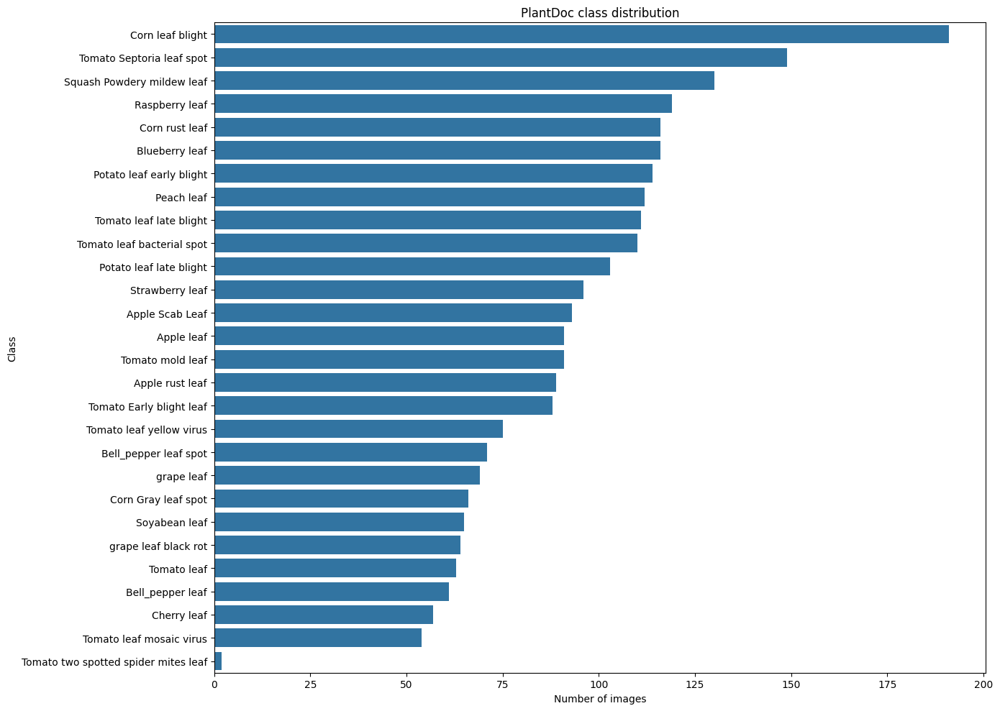

Saved figure: /content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/figures/sample_images.png


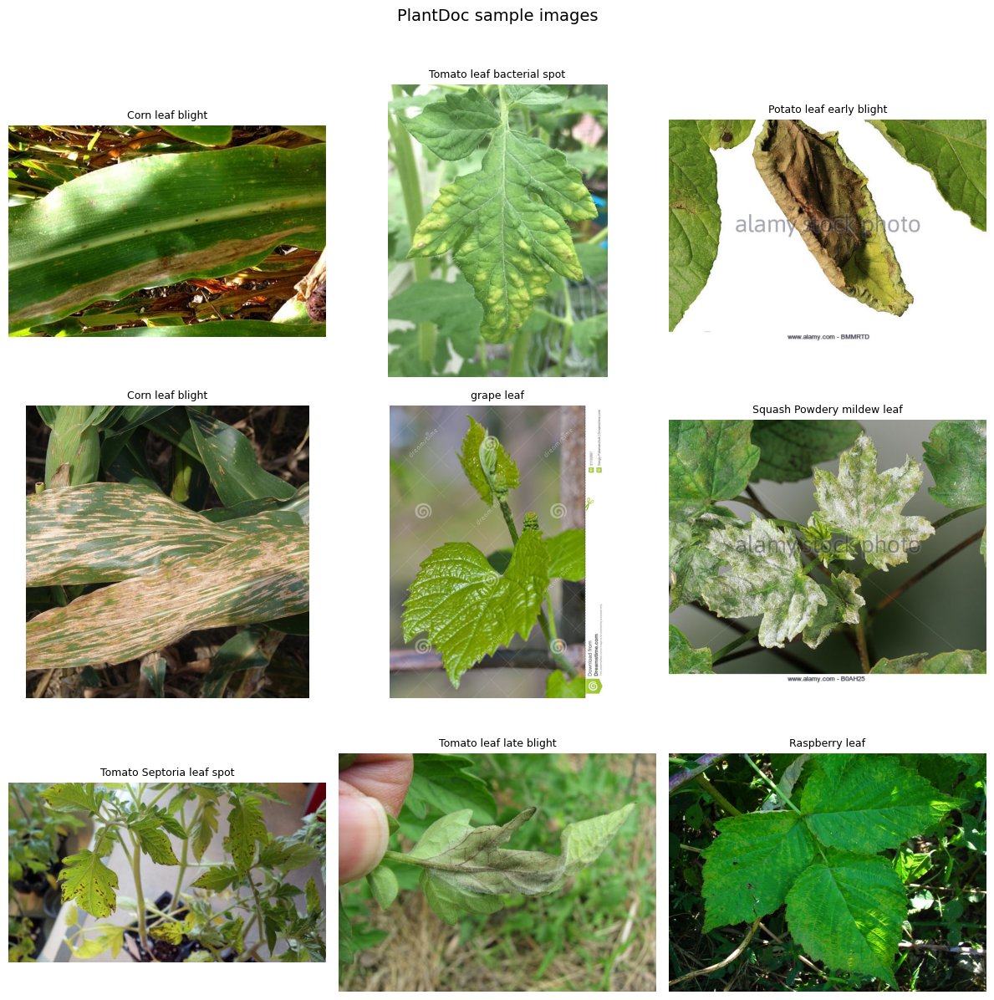

In [ ]:
plantdoc_df = build_plantdoc_dataframe(PLANTDOC_DATASET_PATH)
plantdoc_df = attach_image_fingerprints(plantdoc_df, dataset_name="PlantDoc")
plantdoc_df = deduplicate_dataframe_by_image(
    plantdoc_df,
    dataset_name="PlantDoc",
    split_priority={"test": 0, "val": 1, "train": 2}
)
print("PlantDoc images found:", len(plantdoc_df))
print("PlantDoc class count:", plantdoc_df["label_name"].nunique())
display(plantdoc_df.head())

plantdoc_class_counts = (
    plantdoc_df["label_name"]
    .value_counts()
    .rename_axis("label_name")
    .reset_index(name="image_count")
    .sort_values(["image_count", "label_name"], ascending=[False, True])
    .reset_index(drop=True)
)

display(plantdoc_class_counts)

plantdoc_class_counts = summarise_dataset_quality(plantdoc_df, dataset_name="PlantDoc")
plot_class_distribution(
    class_counts=plantdoc_class_counts,
    dataset_name="PlantDoc",
    save_path=PLANTDOC_CLASS_DISTRIBUTION_FIG_PATH
)
plantdoc_sample_df = plot_sample_images_grid(
    df=plantdoc_df,
    dataset_name="PlantDoc",
    sample_count=9,
    seed=SEED,
    save_path=PLANTDOC_SAMPLE_GRID_FIG_PATH
)


## 53. Encode the class labels, split the data, and create dataloaders

This is the same pipeline structure used for PlantVillage:
- encode class labels
- stratified train/validation/test splitting
- datasets
- dataloaders
- weighted sampling for the training loader


In [ ]:
plantdoc_class_names = sorted(plantdoc_df["label_name"].unique())
plantdoc_class_to_idx = {name: idx for idx, name in enumerate(plantdoc_class_names)}
plantdoc_idx_to_class = {idx: name for name, idx in plantdoc_class_to_idx.items()}
plantdoc_df = plantdoc_df.copy()
plantdoc_df["label_idx"] = plantdoc_df["label_name"].map(plantdoc_class_to_idx)


if SAVE_TABLES:
    with open(PLANTDOC_CLASS_INDEX_PATH, "w", encoding="utf-8") as f:
        json.dump(
            {
                "dataset": "PlantDoc",
                "class_names": plantdoc_class_names,
                "class_to_idx": plantdoc_class_to_idx,
                "idx_to_class": {str(k): v for k, v in plantdoc_idx_to_class.items()},
            },
            f,
            indent=2
        )
    print("Saved PlantDoc class index:", PLANTDOC_CLASS_INDEX_PATH)


if "source_split" in plantdoc_df.columns and plantdoc_df["source_split"].notna().any():
    plantdoc_train_df = plantdoc_df[plantdoc_df["source_split"] == "train"].copy()
    plantdoc_test_df = plantdoc_df[plantdoc_df["source_split"] == "test"].copy()
    plantdoc_val_df = plantdoc_df[plantdoc_df["source_split"] == "val"].copy()

    if plantdoc_val_df.empty:
        plantdoc_train_df, plantdoc_val_df = train_test_split(
            plantdoc_train_df,
            test_size=VAL_SIZE,
            stratify=plantdoc_train_df["label_idx"],
            random_state=SEED
        )
else:
    train_val_df_local, plantdoc_test_df = train_test_split(
        plantdoc_df,
        test_size=TEST_SIZE,
        stratify=plantdoc_df["label_idx"],
        random_state=SEED
    )
    plantdoc_train_df, plantdoc_val_df = train_test_split(
        train_val_df_local,
        test_size=VAL_SIZE / (1 - TEST_SIZE),
        stratify=train_val_df_local["label_idx"],
        random_state=SEED
    )

if RUN_FULL_NOTEBOOK_SMOKE_TEST:
    plantdoc_train_df = sample_dataframe_per_class(plantdoc_train_df, "label_idx", SMOKE_TRAIN_SAMPLES_PER_CLASS, seed=SEED)
    plantdoc_val_df = sample_dataframe_per_class(plantdoc_val_df, "label_idx", SMOKE_VAL_SAMPLES_PER_CLASS, seed=SEED)
    plantdoc_test_df = sample_dataframe_per_class(plantdoc_test_df, "label_idx", SMOKE_TEST_SAMPLES_PER_CLASS, seed=SEED)
    print("Applied full-notebook smoke-test sampling for PlantDoc.")

for split_name, split_df in [("train", plantdoc_train_df), ("val", plantdoc_val_df), ("test", plantdoc_test_df)]:
    print(split_name, len(split_df))

plantdoc_split_manifest_df = pd.concat([
    plantdoc_train_df.assign(split="train"),
    plantdoc_val_df.assign(split="val"),
    plantdoc_test_df.assign(split="test")
], ignore_index=True)

plantdoc_split_integrity_report = assert_no_split_overlap(
    train_df=plantdoc_train_df,
    val_df=plantdoc_val_df,
    test_df=plantdoc_test_df,
    dataset_name="PlantDoc"
)

if SAVE_TABLES:
    plantdoc_split_manifest_df.to_csv(PLANTDOC_SPLIT_MANIFEST_PATH, index=False)
    write_split_integrity_report(plantdoc_split_integrity_report, PLANTDOC_SPLIT_INTEGRITY_PATH)
    print("Saved PlantDoc split manifest:", PLANTDOC_SPLIT_MANIFEST_PATH)
    print("Saved PlantDoc split report:", PLANTDOC_SPLIT_INTEGRITY_PATH)

plantdoc_train_dataset = PlantVillageDataset(plantdoc_train_df, transform=train_transform)
plantdoc_val_dataset = PlantVillageDataset(plantdoc_val_df, transform=eval_transform)
plantdoc_test_dataset = PlantVillageDataset(plantdoc_test_df, transform=eval_transform)

plantdoc_class_sample_counts = plantdoc_train_df["label_idx"].value_counts().sort_index()
plantdoc_class_weight_values = 1.0 / plantdoc_class_sample_counts
plantdoc_sample_weights = plantdoc_train_df["label_idx"].map(plantdoc_class_weight_values).to_numpy(dtype=np.float32)
plantdoc_sampler = WeightedRandomSampler(
    weights=torch.DoubleTensor(plantdoc_sample_weights),
    num_samples=len(plantdoc_sample_weights),
    replacement=True
)

plantdoc_train_loader = DataLoader(
    plantdoc_train_dataset,
    batch_size=BATCH_SIZE,
    sampler=plantdoc_sampler,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)
plantdoc_val_loader = DataLoader(
    plantdoc_val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)
plantdoc_test_loader = DataLoader(
    plantdoc_test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

print("PlantDoc train batches:", len(plantdoc_train_loader))
print("PlantDoc validation batches:", len(plantdoc_val_loader))
print("PlantDoc test batches:", len(plantdoc_test_loader))

plantdoc_sample_images, plantdoc_sample_labels, plantdoc_sample_paths = next(iter(plantdoc_train_loader))
print("PlantDoc batch image shape:", tuple(plantdoc_sample_images.shape))
print("PlantDoc batch label shape:", tuple(plantdoc_sample_labels.shape))
print("PlantDoc first file path:", plantdoc_sample_paths[0])
print("PlantDoc first label index:", int(plantdoc_sample_labels[0]))
print("PlantDoc first label name:", plantdoc_idx_to_class[int(plantdoc_sample_labels[0])])

mark_stage_complete(
    state=PIPELINE_STATE,
    state_path=PIPELINE_STATE_PATH,
    dataset_name="plantdoc",
    stage_name="data_prepared",
    artifacts={
        "split_manifest": str(PLANTDOC_SPLIT_MANIFEST_PATH),
        "split_integrity": str(PLANTDOC_SPLIT_INTEGRITY_PATH),
    }
)


Saved PlantDoc class index: /content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/class_index.json
train 2097
val 233
test 236
PlantDoc: no train/val/test leakage was detected by path or SHA256 hash.
Saved PlantDoc split manifest: /content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/split_manifest.csv
Saved PlantDoc split report: /content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/split_integrity.json
PlantDoc train batches: 66
PlantDoc validation batches: 8
PlantDoc test batches: 8
PlantDoc batch image shape: (32, 3, 224, 224)
PlantDoc batch label shape: (32,)
PlantDoc first file path: /content/runtime_datasets/plantdoc/train/Tomato two spotted spider mites leaf/comparing-diseases-4-canker-tomato-1y51ejs.jpg
PlantDoc first label index: 25
PlantDoc first label name: Tomato two spotted spider mites leaf


{'artifacts': {'split_manifest': '/content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/split_manifest.csv',
  'split_integrity': '/content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/split_integrity.json'},
 'completed': True,
 'completed_at': '2026-04-07 23:25:27'}

## 54. Create the PlantDoc model, print the model summary, and train it

This is intentionally the same training process as PlantVillage.

For every epoch, the log now records:
- learning rate
- train loss, accuracy, precision, recall, and macro F1
- validation loss, accuracy, precision, recall, and macro F1
- epoch time
- best validation loss so far

The key PlantDoc-specific settings are:
- **dropout = 0.1**
- **epochs = 20**


In [ ]:

plantdoc_model = build_model(len(plantdoc_class_names), dropout_rate=PLANTDOC_DROPOUT).to(device)
print("PlantDoc dropout:", PLANTDOC_DROPOUT)
plantdoc_model_summary_df = display_model_summary(
    model=plantdoc_model,
    dataset_name="PlantDoc",
    n_classes=len(plantdoc_class_names),
    dropout_rate=PLANTDOC_DROPOUT,
    image_size=IMAGE_SIZE,
    device=device
)
plantdoc_class_weights_tensor = torch.tensor(
    [1.0 / plantdoc_class_sample_counts.get(idx, 1.0) for idx in range(len(plantdoc_class_names))],
    dtype=torch.float32,
    device=device
)
plantdoc_criterion = nn.CrossEntropyLoss(weight=plantdoc_class_weights_tensor, label_smoothing=LABEL_SMOOTHING)
plantdoc_optimizer = optim.Adam(plantdoc_model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
plantdoc_scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    plantdoc_optimizer,
    mode="min",
    factor=0.5,
    patience=2
)

plantdoc_history = build_history_template()
plantdoc_best_val_loss = float("inf")
plantdoc_best_epoch = None
plantdoc_epochs_without_improvement = 0
plantdoc_start_epoch = 1

if PLANTDOC_RESUME_STATE_PATH.exists():
    print("Found PlantDoc resume checkpoint. Loading state...")
    resume_state = torch.load(PLANTDOC_RESUME_STATE_PATH, map_location=device)
    plantdoc_model.load_state_dict(resume_state["model_state_dict"])
    plantdoc_optimizer.load_state_dict(resume_state["optimizer_state_dict"])
    plantdoc_scheduler.load_state_dict(resume_state["scheduler_state_dict"])
    plantdoc_history = resume_state["history"]
    plantdoc_best_val_loss = resume_state["best_val_loss"]
    plantdoc_best_epoch = resume_state["best_epoch"]
    plantdoc_epochs_without_improvement = resume_state["epochs_without_improvement"]
    plantdoc_start_epoch = int(resume_state["last_completed_epoch"]) + 1
    print(f"Resuming PlantDoc training from epoch {plantdoc_start_epoch}.")
elif PLANTDOC_BEST_MODEL_PATH.exists() and PLANTDOC_HISTORY_PATH.exists():
    print("Best PlantDoc model and history already exist. Skipping training loop.")
    plantdoc_model.load_state_dict(torch.load(PLANTDOC_BEST_MODEL_PATH, map_location=device))
    history_df_existing = pd.read_csv(PLANTDOC_HISTORY_PATH)
    plantdoc_history = history_df_existing.to_dict(orient="list")
    if len(history_df_existing) > 0:
        best_row = history_df_existing.sort_values("val_loss", ascending=True).iloc[0]
        plantdoc_best_epoch = int(best_row["epoch"])
        plantdoc_best_val_loss = float(best_row["val_loss"])
else:
    print("Starting PlantDoc training loop...")

if plantdoc_start_epoch <= PLANTDOC_EPOCHS and not (PLANTDOC_BEST_MODEL_PATH.exists() and PLANTDOC_HISTORY_PATH.exists()):
    for epoch in range(plantdoc_start_epoch, PLANTDOC_EPOCHS + 1):
        epoch_start = time.time()
        current_lr = plantdoc_optimizer.param_groups[0]["lr"]

        print(f"PlantDoc Epoch {epoch}/{PLANTDOC_EPOCHS} | lr={current_lr:.6f}")

        plantdoc_train_metrics = run_one_epoch(
            model=plantdoc_model,
            loader=plantdoc_train_loader,
            criterion=plantdoc_criterion,
            optimizer=plantdoc_optimizer,
            device=device
        )

        plantdoc_val_metrics = run_one_epoch(
            model=plantdoc_model,
            loader=plantdoc_val_loader,
            criterion=plantdoc_criterion,
            optimizer=None,
            device=device
        )

        plantdoc_scheduler.step(plantdoc_val_metrics["loss"])
        epoch_seconds = time.time() - epoch_start

        append_epoch_history(
            history_dict=plantdoc_history,
            epoch=epoch,
            train_metrics=plantdoc_train_metrics,
            val_metrics=plantdoc_val_metrics,
            learning_rate=current_lr,
            epoch_seconds=epoch_seconds
        )

        if plantdoc_val_metrics["loss"] < plantdoc_best_val_loss:
            plantdoc_best_val_loss = plantdoc_val_metrics["loss"]
            plantdoc_best_epoch = epoch
            plantdoc_epochs_without_improvement = 0
            torch.save(plantdoc_model.state_dict(), PLANTDOC_BEST_MODEL_PATH)
            print(f"Best PlantDoc model saved to: {PLANTDOC_BEST_MODEL_PATH}")
        else:
            plantdoc_epochs_without_improvement += 1
            print(f"No improvement count: {plantdoc_epochs_without_improvement}/{EARLY_STOPPING_PATIENCE}")

        torch.save({
            "model_state_dict": plantdoc_model.state_dict(),
            "optimizer_state_dict": plantdoc_optimizer.state_dict(),
            "scheduler_state_dict": plantdoc_scheduler.state_dict(),
            "history": plantdoc_history,
            "best_val_loss": plantdoc_best_val_loss,
            "best_epoch": plantdoc_best_epoch,
            "epochs_without_improvement": plantdoc_epochs_without_improvement,
            "last_completed_epoch": epoch,
        }, PLANTDOC_RESUME_STATE_PATH)

        print_epoch_log(
            dataset_name="PlantDoc",
            epoch=epoch,
            total_epochs=PLANTDOC_EPOCHS,
            learning_rate=current_lr,
            train_metrics=plantdoc_train_metrics,
            val_metrics=plantdoc_val_metrics,
            epoch_seconds=epoch_seconds,
            best_val_loss=plantdoc_best_val_loss,
            best_epoch=plantdoc_best_epoch
        )

        if plantdoc_epochs_without_improvement >= EARLY_STOPPING_PATIENCE:
            print("PlantDoc early stopping triggered.")
            break

        print("-" * 80)


Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 110MB/s] 


PlantDoc dropout: 0.1


,dataset,model,backbone,n_classes,dropout,input_size,device,total_params,trainable_params
0,PlantDoc,EfficientNet,EfficientNet-B0,28,0.1,3x224x224,cuda,4043416,4043416


Found PlantDoc resume checkpoint. Loading state...
Resuming PlantDoc training from epoch 21.


## 55. Review the PlantDoc training history

This table is the per-epoch record for the PlantDoc run.
It includes all tracked metrics so you can inspect the full training behaviour instead of only the final numbers.


In [ ]:
plantdoc_history_df = pd.DataFrame(plantdoc_history)
display(plantdoc_history_df.tail())

if SAVE_TABLES and not plantdoc_history_df.empty:
    plantdoc_history_df.to_csv(PLANTDOC_HISTORY_PATH, index=False)
    print("Saved PlantDoc training history to:", PLANTDOC_HISTORY_PATH)

mark_stage_complete(
    state=PIPELINE_STATE,
    state_path=PIPELINE_STATE_PATH,
    dataset_name="plantdoc",
    stage_name="training_complete",
    artifacts={
        "history": str(PLANTDOC_HISTORY_PATH),
        "best_model": str(PLANTDOC_BEST_MODEL_PATH),
        "resume_state": str(PLANTDOC_RESUME_STATE_PATH),
    }
)


,epoch,train_loss,train_acc,train_precision,train_recall,train_f1,val_loss,val_acc,val_precision,val_recall,val_f1,learning_rate,epoch_seconds
15,16,0.135690,0.917024,0.916162,0.914056,0.913137,1.138335,0.673820,0.687675,0.685080,0.668084,0.000100,81.156814
16,17,0.118934,0.922747,0.924085,0.925229,0.923287,1.147222,0.635193,0.644923,0.654066,0.629178,0.000050,79.184660
17,18,0.122876,0.939914,0.938476,0.938611,0.937493,1.169495,0.648069,0.667474,0.674614,0.646060,0.000050,82.375793
18,19,0.127082,0.927039,0.927424,0.929620,0.927905,1.166869,0.673820,0.684545,0.684790,0.666144,0.000050,78.059664
19,20,0.117282,0.939914,0.939916,0.939166,0.938683,1.149179,0.682403,0.695910,0.703204,0.676830,0.000025,83.317436


Saved PlantDoc training history to: /content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/training_history.csv


{'artifacts': {'history': '/content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/training_history.csv',
  'best_model': '/content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/models/best_efficientnet_b0_plantdoc.pt',
  'resume_state': '/content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/models/plantdoc_resume_state.pt'},
 'completed': True,
 'completed_at': '2026-04-07 23:25:31'}

## 56. Plot the PlantDoc learning curves

These plots visualise the PlantDoc training history so it can be compared directly with the earlier PlantVillage run.


Saved figure: /content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/figures/learning_curves.png


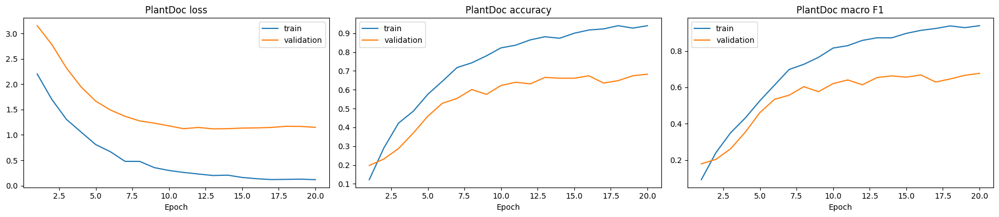

In [ ]:
plot_training_history(
    history_df=plantdoc_history_df,
    dataset_name="PlantDoc",
    save_path=PLANTDOC_LEARNING_CURVES_FIG_PATH
)


## 57. Reload the best PlantDoc checkpoint and run predictions

This matches the PlantVillage evaluation flow:
we reload the saved best model first, then run test-set inference from that checkpoint.


In [ ]:
if not PLANTDOC_BEST_MODEL_PATH.exists():
    raise FileNotFoundError("No best PlantDoc model checkpoint was found.")

plantdoc_best_model = build_model(len(plantdoc_class_names), dropout_rate=PLANTDOC_DROPOUT).to(device)
plantdoc_best_model.load_state_dict(torch.load(PLANTDOC_BEST_MODEL_PATH, map_location=device))
plantdoc_best_model.eval()

plantdoc_pred_output = predict_with_probs(plantdoc_best_model, plantdoc_test_loader, device=device)
plantdoc_all_test_probs = plantdoc_pred_output["probs"]
plantdoc_all_test_preds = plantdoc_pred_output["preds"]
plantdoc_all_test_labels = plantdoc_pred_output["labels"]
plantdoc_all_test_paths = plantdoc_pred_output["paths"]

print("PlantDoc test predictions complete.")
print("Number of PlantDoc test examples:", len(plantdoc_all_test_labels))


predict:   0%|          | 0/8 [00:00<?, ?it/s]

PlantDoc test predictions complete.
Number of PlantDoc test examples: 236


## 58. Classification metrics and mandatory summary table

This summary table is mandatory and contains the core PlantDoc metrics plus run metadata such as class count, split sizes, parameter counts, dropout, and epoch information.


In [ ]:
plantdoc_test_accuracy = accuracy_score(plantdoc_all_test_labels, plantdoc_all_test_preds)
plantdoc_test_precision = precision_score(plantdoc_all_test_labels, plantdoc_all_test_preds, average="macro", zero_division=0)
plantdoc_test_recall = recall_score(plantdoc_all_test_labels, plantdoc_all_test_preds, average="macro", zero_division=0)
plantdoc_test_f1 = f1_score(plantdoc_all_test_labels, plantdoc_all_test_preds, average="macro", zero_division=0)

# PlantDoc-only AUROC fix:
# The PlantDoc test split can miss some classes even though the model still outputs
# probabilities for every training class. Align the OvR AUROC calculation to the
# classes that are actually present in the PlantDoc test labels so the metric does
# not fail with:
# "Number of classes in y_true not equal to the number of columns in 'y_score'".
plantdoc_num_classes = len(plantdoc_class_names)
plantdoc_present_labels = np.unique(np.asarray(plantdoc_all_test_labels, dtype=int))
plantdoc_present_mask = np.isin(np.arange(plantdoc_num_classes), plantdoc_present_labels)

try:
    if len(plantdoc_present_labels) < 2:
        plantdoc_test_auroc = np.nan
        print(
            "PlantDoc AUROC could not be computed: fewer than two classes are present "
            "in the PlantDoc test labels."
        )
    else:
        plantdoc_y_true_ovr = np.eye(plantdoc_num_classes, dtype=int)[
            np.asarray(plantdoc_all_test_labels, dtype=int)
        ]
        plantdoc_y_true_ovr = plantdoc_y_true_ovr[:, plantdoc_present_mask]
        plantdoc_y_score_ovr = np.asarray(plantdoc_all_test_probs)[:, plantdoc_present_mask]

        plantdoc_test_auroc = roc_auc_score(
            plantdoc_y_true_ovr,
            plantdoc_y_score_ovr,
            average="macro"
        )

        missing_plantdoc_classes = plantdoc_num_classes - len(plantdoc_present_labels)
        if missing_plantdoc_classes > 0:
            print(
                "PlantDoc AUROC computed on "
                f"{len(plantdoc_present_labels)}/{plantdoc_num_classes} "
                "classes present in the PlantDoc test split."
            )
except Exception as e:
    plantdoc_test_auroc = np.nan
    print("PlantDoc AUROC could not be computed:", e)

plantdoc_classification_summary = pd.DataFrame([{
    "dataset": "PlantDoc",
    "model": "EfficientNet-B0",
    "dropout": PLANTDOC_DROPOUT,
    "epochs_requested": PLANTDOC_EPOCHS,
    "epochs_completed": int(len(plantdoc_history["epoch"])),
    "best_epoch": plantdoc_best_epoch,
    "n_classes": len(plantdoc_class_names),
    "train_size": len(plantdoc_train_df),
    "val_size": len(plantdoc_val_df),
    "test_size": len(plantdoc_test_df),
    "accuracy": plantdoc_test_accuracy,
    "macro_precision": plantdoc_test_precision,
    "macro_recall": plantdoc_test_recall,
    "macro_f1": plantdoc_test_f1,
    "macro_auroc_ovr": plantdoc_test_auroc,
    "total_params": int(plantdoc_model_summary_df.loc[0, "total_params"]),
    "trainable_params": int(plantdoc_model_summary_df.loc[0, "trainable_params"])
}])

display(plantdoc_classification_summary)


PlantDoc AUROC computed on 27/28 classes present in the PlantDoc test split.


,dataset,model,dropout,epochs_requested,epochs_completed,best_epoch,n_classes,train_size,val_size,test_size,accuracy,macro_precision,macro_recall,macro_f1,macro_auroc_ovr,total_params,trainable_params
0,PlantDoc,EfficientNet-B0,0.1,20,20,13,28,2097,233,236,0.648305,0.638744,0.627555,0.610268,0.979853,4043416,4043416


## 59. Classification report

This gives the PlantDoc class-by-class precision, recall, F1, and support so weak classes are visible directly.


In [ ]:
plantdoc_report_dict = classification_report(
    plantdoc_all_test_labels,
    plantdoc_all_test_preds,
    target_names=plantdoc_class_names,
    output_dict=True,
    zero_division=0
)

plantdoc_report_df = pd.DataFrame(plantdoc_report_dict).transpose()
display(plantdoc_report_df.head(15))

,precision,recall,f1-score,support
Apple Scab Leaf,0.750000,0.600000,0.666667,10.0
Apple leaf,0.533333,0.888889,0.666667,9.0
Apple rust leaf,0.727273,0.800000,0.761905,10.0
Bell_pepper leaf,0.714286,0.625000,0.666667,8.0
Bell_pepper leaf spot,0.642857,1.000000,0.782609,9.0
Blueberry leaf,0.750000,0.545455,0.631579,11.0
Cherry leaf,0.600000,0.600000,0.600000,10.0
Corn Gray leaf spot,0.333333,0.750000,0.461538,4.0
Corn leaf blight,0.800000,0.333333,0.470588,12.0
Corn rust leaf,0.750000,0.900000,0.818182,10.0


## 60. Confusion matrix

The PlantDoc confusion matrix is now annotated with the **exact count in every square** so the error pattern can be read numerically, not only visually.


Saved figure: /content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/figures/confusion_matrix.png


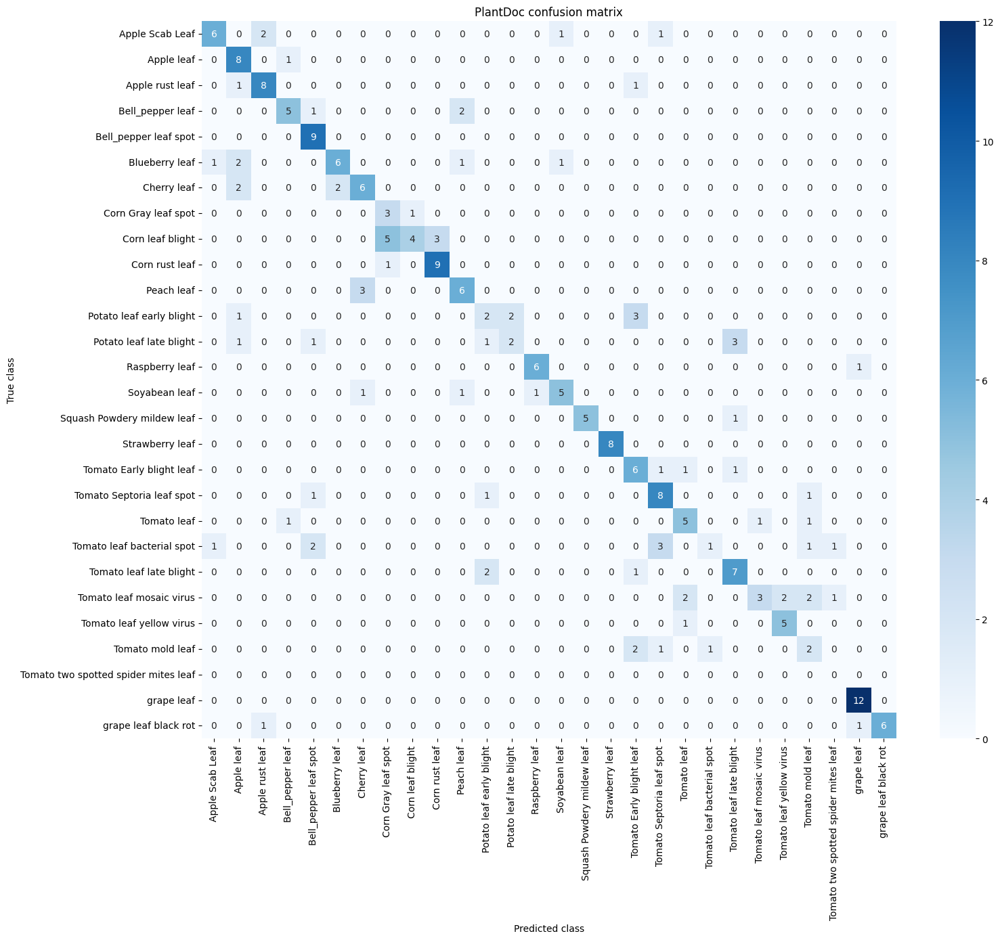

In [ ]:
plantdoc_cm = confusion_matrix(plantdoc_all_test_labels, plantdoc_all_test_preds)
plot_confusion_matrix_heatmap(
    cm=plantdoc_cm,
    class_names=plantdoc_class_names,
    dataset_name="PlantDoc",
    save_path=PLANTDOC_CONFUSION_MATRIX_FIG_PATH
)


## 61. Build the main PlantDoc test results table

This keeps the same detailed per-image result structure used in PlantVillage:
- true label
- predicted label
- confidence
- correctness flag
- full probability vector


In [ ]:
plantdoc_results_df = plantdoc_test_df.reset_index(drop=True).copy()
plantdoc_results_df["true_label_idx"] = plantdoc_all_test_labels
plantdoc_results_df["pred_label_idx"] = plantdoc_all_test_preds
plantdoc_results_df["true_label_name"] = plantdoc_results_df["true_label_idx"].map(plantdoc_idx_to_class)
plantdoc_results_df["pred_label_name"] = plantdoc_results_df["pred_label_idx"].map(plantdoc_idx_to_class)
plantdoc_results_df["pred_confidence"] = plantdoc_all_test_probs.max(axis=1)
plantdoc_results_df["correct"] = plantdoc_results_df["true_label_idx"] == plantdoc_results_df["pred_label_idx"]
plantdoc_results_df["probabilities_json"] = [json.dumps(x.tolist()) for x in plantdoc_all_test_probs]
plantdoc_results_df = ensure_results_export_schema(plantdoc_results_df, dataset_name="PlantDoc", split_name="test")

print("PlantDoc correct predictions:", int(plantdoc_results_df["correct"].sum()))
print("PlantDoc incorrect predictions:", int((~plantdoc_results_df["correct"]).sum()))
display(plantdoc_results_df.head())

plantdoc_review_tables = build_prediction_review_tables(plantdoc_results_df)
plantdoc_most_confident_correct = plantdoc_review_tables["most_confident_correct"]
plantdoc_most_confident_wrong = plantdoc_review_tables["most_confident_wrong"]
plantdoc_least_confident_correct = plantdoc_review_tables["least_confident_correct"]

print("PlantDoc most confident correct predictions")
display(plantdoc_most_confident_correct[[
    "filepath", "true_label_name", "pred_label_name", "pred_confidence"
]])

print("PlantDoc most confident incorrect predictions")
display(plantdoc_most_confident_wrong[[
    "filepath", "true_label_name", "pred_label_name", "pred_confidence"
]])

print("PlantDoc least confident correct predictions")
display(plantdoc_least_confident_correct[[
    "filepath", "true_label_name", "pred_label_name", "pred_confidence"
]])

if SAVE_TABLES:
    plantdoc_results_df.to_csv(PLANTDOC_RESULTS_PATH, index=False)
    plantdoc_classification_summary.to_csv(PLANTDOC_CLASSIFICATION_SUMMARY_PATH, index=False)
    plantdoc_report_df.to_csv(PLANTDOC_REPORT_PATH)
    plantdoc_most_confident_correct.to_csv(PLANTDOC_QUAL_SAMPLE_PATH, index=False)
    plantdoc_most_confident_wrong.to_csv(PLANTDOC_FAILURE_SAMPLE_PATH, index=False)
    print("Saved PlantDoc results:", PLANTDOC_RESULTS_PATH)

mark_stage_complete(
    state=PIPELINE_STATE,
    state_path=PIPELINE_STATE_PATH,
    dataset_name="plantdoc",
    stage_name="evaluation_complete",
    artifacts={
        "results": str(PLANTDOC_RESULTS_PATH),
        "classification_summary": str(PLANTDOC_CLASSIFICATION_SUMMARY_PATH),
        "classification_report": str(PLANTDOC_REPORT_PATH),
    }
)


PlantDoc correct predictions: 153
PlantDoc incorrect predictions: 83


,filepath,label_name,source_split,path_key,image_sha256,label_idx,true_label_idx,pred_label_idx,true_label_name,pred_label_name,pred_confidence,correct,probabilities_json,dataset,split,sample_id,filepath_rel,image_stem,figure_group
0,/content/runtime_datasets/plantdoc/test/Apple ...,Apple Scab Leaf,test,/content/runtime_datasets/plantdoc/test/Apple ...,13cfeac779b23fa433e92498086f19b1768b84cab23bc9...,0,0,0,Apple Scab Leaf,Apple Scab Leaf,0.850609,True,"[0.8506088256835938, 0.0038692213129252195, 0....",PlantDoc,test,PlantDoc__cdb750f5b2934d5e,/content/runtime_datasets/plantdoc/test/Apple ...,052609%20Hartman%20Crabapple%20scab%20single%2...,correct
1,/content/runtime_datasets/plantdoc/test/Apple ...,Apple Scab Leaf,test,/content/runtime_datasets/plantdoc/test/Apple ...,7af1a2678a7114632f0274947888e29794321fc9e5edc2...,0,0,18,Apple Scab Leaf,Tomato Septoria leaf spot,0.299605,False,"[0.21301217377185822, 0.0007355030975304544, 0...",PlantDoc,test,PlantDoc__47a52d32b457ee14,/content/runtime_datasets/plantdoc/test/Apple ...,1b321015-6e33-4f18-aade-888f4383fe92.jpeg,incorrect
2,/content/runtime_datasets/plantdoc/test/Apple ...,Apple Scab Leaf,test,/content/runtime_datasets/plantdoc/test/Apple ...,5fb95aeef21638c09143a6f15c39c65eb7be22e7c75273...,0,0,0,Apple Scab Leaf,Apple Scab Leaf,0.668241,True,"[0.6682409644126892, 0.001625723671168089, 0.0...",PlantDoc,test,PlantDoc__bdef303d7449fdf1,/content/runtime_datasets/plantdoc/test/Apple ...,28-500x375,correct
3,/content/runtime_datasets/plantdoc/test/Apple ...,Apple Scab Leaf,test,/content/runtime_datasets/plantdoc/test/Apple ...,ffc0df6903deff23117a8517a8365d729b073b272d3e6d...,0,0,2,Apple Scab Leaf,Apple rust leaf,0.435461,False,"[0.18903976678848267, 0.008043748326599598, 0....",PlantDoc,test,PlantDoc__c0c091b067479aa2,/content/runtime_datasets/plantdoc/test/Apple ...,816,incorrect
4,/content/runtime_datasets/plantdoc/test/Apple ...,Apple Scab Leaf,test,/content/runtime_datasets/plantdoc/test/Apple ...,9fc6c998582e99696112bc79e2ce2f20f023641323d264...,0,0,2,Apple Scab Leaf,Apple rust leaf,0.336435,False,"[0.28228288888931274, 0.00023262438480742276, ...",PlantDoc,test,PlantDoc__51b03105a076616d,/content/runtime_datasets/plantdoc/test/Apple ...,apple%20scab%20leaf,incorrect


PlantDoc most confident correct predictions


,filepath,true_label_name,pred_label_name,pred_confidence
0,/content/runtime_datasets/plantdoc/test/Corn r...,Corn rust leaf,Corn rust leaf,0.994994
1,/content/runtime_datasets/plantdoc/test/grape ...,grape leaf,grape leaf,0.994276
2,/content/runtime_datasets/plantdoc/test/Apple ...,Apple leaf,Apple leaf,0.992349
3,/content/runtime_datasets/plantdoc/test/Soyabe...,Soyabean leaf,Soyabean leaf,0.991620
4,/content/runtime_datasets/plantdoc/test/grape ...,grape leaf,grape leaf,0.991266
5,/content/runtime_datasets/plantdoc/test/Strawb...,Strawberry leaf,Strawberry leaf,0.991254
6,/content/runtime_datasets/plantdoc/test/Strawb...,Strawberry leaf,Strawberry leaf,0.990703
7,/content/runtime_datasets/plantdoc/test/grape ...,grape leaf,grape leaf,0.990275
8,/content/runtime_datasets/plantdoc/test/Apple ...,Apple Scab Leaf,Apple Scab Leaf,0.990100
9,/content/runtime_datasets/plantdoc/test/Apple ...,Apple leaf,Apple leaf,0.989811


PlantDoc most confident incorrect predictions


,filepath,true_label_name,pred_label_name,pred_confidence
0,/content/runtime_datasets/plantdoc/test/Corn l...,Corn leaf blight,Corn Gray leaf spot,0.980351
1,/content/runtime_datasets/plantdoc/test/Corn l...,Corn leaf blight,Corn Gray leaf spot,0.939536
2,/content/runtime_datasets/plantdoc/test/Corn l...,Corn leaf blight,Corn Gray leaf spot,0.936029
3,/content/runtime_datasets/plantdoc/test/Potato...,Potato leaf early blight,Tomato Early blight leaf,0.929572
4,/content/runtime_datasets/plantdoc/test/Tomato...,Tomato leaf bacterial spot,Bell_pepper leaf spot,0.928831
5,/content/runtime_datasets/plantdoc/test/Corn l...,Corn leaf blight,Corn Gray leaf spot,0.925923
6,/content/runtime_datasets/plantdoc/test/Corn r...,Corn rust leaf,Corn Gray leaf spot,0.909785
7,/content/runtime_datasets/plantdoc/test/Cherry...,Cherry leaf,Apple leaf,0.901646
8,/content/runtime_datasets/plantdoc/test/Peach ...,Peach leaf,Cherry leaf,0.873599
9,/content/runtime_datasets/plantdoc/test/Bluebe...,Blueberry leaf,Apple leaf,0.861619


PlantDoc least confident correct predictions


,filepath,true_label_name,pred_label_name,pred_confidence
0,/content/runtime_datasets/plantdoc/test/Apple ...,Apple Scab Leaf,Apple Scab Leaf,0.207301
1,/content/runtime_datasets/plantdoc/test/Tomato...,Tomato leaf,Tomato leaf,0.237346
2,/content/runtime_datasets/plantdoc/test/Tomato...,Tomato leaf,Tomato leaf,0.257525
3,/content/runtime_datasets/plantdoc/test/Bell_p...,Bell_pepper leaf spot,Bell_pepper leaf spot,0.279374
4,/content/runtime_datasets/plantdoc/test/Bell_p...,Bell_pepper leaf,Bell_pepper leaf,0.285705
5,/content/runtime_datasets/plantdoc/test/Tomato...,Tomato leaf late blight,Tomato leaf late blight,0.326083
6,/content/runtime_datasets/plantdoc/test/Tomato...,Tomato leaf bacterial spot,Tomato leaf bacterial spot,0.356050
7,/content/runtime_datasets/plantdoc/test/Tomato...,Tomato leaf yellow virus,Tomato leaf yellow virus,0.378529
8,/content/runtime_datasets/plantdoc/test/Tomato...,Tomato leaf late blight,Tomato leaf late blight,0.385214
9,/content/runtime_datasets/plantdoc/test/Cherry...,Cherry leaf,Cherry leaf,0.387720


Saved PlantDoc results: /content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/test_results.csv


{'artifacts': {'results': '/content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/test_results.csv',
  'classification_summary': '/content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/classification_summary.csv',
  'classification_report': '/content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/classification_report.csv'},
 'completed': True,
 'completed_at': '2026-04-07 23:25:47'}

## 62. PlantDoc XAI workflow and method explanations

This section mirrors the PlantVillage XAI process on PlantDoc.

### Grad-CAM
Grad-CAM uses the gradients of the chosen class to weight the last convolutional feature maps.
The weighted maps are combined into a heatmap showing which image regions most supported the prediction.

### Grad-CAM++
Grad-CAM++ extends Grad-CAM with a more detailed gradient weighting rule.
It can work better when the disease evidence is spread across several smaller regions.

### LayerCAM
LayerCAM uses positive gradients together with activation maps at one or more layers.
Because it keeps more local spatial detail, it can highlight finer structures than a single last-layer CAM.

### Insertion and deletion
These are the quantitative XAI checks used in the notebook.
Insertion asks whether confidence rises quickly when the most important pixels are added first.
Deletion asks whether confidence falls quickly when the most important pixels are removed first.

### Border-focus ratio
This is a practical warning signal for suspicious explanations.
If too much highlighted area sits near the image border, the model may be using background or framing cues instead of the diseased leaf region.

The code cell below then repeats the same XAI pipeline used for PlantVillage:
- representative correct-sample selection
- inline example visualisation
- method comparison
- quantitative benchmarking
- suspicious-case review
- failure-case review
- timing summary
- saved tables


PlantDoc XAI uses the same three methods as PlantVillage: GradCAM, GradCAMpp, and LayerCAM.
Higher insertion AUC is better. Lower deletion AUC is better.


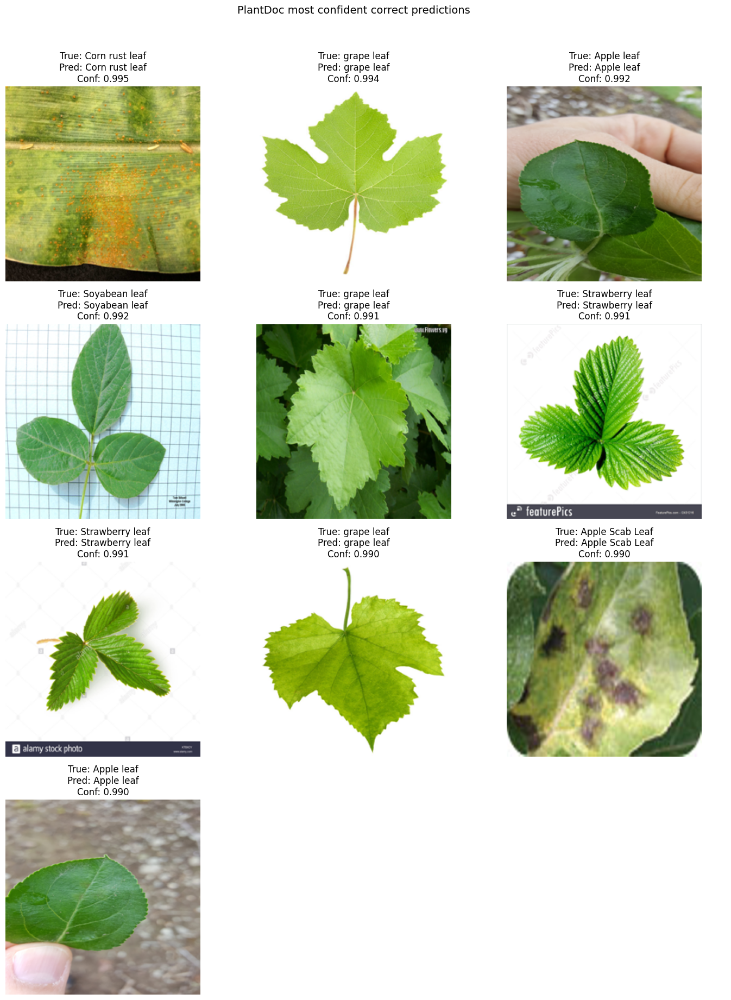

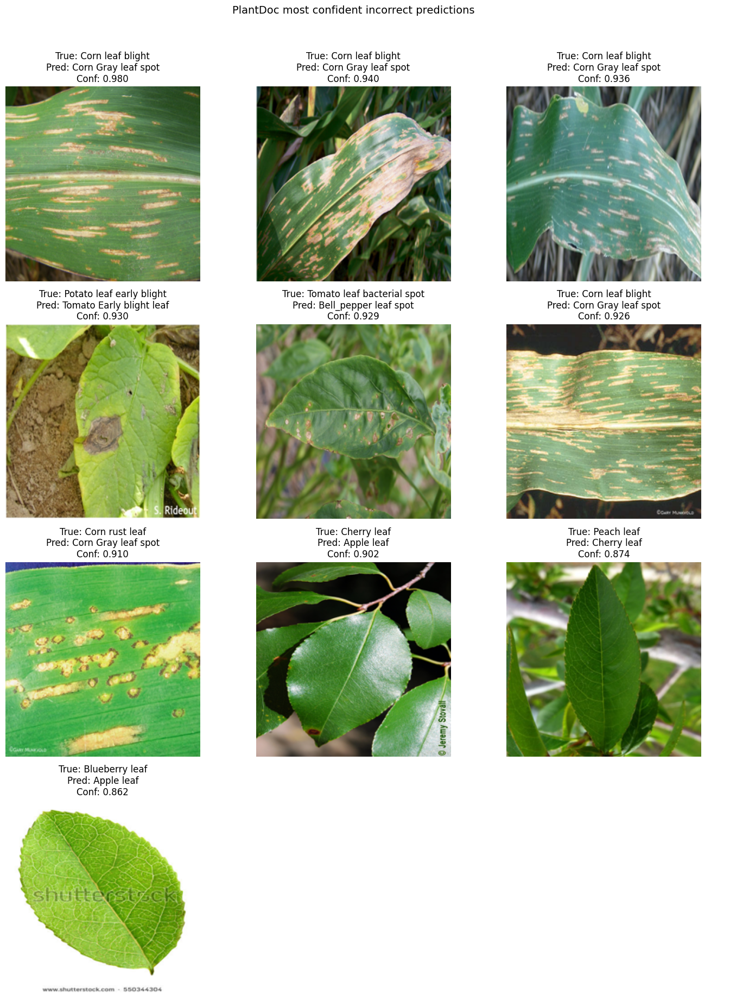

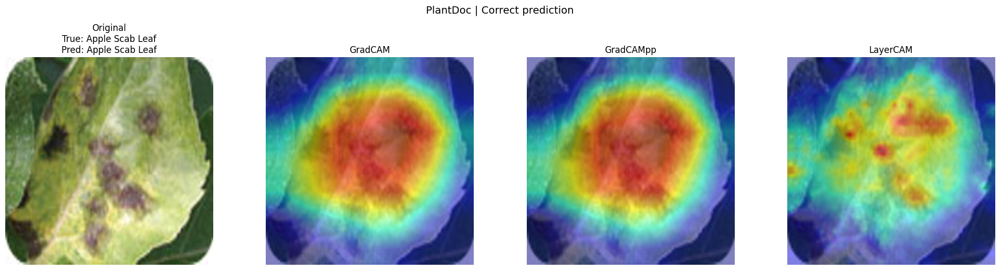

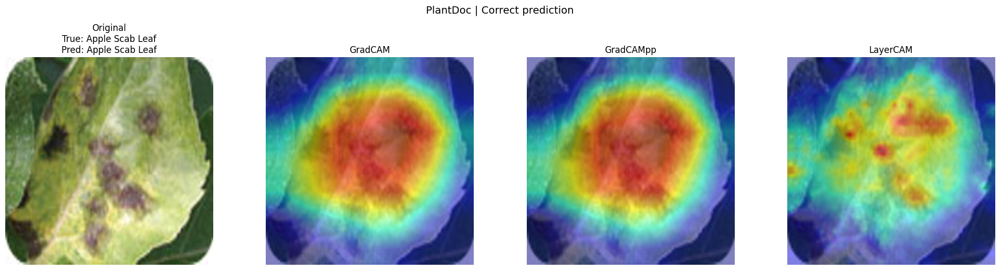

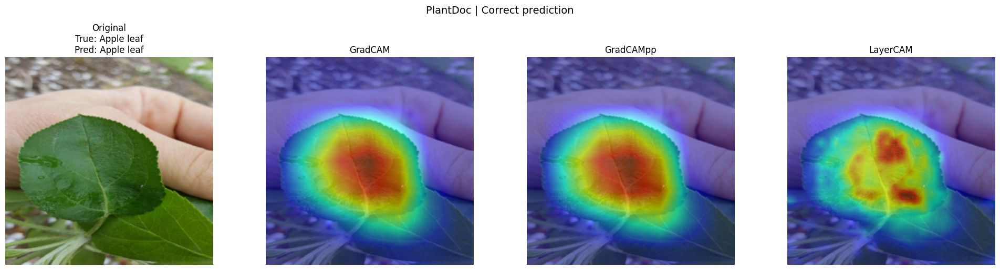

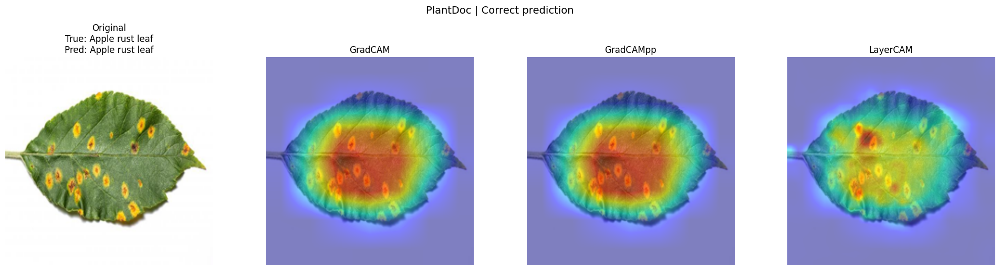

Correctly classified PlantDoc test images available: 153
Representative PlantDoc XAI benchmark sample size: 153
Configured qualitative review size (50+ target): 50
PlantDoc XAI results already exist. Loading them instead of recomputing.
Saved figure: /content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/figures/xai_benchmark_summary.png


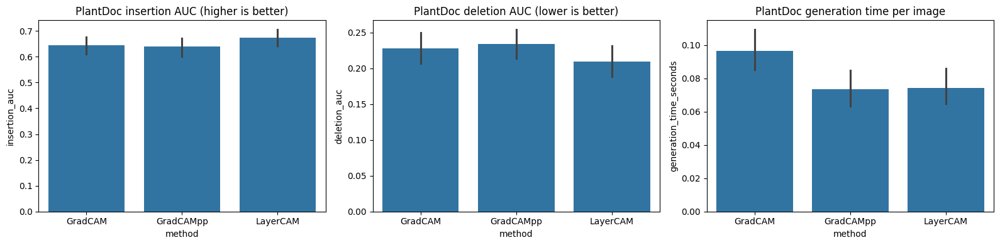

,method,n_images,n_records,mean_time_seconds,std_time_seconds,median_time_seconds,mean_insertion_auc,std_insertion_auc,median_insertion_auc,mean_deletion_auc,std_deletion_auc,median_deletion_auc,mean_border_focus_ratio,std_border_focus_ratio,median_border_focus_ratio
0,GradCAM,153,153,0.096495,0.077132,0.077981,0.645856,0.214084,0.693504,0.227573,0.134610,0.216379,0.047004,0.065838,0.023849
1,GradCAMpp,153,153,0.073695,0.068790,0.055183,0.638609,0.218361,0.693297,0.233926,0.134901,0.218142,0.040171,0.058832,0.022188
2,LayerCAM,153,153,0.074464,0.066226,0.055607,0.672728,0.204434,0.709923,0.209146,0.135007,0.190118,0.055470,0.064249,0.036205


,method,n_images,n_records,mean_time_seconds,std_time_seconds,median_time_seconds,mean_insertion_auc,std_insertion_auc,median_insertion_auc,mean_deletion_auc,std_deletion_auc,median_deletion_auc,mean_border_focus_ratio,std_border_focus_ratio,median_border_focus_ratio,mean_insertion_auc_rank,mean_deletion_auc_rank,mean_time_seconds_rank,mean_border_focus_ratio_rank,overall_rank_score
0,LayerCAM,153,153,0.074464,0.066226,0.055607,0.672728,0.204434,0.709923,0.209146,0.135007,0.190118,0.055470,0.064249,0.036205,1.0,1.0,2.0,3.0,1.75
1,GradCAMpp,153,153,0.073695,0.068790,0.055183,0.638609,0.218361,0.693297,0.233926,0.134901,0.218142,0.040171,0.058832,0.022188,3.0,3.0,1.0,1.0,2.00
2,GradCAM,153,153,0.096495,0.077132,0.077981,0.645856,0.214084,0.693504,0.227573,0.134610,0.216379,0.047004,0.065838,0.023849,2.0,2.0,3.0,2.0,2.25


,dataset,metric,better_direction,method_a,method_b,n_pairs,mean_method_a,mean_method_b,mean_diff_a_minus_b,median_diff_a_minus_b,winner_by_mean,wilcoxon_statistic,wilcoxon_pvalue,paired_t_statistic,paired_t_pvalue,paired_effect_size_d
0,PlantDoc,insertion_auc,higher,GradCAM,GradCAMpp,153,0.645856,0.638609,0.007247,0.001842,GradCAM,3996.0,5.588424e-04,3.986326,1.038922e-04,0.322275
1,PlantDoc,insertion_auc,higher,GradCAM,LayerCAM,153,0.645856,0.672728,-0.026872,-0.019702,LayerCAM,2553.0,1.207288e-09,-6.313877,2.842950e-09,-0.510447
2,PlantDoc,insertion_auc,higher,GradCAMpp,LayerCAM,153,0.638609,0.672728,-0.034119,-0.023890,LayerCAM,1838.0,1.563411e-13,-7.878652,5.886589e-13,-0.636951
3,PlantDoc,deletion_auc,lower,GradCAM,GradCAMpp,153,0.227573,0.233926,-0.006353,-0.002132,GradCAM,3341.0,3.418486e-06,-4.858303,2.918526e-06,-0.392771
4,PlantDoc,deletion_auc,lower,GradCAM,LayerCAM,153,0.227573,0.209146,0.018428,0.016193,LayerCAM,1384.0,2.237599e-16,9.305037,1.396366e-16,0.752268
5,PlantDoc,deletion_auc,lower,GradCAMpp,LayerCAM,153,0.233926,0.209146,0.024780,0.018399,LayerCAM,1141.0,5.094383e-18,9.470546,5.166386e-17,0.765648
6,PlantDoc,generation_time_seconds,lower,GradCAM,GradCAMpp,153,0.096495,0.073695,0.022800,0.019165,GradCAMpp,446.0,3.505064e-23,11.130417,2.020226e-21,0.899841
7,PlantDoc,generation_time_seconds,lower,GradCAM,LayerCAM,153,0.096495,0.074464,0.022031,0.016431,LayerCAM,538.0,1.851869e-22,10.375919,2.103541e-19,0.838843
8,PlantDoc,generation_time_seconds,lower,GradCAMpp,LayerCAM,153,0.073695,0.074464,-0.000769,-0.000833,GradCAMpp,4818.0,5.075279e-02,-0.780125,4.365307e-01,-0.063069
9,PlantDoc,border_focus_ratio,lower,GradCAM,GradCAMpp,153,0.047004,0.040171,0.006833,0.000000,GradCAMpp,3672.5,1.216874e-02,4.066298,7.642807e-05,0.328741


,dataset,split,sample_id,filepath,filepath_rel,file_sha256,source_split,suffix,image_stem,true_label_idx,...,insertion_auc,deletion_auc,border_focus_ratio,faithfulness_steps,top_importance_percent,insertion_baseline,deletion_baseline,fractions_json,insertion_curve_json,deletion_curve_json
0,PlantDoc,test,PlantDoc__68f681f40a7b89e4,/content/runtime_datasets/plantdoc/test/Bell_p...,/content/runtime_datasets/plantdoc/test/Bell_p...,NaN,test,NaN,e33155,3,...,0.402802,0.124782,0.426294,20,0.3,black,black,"[0.0,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,...","[0.034151386469602585,0.04138863459229469,0.05...","[0.8128371834754944,0.5564073920249939,0.17619..."
1,PlantDoc,test,PlantDoc__68f681f40a7b89e4,/content/runtime_datasets/plantdoc/test/Bell_p...,/content/runtime_datasets/plantdoc/test/Bell_p...,NaN,test,NaN,e33155,3,...,0.522763,0.092662,0.406018,20,0.3,black,black,"[0.0,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,...","[0.034151386469602585,0.0428495928645134,0.081...","[0.8128371834754944,0.37874794006347656,0.1169..."
2,PlantDoc,test,PlantDoc__68f681f40a7b89e4,/content/runtime_datasets/plantdoc/test/Bell_p...,/content/runtime_datasets/plantdoc/test/Bell_p...,NaN,test,NaN,e33155,3,...,0.364795,0.168602,0.366106,20,0.3,black,black,"[0.0,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,...","[0.034151386469602585,0.04443062096834183,0.05...","[0.8128371834754944,0.6501196026802063,0.29499..."
3,PlantDoc,test,PlantDoc__b92a5a8cf3e5a14b,/content/runtime_datasets/plantdoc/test/Bell_p...,/content/runtime_datasets/plantdoc/test/Bell_p...,NaN,test,NaN,01,4,...,0.298778,0.041408,0.330432,20,0.3,black,black,"[0.0,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,...","[0.03374999016523361,0.0842030942440033,0.3386...","[0.4399763345718384,0.05593501776456833,0.0278..."
4,PlantDoc,test,PlantDoc__b92a5a8cf3e5a14b,/content/runtime_datasets/plantdoc/test/Bell_p...,/content/runtime_datasets/plantdoc/test/Bell_p...,NaN,test,NaN,01,4,...,0.258542,0.039225,0.328041,20,0.3,black,black,"[0.0,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,...","[0.03374999016523361,0.08006899058818817,0.296...","[0.4399763345718384,0.05162007734179497,0.0284..."
5,PlantDoc,test,PlantDoc__b92a5a8cf3e5a14b,/content/runtime_datasets/plantdoc/test/Bell_p...,/content/runtime_datasets/plantdoc/test/Bell_p...,NaN,test,NaN,01,4,...,0.288600,0.041080,0.323391,20,0.3,black,black,"[0.0,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,...","[0.03374999016523361,0.056715402752161026,0.25...","[0.4399763345718384,0.04541565850377083,0.0279..."
6,PlantDoc,test,PlantDoc__0137aa18a04ce786,/content/runtime_datasets/plantdoc/test/Tomato...,/content/runtime_datasets/plantdoc/test/Tomato...,NaN,test,NaN,tylcv-seminar-1-638,23,...,0.532369,0.064910,0.280077,20,0.3,black,black,"[0.0,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,...","[0.031040789559483528,0.24008499085903168,0.49...","[0.4406573474407196,0.14224091172218323,0.1012..."
7,PlantDoc,test,PlantDoc__844ca0a2821dbe79,/content/runtime_datasets/plantdoc/test/Tomato...,/content/runtime_datasets/plantdoc/test/Tomato...,NaN,test,NaN,image,21,...,0.621643,0.130431,0.270710,20,0.3,black,black,"[0.0,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,...","[0.04073219373822212,0.08998672664165497,0.368...","[0.7054469585418701,0.7185876965522766,0.35975..."
8,PlantDoc,test,PlantDoc__b2c2d85eacaba228,/content/runtime_datasets/plantdoc/test/Soyabe...,/content/runtime_datasets/plantdoc/test/Soyabe...,NaN,test,NaN,07feb_ma_sbr3.JPG,14,...,0.268080,0.104096,0.267552,20,0.3,black,black,"[0.0,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,...","[0.03055722452700138,0.04038405418395996,0.042...","[0.4870190918445587,0.3862043619155884,0.23095..."
9,PlantDoc,test,PlantDoc__0137aa18a04ce786,/content/runtime_datasets/plantdoc/test/Tomato...,/content/runtime_datasets/plantdoc/test/Tomato...,NaN,test,NaN,tylcv-seminar-1-638,23,...,0.462281,0.064964,0.263801,20,0.3,black,black,"[0.0,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,...","[0.031040789559483528,0.17475588619709015,0.31...","[0.4406573474407196,0.1

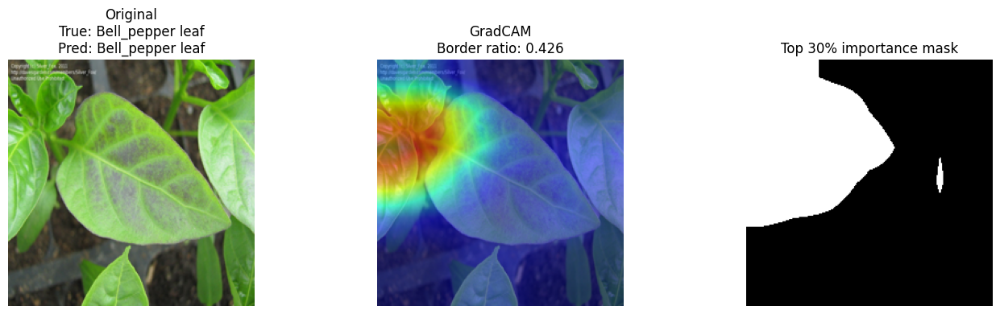

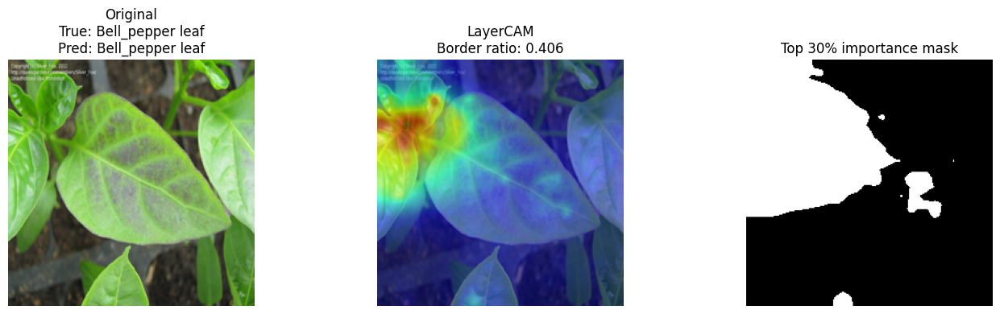

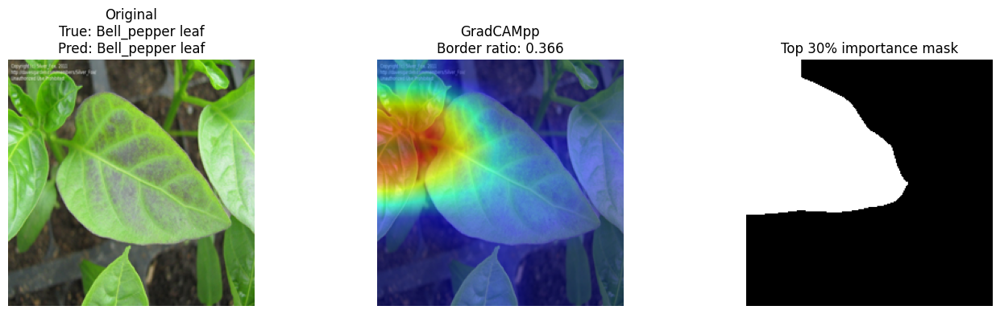

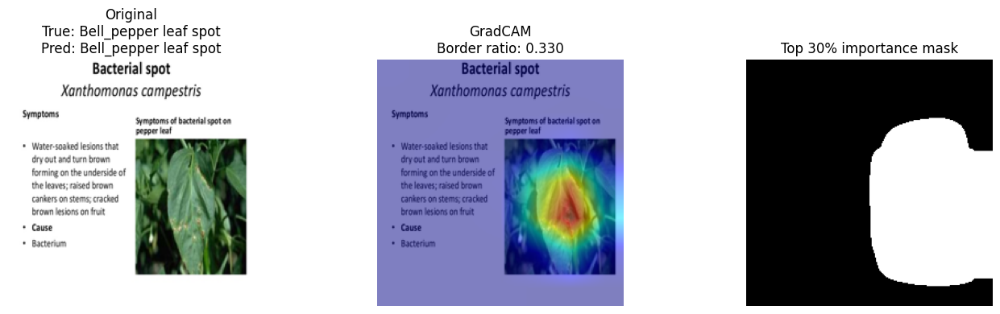

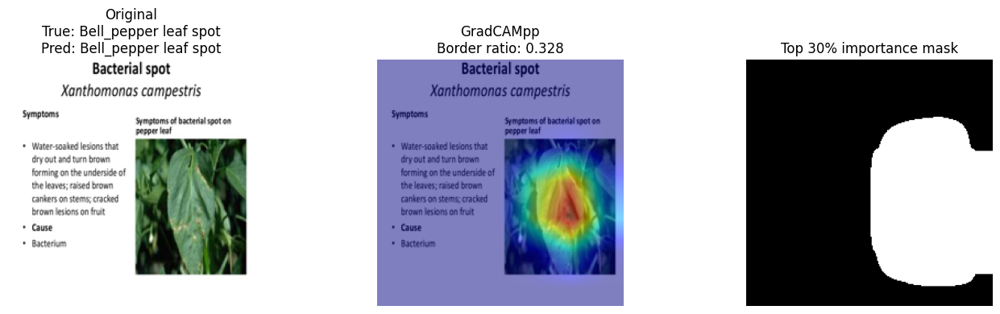

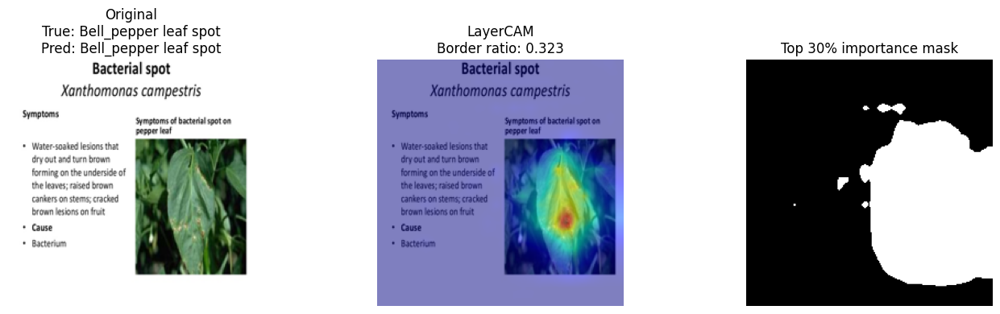

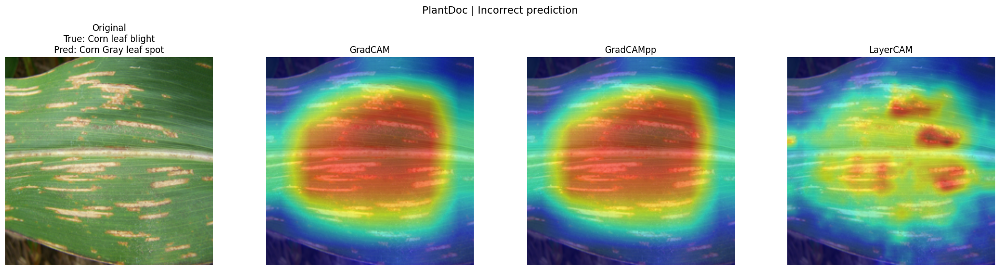

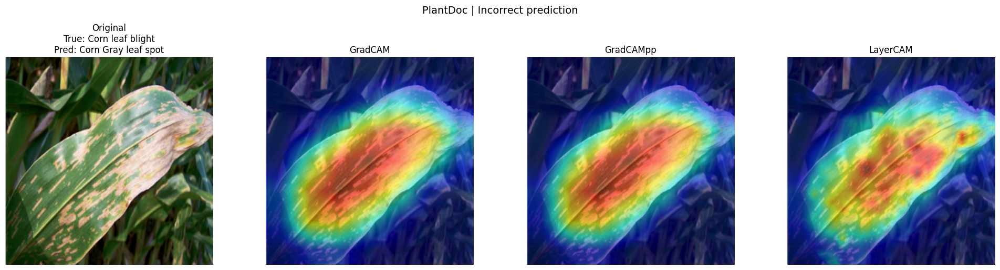

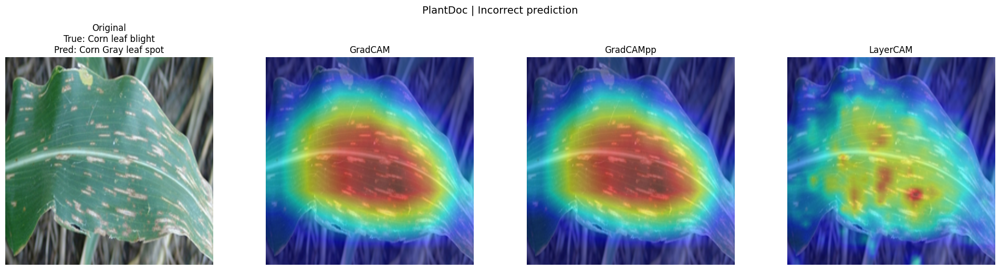

PlantDoc timing:   0%|          | 0/100 [00:00<?, ?it/s]

,index,method,mean,std,min,max
0,0,GradCAM,0.106601,0.123960,0.044235,0.878045
1,1,GradCAMpp,0.105601,0.128608,0.041278,0.940926
2,2,LayerCAM,0.104864,0.121203,0.042505,0.856528


PlantDoc export selection -> correct: 50/153, incorrect: 50/83


PlantDoc XAI figures:   0%|          | 0/100 [00:00<?, ?it/s]

Saved figure manifest: /content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/xai_figure_manifest.csv
Saved HTML gallery: /content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/xai_gallery.html
Saved 50 correct-prediction figures to: /content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/figures/test_set_xai/correct_predictions
Saved 50 incorrect-prediction figures to: /content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/figures/test_set_xai/incorrect_predictions
Saved PlantDoc XAI outputs.


{'artifacts': {'xai_results': '/content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/xai_results.csv',
  'xai_summary': '/content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/xai_summary.csv',
  'timing_summary': '/content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/xai_timing_summary.csv',
  'figures': '/content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/figures/test_set_xai'},
 'completed': True,
 'completed_at': '2026-04-07 23:28:47'}

In [ ]:

print("PlantDoc XAI uses the same three methods as PlantVillage: GradCAM, GradCAMpp, and LayerCAM.")
print("Higher insertion AUC is better. Lower deletion AUC is better.")

plantdoc_correct_results_df = plantdoc_results_df[plantdoc_results_df["correct"]].reset_index(drop=True)

if len(plantdoc_correct_results_df) == 0:
    raise ValueError("No correctly classified PlantDoc test images are available for XAI benchmarking.")

show_prediction_gallery(
    plantdoc_most_confident_correct,
    title="PlantDoc most confident correct predictions",
    n=min(QUAL_REVIEW_COUNT, len(plantdoc_most_confident_correct))
)

show_prediction_gallery(
    plantdoc_most_confident_wrong,
    title="PlantDoc most confident incorrect predictions",
    n=min(QUAL_FAILURE_REVIEW_COUNT, len(plantdoc_most_confident_wrong))
)

plantdoc_example_row = build_representative_xai_sample(
    results_df=plantdoc_results_df,
    target_count=1,
    seed=SEED,
    require_correct=True
).iloc[0]

show_multimethod_xai_row(
    row=plantdoc_example_row,
    model_for_cam=plantdoc_best_model,
    cam_generator=generate_cam_for_row,
    dataset_name="PlantDoc"
)

plantdoc_xai_preview_df = build_representative_xai_sample(
    results_df=plantdoc_results_df,
    target_count=min(3, len(plantdoc_correct_results_df)),
    seed=SEED,
    require_correct=True
)

show_multimethod_xai_preview(
    df_subset=plantdoc_xai_preview_df,
    model_for_cam=plantdoc_best_model,
    cam_generator=generate_cam_for_row,
    dataset_name="PlantDoc"
)

plantdoc_xai_sample_count = min(XAI_SAMPLE_COUNT, len(plantdoc_correct_results_df))
plantdoc_xai_sample_df = build_representative_xai_sample(
    results_df=plantdoc_results_df,
    target_count=plantdoc_xai_sample_count,
    seed=SEED,
    require_correct=True
)

print("Correctly classified PlantDoc test images available:", len(plantdoc_correct_results_df))
print("Representative PlantDoc XAI benchmark sample size:", len(plantdoc_xai_sample_df))
print("Configured qualitative review size (50+ target):", QUAL_REVIEW_COUNT)

if PLANTDOC_XAI_RESULTS_PATH.exists():
    print("PlantDoc XAI results already exist. Loading them instead of recomputing.")
    plantdoc_xai_results_df = pd.read_csv(PLANTDOC_XAI_RESULTS_PATH)
    plantdoc_xai_results_df = finalize_xai_results_table(
        xai_results_df=plantdoc_xai_results_df,
        results_df=plantdoc_results_df,
        dataset_name="PlantDoc",
        split_name="test"
    )
else:
    plantdoc_xai_records = []
    for _, row in tqdm(plantdoc_xai_sample_df.iterrows(), total=len(plantdoc_xai_sample_df), desc="PlantDoc xai benchmark"):
        _, _, input_tensor, _ = load_image_for_xai(row["filepath"])
        target_class = int(row["pred_label_idx"])
        for method_name in ["GradCAM", "GradCAMpp", "LayerCAM"]:
            start_time = time.perf_counter()
            xai_output = generate_cam_for_row(
                plantdoc_best_model,
                row,
                method_name,
                target_class=target_class
            )
            elapsed = time.perf_counter() - start_time
            cam = xai_output["cam"]
            cam_mask = top_percent_mask(cam, TOP_IMPORTANCE_PERCENT)
            border_ratio = compute_border_focus_ratio(cam_mask)
            faithfulness = compute_insertion_deletion_auc(
                model=plantdoc_best_model,
                image_tensor=input_tensor,
                cam=cam,
                target_class=target_class,
                steps=FAITHFULNESS_STEPS,
                insertion_baseline=INSERTION_BASELINE,
                deletion_baseline=DELETION_BASELINE
            )
            plantdoc_xai_records.append({
                "dataset": "PlantDoc",
                "split": "test",
                "sample_id": build_sample_id_from_row(row, dataset_name="PlantDoc"),
                "filepath": row["filepath"],
                "filepath_rel": make_relative_path(row["filepath"], RESEARCH_XAI_ROOT),
                "file_sha256": row.get("file_sha256", None),
                "source_split": row.get("source_split", None),
                "suffix": row.get("suffix", None),
                "true_label_idx": int(row["true_label_idx"]),
                "pred_label_idx": int(row["pred_label_idx"]),
                "true_label_name": row["true_label_name"],
                "pred_label_name": row["pred_label_name"],
                "pred_confidence": float(row["pred_confidence"]),
                "correct": bool(row["correct"]),
                "target_class_idx": int(target_class),
                "method": method_name,
                "generation_time_seconds": float(elapsed),
                "insertion_auc": float(faithfulness["insertion_auc"]),
                "deletion_auc": float(faithfulness["deletion_auc"]),
                "border_focus_ratio": float(border_ratio) if not pd.isna(border_ratio) else np.nan,
                "faithfulness_steps": int(FAITHFULNESS_STEPS),
                "top_importance_percent": float(TOP_IMPORTANCE_PERCENT),
                "insertion_baseline": INSERTION_BASELINE,
                "deletion_baseline": DELETION_BASELINE,
                "fractions_json": serialise_float_list(faithfulness["fractions"]),
                "insertion_curve_json": serialise_float_list(faithfulness["insertion_scores"]),
                "deletion_curve_json": serialise_float_list(faithfulness["deletion_scores"]),
            })
    plantdoc_xai_results_df = pd.DataFrame(plantdoc_xai_records)
    plantdoc_xai_results_df = finalize_xai_results_table(
        xai_results_df=plantdoc_xai_results_df,
        results_df=plantdoc_results_df,
        dataset_name="PlantDoc",
        split_name="test"
    )
    if SAVE_TABLES:
        plantdoc_xai_results_df.to_csv(PLANTDOC_XAI_RESULTS_PATH, index=False)

plantdoc_xai_summary_df = summarise_xai_results_detailed(plantdoc_xai_results_df)
plantdoc_xai_method_ranking_df = build_method_ranking_table(plantdoc_xai_summary_df)
plantdoc_xai_stats_df = compute_paired_method_statistics(plantdoc_xai_results_df, dataset_name="PlantDoc")

fig, axes = plt.subplots(1, 3, figsize=(16, 4))
sns.barplot(data=plantdoc_xai_results_df, x="method", y="insertion_auc", ax=axes[0])
axes[0].set_title("PlantDoc insertion AUC (higher is better)")
sns.barplot(data=plantdoc_xai_results_df, x="method", y="deletion_auc", ax=axes[1])
axes[1].set_title("PlantDoc deletion AUC (lower is better)")
sns.barplot(data=plantdoc_xai_results_df, x="method", y="generation_time_seconds", ax=axes[2])
axes[2].set_title("PlantDoc generation time per image")
fig.tight_layout()
fig.savefig(PLANTDOC_XAI_BARS_FIG_PATH, dpi=200, bbox_inches="tight")
print("Saved figure:", PLANTDOC_XAI_BARS_FIG_PATH)
plt.show()

plantdoc_suspicious_xai_df = (
    plantdoc_xai_results_df
    .sort_values(by=["border_focus_ratio", "pred_confidence"], ascending=[False, False])
    .reset_index(drop=True)
)

plantdoc_qualitative_review_df = build_representative_xai_sample(
    results_df=plantdoc_results_df,
    target_count=min(QUAL_REVIEW_COUNT, len(plantdoc_results_df)),
    seed=SEED,
    require_correct=False
)
plantdoc_failure_review_df = plantdoc_results_df[~plantdoc_results_df["correct"]].copy()
if len(plantdoc_failure_review_df) > 0:
    plantdoc_failure_review_df = plantdoc_failure_review_df.sort_values(
        "pred_confidence", ascending=False
    ).head(min(QUAL_FAILURE_REVIEW_COUNT, len(plantdoc_failure_review_df))).reset_index(drop=True)

display(plantdoc_xai_summary_df)
display(plantdoc_xai_method_ranking_df)
if len(plantdoc_xai_stats_df) > 0:
    display(plantdoc_xai_stats_df)
display(plantdoc_suspicious_xai_df.head(15))

top_plantdoc_suspicious = plantdoc_suspicious_xai_df.head(min(6, len(plantdoc_suspicious_xai_df))).copy()

for _, suspicious_row in top_plantdoc_suspicious.iterrows():
    base_row = plantdoc_results_df[plantdoc_results_df["filepath"] == suspicious_row["filepath"]].iloc[0]
    method_name = suspicious_row["method"]
    xai_output = generate_cam_for_row(plantdoc_best_model, base_row, method_name)
    fig, axes = plt.subplots(1, 3, figsize=(14, 4))
    original = Image.open(base_row["filepath"]).convert("RGB").resize((IMAGE_SIZE, IMAGE_SIZE))
    mask = top_percent_mask(xai_output["cam"], TOP_IMPORTANCE_PERCENT)

    axes[0].imshow(original)
    axes[0].set_title(
        f"Original\nTrue: {base_row['true_label_name']}\nPred: {base_row['pred_label_name']}"
    )
    axes[0].axis("off")

    axes[1].imshow(xai_output["overlay"])
    axes[1].set_title(f"{method_name}\nBorder ratio: {suspicious_row['border_focus_ratio']:.3f}")
    axes[1].axis("off")

    axes[2].imshow(mask, cmap="gray")
    axes[2].set_title(f"Top {int(TOP_IMPORTANCE_PERCENT * 100)}% importance mask")
    axes[2].axis("off")
    plt.tight_layout()
    plt.show()

plantdoc_incorrect_results_df = plantdoc_results_df[~plantdoc_results_df["correct"]].reset_index(drop=True)
if len(plantdoc_incorrect_results_df) == 0:
    print("There are no incorrect PlantDoc predictions to review.")
else:
    plantdoc_wrong_preview_df = plantdoc_incorrect_results_df.sort_values(
        "pred_confidence", ascending=False
    ).head(min(3, len(plantdoc_incorrect_results_df))).reset_index(drop=True)

    show_multimethod_xai_preview(
        df_subset=plantdoc_wrong_preview_df,
        model_for_cam=plantdoc_best_model,
        cam_generator=generate_cam_for_row,
        dataset_name="PlantDoc"
    )

timing_sample_df_plantdoc = plantdoc_xai_sample_df.sample(
    min(TIMING_SAMPLE_COUNT, len(plantdoc_xai_sample_df)),
    random_state=SEED
).reset_index(drop=True)

timing_records_plantdoc = []
for _, row in tqdm(timing_sample_df_plantdoc.iterrows(), total=len(timing_sample_df_plantdoc), desc="PlantDoc timing"):
    for method_name in ["GradCAM", "GradCAMpp", "LayerCAM"]:
        start_time = time.perf_counter()
        _ = generate_cam_for_row(plantdoc_best_model, row, method_name)
        elapsed = time.perf_counter() - start_time
        timing_records_plantdoc.append({
            "filepath": row["filepath"],
            "method": method_name,
            "generation_time_seconds": elapsed
        })

plantdoc_timing_df = pd.DataFrame(timing_records_plantdoc)
plantdoc_timing_summary_df = (
    plantdoc_timing_df.groupby("method", as_index=False)["generation_time_seconds"]
    .agg(["mean", "std", "min", "max"])
    .reset_index()
)

display(plantdoc_timing_summary_df)

if SAVE_XAI_FIGURES:
    plantdoc_testset_xai_dir = PLANTDOC_FIG_DIR / "test_set_xai"
    plantdoc_saved_figure_info = export_testset_xai_figures(
        results_df=plantdoc_results_df,
        output_root=plantdoc_testset_xai_dir,
        model_for_cam=plantdoc_best_model,
        cam_generator=generate_cam_for_row,
        dataset_name="PlantDoc",
        max_correct=XAI_EXPORT_MAX_CORRECT,
        max_incorrect=XAI_EXPORT_MAX_INCORRECT,
        seed=SEED,
        clear_existing=True,
        manifest_path=PLANTDOC_XAI_FIGURE_MANIFEST_PATH,
        gallery_html_path=PLANTDOC_GALLERY_HTML_PATH if SAVE_HTML_GALLERIES else None
    )

plantdoc_figure_manifest_df = pd.DataFrame()
if SAVE_XAI_FIGURES and isinstance(globals().get("plantdoc_saved_figure_info", None), dict):
    plantdoc_figure_manifest_df = globals()["plantdoc_saved_figure_info"].get("manifest_df", pd.DataFrame())

plantdoc_xai_alignment_df = build_xai_alignment_table(
    xai_results_df=plantdoc_xai_results_df,
    figure_manifest_df=plantdoc_figure_manifest_df
)
plantdoc_qualitative_scoring_template_df = build_qualitative_scoring_template(
    xai_results_df=plantdoc_xai_results_df,
    figure_manifest_df=plantdoc_figure_manifest_df
)

if SAVE_TABLES:
    plantdoc_xai_results_df.to_csv(PLANTDOC_XAI_RESULTS_PATH, index=False)
    plantdoc_xai_summary_df.to_csv(PLANTDOC_XAI_SUMMARY_PATH, index=False)
    plantdoc_xai_method_ranking_df.to_csv(PLANTDOC_XAI_METHOD_RANKING_PATH, index=False)
    plantdoc_xai_stats_df.to_csv(PLANTDOC_XAI_STATS_PATH, index=False)
    plantdoc_xai_alignment_df.to_csv(PLANTDOC_XAI_ALIGNMENT_PATH, index=False)
    plantdoc_qualitative_scoring_template_df.to_csv(PLANTDOC_QUALITATIVE_TEMPLATE_PATH, index=False)
    plantdoc_timing_summary_df.to_csv(PLANTDOC_TIMING_SUMMARY_PATH, index=False)
    plantdoc_suspicious_xai_df.to_csv(PLANTDOC_SUSPICIOUS_PATH, index=False)
    plantdoc_qualitative_review_df.to_csv(PLANTDOC_QUAL_SAMPLE_PATH, index=False)
    plantdoc_failure_review_df.to_csv(PLANTDOC_FAILURE_SAMPLE_PATH, index=False)
    write_paper_ready_summary(
        dataset_name="PlantDoc",
        classification_summary_df=plantdoc_classification_summary,
        xai_summary_df=plantdoc_xai_summary_df,
        xai_stats_df=plantdoc_xai_stats_df,
        output_path=PLANTDOC_PAPER_SUMMARY_PATH
    )
    plantdoc_artifact_inventory = {
        "pipeline_version": NOTEBOOK_PIPELINE_VERSION,
        "dataset": "PlantDoc",
        "classification_summary": str(PLANTDOC_CLASSIFICATION_SUMMARY_PATH),
        "classification_report": str(PLANTDOC_REPORT_PATH),
        "results": str(PLANTDOC_RESULTS_PATH),
        "split_manifest": str(PLANTDOC_SPLIT_MANIFEST_PATH),
        "split_integrity": str(PLANTDOC_SPLIT_INTEGRITY_PATH),
        "class_index": str(PLANTDOC_CLASS_INDEX_PATH),
        "xai_results": str(PLANTDOC_XAI_RESULTS_PATH),
        "xai_summary": str(PLANTDOC_XAI_SUMMARY_PATH),
        "xai_method_ranking": str(PLANTDOC_XAI_METHOD_RANKING_PATH),
        "xai_pairwise_statistics": str(PLANTDOC_XAI_STATS_PATH),
        "xai_alignment": str(PLANTDOC_XAI_ALIGNMENT_PATH),
        "xai_timing_summary": str(PLANTDOC_TIMING_SUMMARY_PATH),
        "xai_figure_manifest": str(PLANTDOC_XAI_FIGURE_MANIFEST_PATH),
        "qualitative_scoring_template": str(PLANTDOC_QUALITATIVE_TEMPLATE_PATH),
        "paper_ready_summary": str(PLANTDOC_PAPER_SUMMARY_PATH),
        "html_gallery": str(PLANTDOC_GALLERY_HTML_PATH),
    }
    with open(PLANTDOC_ARTIFACT_INVENTORY_PATH, "w", encoding="utf-8") as f:
        json.dump(plantdoc_artifact_inventory, f, indent=2)
    print("Saved PlantDoc XAI outputs.")

mark_stage_complete(
    state=PIPELINE_STATE,
    state_path=PIPELINE_STATE_PATH,
    dataset_name="plantdoc",
    stage_name="xai_complete",
    artifacts={
        "xai_results": str(PLANTDOC_XAI_RESULTS_PATH),
        "xai_summary": str(PLANTDOC_XAI_SUMMARY_PATH),
        "timing_summary": str(PLANTDOC_TIMING_SUMMARY_PATH),
        "figures": str(PLANTDOC_FIG_DIR / "test_set_xai"),
    }
)


## 63. Save the PlantDoc XAI and run summaries

This final PlantDoc block writes the same style of summary tables used in PlantVillage so cross-dataset comparison stays consistent.


In [ ]:

plantdoc_run_summary = {
    "dataset": "PlantDoc",
    "model": "EfficientNet-B0",
    "xai_methods": ["GradCAM", "GradCAMpp", "LayerCAM"],
    "dropout": PLANTDOC_DROPOUT,
    "epochs_requested": int(PLANTDOC_EPOCHS),
    "epochs_completed": int(len(plantdoc_history["epoch"])),
    "n_classes": len(plantdoc_class_names),
    "train_size": int(len(plantdoc_train_df)),
    "val_size": int(len(plantdoc_val_df)),
    "test_size": int(len(plantdoc_test_df)),
    "test_accuracy": float(plantdoc_test_accuracy),
    "test_macro_precision": float(plantdoc_test_precision),
    "test_macro_recall": float(plantdoc_test_recall),
    "test_macro_f1": float(plantdoc_test_f1),
    "test_macro_auroc_ovr": None if pd.isna(plantdoc_test_auroc) else float(plantdoc_test_auroc),
    "best_epoch": None if plantdoc_best_epoch is None else int(plantdoc_best_epoch),
    "xai_sample_size": int(len(plantdoc_xai_sample_df)),
    "timing_sample_size": int(len(timing_sample_df_plantdoc)),
    "qualitative_review_sample_size": int(len(plantdoc_qualitative_review_df)),
    "failure_review_sample_size": int(len(plantdoc_failure_review_df)),
    "pipeline_version": NOTEBOOK_PIPELINE_VERSION,
    "xai_export_max_correct": int(XAI_EXPORT_MAX_CORRECT),
    "xai_export_max_incorrect": int(XAI_EXPORT_MAX_INCORRECT),
    "top_importance_percent": TOP_IMPORTANCE_PERCENT,
    "faithfulness_steps": FAITHFULNESS_STEPS,
    "total_params": int(plantdoc_model_summary_df.loc[0, "total_params"]),
    "trainable_params": int(plantdoc_model_summary_df.loc[0, "trainable_params"]),
    "xai_alignment_path": str(PLANTDOC_XAI_ALIGNMENT_PATH),
    "xai_statistics_path": str(PLANTDOC_XAI_STATS_PATH),
    "xai_method_ranking_path": str(PLANTDOC_XAI_METHOD_RANKING_PATH),
    "figure_manifest_path": str(PLANTDOC_XAI_FIGURE_MANIFEST_PATH),
    "qualitative_scoring_template_path": str(PLANTDOC_QUALITATIVE_TEMPLATE_PATH),
    "paper_ready_summary_path": str(PLANTDOC_PAPER_SUMMARY_PATH)
}

if SAVE_TABLES:
    with open(PLANTDOC_RUN_SUMMARY_PATH, "w", encoding="utf-8") as f:
        json.dump(plantdoc_run_summary, f, indent=2)

comparison_dir = RESEARCH_XAI_ROOT / "comparison_outputs"
comparison_dir.mkdir(parents=True, exist_ok=True)

combined_classification_rows = []
if SUMMARY_PATH.exists():
    with open(SUMMARY_PATH, "r", encoding="utf-8") as f:
        plantvillage_run_summary = json.load(f)
    combined_classification_rows.append({
        "dataset": plantvillage_run_summary.get("dataset", "PlantVillage"),
        "dropout": plantvillage_run_summary.get("dropout"),
        "epochs_requested": plantvillage_run_summary.get("epochs_requested"),
        "epochs_completed": plantvillage_run_summary.get("epochs_completed"),
        "accuracy": plantvillage_run_summary.get("test_accuracy"),
        "macro_precision": plantvillage_run_summary.get("test_macro_precision"),
        "macro_recall": plantvillage_run_summary.get("test_macro_recall"),
        "macro_f1": plantvillage_run_summary.get("test_macro_f1"),
        "macro_auroc_ovr": plantvillage_run_summary.get("test_macro_auroc_ovr"),
        "best_epoch": plantvillage_run_summary.get("best_epoch"),
        "n_classes": plantvillage_run_summary.get("n_classes"),
        "train_size": plantvillage_run_summary.get("train_size"),
        "val_size": plantvillage_run_summary.get("val_size"),
        "test_size": plantvillage_run_summary.get("test_size"),
        "total_params": plantvillage_run_summary.get("total_params"),
        "trainable_params": plantvillage_run_summary.get("trainable_params"),
    })

combined_classification_rows.append({
    "dataset": "PlantDoc",
    "dropout": PLANTDOC_DROPOUT,
    "epochs_requested": PLANTDOC_EPOCHS,
    "epochs_completed": len(plantdoc_history["epoch"]),
    "accuracy": plantdoc_test_accuracy,
    "macro_precision": plantdoc_test_precision,
    "macro_recall": plantdoc_test_recall,
    "macro_f1": plantdoc_test_f1,
    "macro_auroc_ovr": plantdoc_test_auroc,
    "best_epoch": plantdoc_best_epoch,
    "n_classes": len(plantdoc_class_names),
    "train_size": len(plantdoc_train_df),
    "val_size": len(plantdoc_val_df),
    "test_size": len(plantdoc_test_df),
    "total_params": int(plantdoc_model_summary_df.loc[0, "total_params"]),
    "trainable_params": int(plantdoc_model_summary_df.loc[0, "trainable_params"]),
})

combined_classification_df = pd.DataFrame(combined_classification_rows)
display(combined_classification_df)

combined_xai_rows = []
if PLANTVILLAGE_XAI_SUMMARY_PATH.exists():
    plantvillage_xai_summary_df = pd.read_csv(PLANTVILLAGE_XAI_SUMMARY_PATH)
    plantvillage_xai_summary_df.insert(0, "dataset", "PlantVillage")
    combined_xai_rows.append(plantvillage_xai_summary_df)

plantdoc_xai_summary_export_df = plantdoc_xai_summary_df.copy()
plantdoc_xai_summary_export_df.insert(0, "dataset", "PlantDoc")
combined_xai_rows.append(plantdoc_xai_summary_export_df)

combined_xai_summary_df = pd.concat(combined_xai_rows, ignore_index=True)
display(combined_xai_summary_df)

combined_xai_results_rows = []
if XAI_RESULTS_PATH.exists():
    pv_xai_results_for_export = pd.read_csv(XAI_RESULTS_PATH)
    pv_xai_results_for_export["dataset"] = pv_xai_results_for_export.get("dataset", "PlantVillage")
    combined_xai_results_rows.append(pv_xai_results_for_export)
combined_xai_results_rows.append(plantdoc_xai_results_df.copy())
combined_xai_results_df = pd.concat(combined_xai_results_rows, ignore_index=True)

combined_xai_stats_rows = []
if PLANTVILLAGE_XAI_STATS_PATH.exists():
    combined_xai_stats_rows.append(pd.read_csv(PLANTVILLAGE_XAI_STATS_PATH))
combined_xai_stats_rows.append(plantdoc_xai_stats_df.copy())
combined_xai_stats_df = pd.concat(combined_xai_stats_rows, ignore_index=True)

combined_xai_ranking_rows = []
if PLANTVILLAGE_XAI_METHOD_RANKING_PATH.exists():
    pv_ranking = pd.read_csv(PLANTVILLAGE_XAI_METHOD_RANKING_PATH)
    pv_ranking.insert(0, "dataset", "PlantVillage") if "dataset" not in pv_ranking.columns else None
    combined_xai_ranking_rows.append(pv_ranking)
plantdoc_ranking_export_df = plantdoc_xai_method_ranking_df.copy()
plantdoc_ranking_export_df.insert(0, "dataset", "PlantDoc") if "dataset" not in plantdoc_ranking_export_df.columns else None
combined_xai_ranking_rows.append(plantdoc_ranking_export_df)
combined_xai_ranking_df = pd.concat(combined_xai_ranking_rows, ignore_index=True)

combined_alignment_rows = []
if PLANTVILLAGE_XAI_ALIGNMENT_PATH.exists():
    combined_alignment_rows.append(pd.read_csv(PLANTVILLAGE_XAI_ALIGNMENT_PATH))
combined_alignment_rows.append(plantdoc_xai_alignment_df.copy())
combined_xai_alignment_df = pd.concat(combined_alignment_rows, ignore_index=True)

if SAVE_TABLES:
    combined_classification_df.to_csv(comparison_dir / "combined_classification_summary.csv", index=False)
    combined_xai_summary_df.to_csv(comparison_dir / "combined_xai_summary.csv", index=False)
    combined_xai_results_df.to_csv(comparison_dir / "combined_xai_results.csv", index=False)
    combined_xai_stats_df.to_csv(comparison_dir / "combined_xai_pairwise_statistics.csv", index=False)
    combined_xai_ranking_df.to_csv(comparison_dir / "combined_xai_method_ranking.csv", index=False)
    combined_xai_alignment_df.to_csv(comparison_dir / "combined_xai_alignment.csv", index=False)

mark_stage_complete(
    state=PIPELINE_STATE,
    state_path=PIPELINE_STATE_PATH,
    dataset_name="plantdoc",
    stage_name="phase_complete",
    artifacts={
        "summary": str(PLANTDOC_RUN_SUMMARY_PATH),
        "results": str(PLANTDOC_RESULTS_PATH),
        "xai_results": str(PLANTDOC_XAI_RESULTS_PATH),
        "figures": str(PLANTDOC_FIG_DIR / "test_set_xai"),
    }
)


,dataset,dropout,epochs_requested,epochs_completed,accuracy,macro_precision,macro_recall,macro_f1,macro_auroc_ovr,best_epoch,n_classes,train_size,val_size,test_size,total_params,trainable_params
0,PlantVillage,0.5,10,10,0.992244,0.987975,0.992251,0.990001,0.999480,7,15,16499,2062,2063,4026763,4026763
1,PlantDoc,0.1,20,20,0.648305,0.638744,0.627555,0.610268,0.979853,13,28,2097,233,236,4043416,4043416


,dataset,method,n_images,n_records,mean_time_seconds,std_time_seconds,median_time_seconds,mean_insertion_auc,std_insertion_auc,median_insertion_auc,mean_deletion_auc,std_deletion_auc,median_deletion_auc,mean_border_focus_ratio,std_border_focus_ratio,median_border_focus_ratio
0,PlantVillage,GradCAM,200,200,0.036963,0.008775,0.033460,0.777928,0.102985,0.787670,0.371442,0.093912,0.369218,0.034095,0.048668,0.016475
1,PlantVillage,GradCAMpp,200,200,0.038293,0.010150,0.033799,0.777718,0.103397,0.788530,0.372255,0.095161,0.369265,0.035057,0.049646,0.016774
2,PlantVillage,LayerCAM,200,200,0.038688,0.007571,0.034891,0.765343,0.105885,0.772150,0.372681,0.102708,0.364393,0.041435,0.050927,0.025875
3,PlantDoc,GradCAM,153,153,0.096495,0.077132,0.077981,0.645856,0.214084,0.693504,0.227573,0.134610,0.216379,0.047004,0.065838,0.023849
4,PlantDoc,GradCAMpp,153,153,0.073695,0.068790,0.055183,0.638609,0.218361,0.693297,0.233926,0.134901,0.218142,0.040171,0.058832,0.022188
5,PlantDoc,LayerCAM,153,153,0.074464,0.066226,0.055607,0.672728,0.204434,0.709923,0.209146,0.135007,0.190118,0.055470,0.064249,0.036205


{'artifacts': {'summary': '/content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/run_summary.json',
  'results': '/content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/test_results.csv',
  'xai_results': '/content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/tables/xai_results.csv',
  'figures': '/content/drive/MyDrive/Research XAI/plantdoc_xai_outputs/figures/test_set_xai'},
 'completed': True,
 'completed_at': '2026-04-07 23:28:51'}

This final optional cell writes a tiny smoke-test status file when the full notebook smoke test is enabled.


In [ ]:
if RUN_FULL_NOTEBOOK_SMOKE_TEST:
    plantvillage_train_size = int(len(train_df)) if "train_df" in globals() else None
    plantvillage_val_size = int(len(val_df)) if "val_df" in globals() else None
    plantvillage_test_size = int(len(test_df)) if "test_df" in globals() else None

    if (plantvillage_train_size is None or plantvillage_val_size is None or plantvillage_test_size is None) and SUMMARY_PATH.exists():
        with open(SUMMARY_PATH, "r", encoding="utf-8") as f:
            _plantvillage_summary = json.load(f)
        plantvillage_train_size = _plantvillage_summary.get("train_size")
        plantvillage_val_size = _plantvillage_summary.get("val_size")
        plantvillage_test_size = _plantvillage_summary.get("test_size")

    smoke_status = {
        "mode": "full_notebook_smoke_test",
        "plantvillage_outputs": str(OUTPUT_ROOT),
        "plantdoc_outputs": str(PLANTDOC_OUTPUT_ROOT),
        "plantvillage_train_size": plantvillage_train_size,
        "plantvillage_val_size": plantvillage_val_size,
        "plantvillage_test_size": plantvillage_test_size,
        "plantdoc_train_size": int(len(plantdoc_train_df)),
        "plantdoc_val_size": int(len(plantdoc_val_df)),
        "plantdoc_test_size": int(len(plantdoc_test_df)),
        "xai_sample_count": int(XAI_SAMPLE_COUNT),
        "timing_sample_count": int(TIMING_SAMPLE_COUNT),
        "qual_review_count": int(QUAL_REVIEW_COUNT),
        "epochs": int(EPOCHS),
        "status": "completed"
    }
    with open(SMOKE_STATUS_PATH, "w", encoding="utf-8") as f:
        json.dump(smoke_status, f, indent=2)
    print("Saved smoke-test status:", SMOKE_STATUS_PATH)
    print(json.dumps(smoke_status, indent=2))
else:
    print("End-to-end smoke-test status cell skipped because RUN_FULL_NOTEBOOK_SMOKE_TEST is False.")


End-to-end smoke-test status cell skipped because RUN_FULL_NOTEBOOK_SMOKE_TEST is False.
